# Analysis of liver ss3 data

- Import python packages 

In [1]:
import numpy as np
import scanpy as sc
import pandas as pd
import anndata as ad
import igraph
import leidenalg
import matplotlib.pyplot as plt

In [2]:
import warnings 
warnings.filterwarnings('ignore')
sc.settings.verbosity = 0 # verbosity: errors (0), warnings (1), info (2), hints (3)

In [3]:
import math
import plotly.graph_objects as go
import plotly.express
from matplotlib.pyplot import figure
from adjustText import adjust_text

## Import all files (count, barcodes, metadata)

 - Import the .loom file for analysis (counts), replace with your own path for your file
 - you can rename the object as you want, this where you will store all the data and analysis

In [4]:
liver_ss3 = ad.read_loom("/Users/tgrxj/Desktop/Internship/Dana_dataset/Dana_dataset/ss3_full.loom",
                         sparse = True,
                         obs_names = 'cell names',
                         var_names = 'gene names',
                        )

In [5]:
 liver_ss3 

AnnData object with n_obs × n_vars = 5251 × 56941
    obs: 'CellID'
    var: 'Accession', 'Chromosome', 'End', 'Gene', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

## Import additional files to add information in observation layer

 - import the barcode file with cell barcode and the corresponding index


- 5251 cells and 56941 transcripts are detected

In [6]:
bc = pd.read_table("/Users/tgrxj/Desktop/Internship/Dana_dataset/Dana_dataset/Barcodes_NexteraLCL_Indexing.txt",
                   delimiter = '\t')
bc

,N7XX,N5XX,Index1,Index2,XC,XC_NovaSeq,i7loc,i7row,i7col,i5loc,i5row,i5col,BCset,WellID,XC_DNBPE
0,ATAGGCGCTC,TTGGTACGCG,GAGCGCCTAT,CGCGTACCAA,GAGCGCCTATCGCGTACCAA,GAGCGCCTATTTGGTACGCG,A1,A,1,A1,A,1,1A,A1,CGCGTACCAAATAGGCGCTC
1,TACAACCTCA,TTGGTACGCG,TGAGGTTGTA,CGCGTACCAA,TGAGGTTGTACGCGTACCAA,TGAGGTTGTATTGGTACGCG,B1,B,1,A1,A,1,1B,A1,CGCGTACCAATACAACCTCA
2,AGTTATCGGA,TTGGTACGCG,TCCGATAACT,CGCGTACCAA,TCCGATAACTCGCGTACCAA,TCCGATAACTTTGGTACGCG,C1,C,1,A1,A,1,1C,A1,CGCGTACCAAAGTTATCGGA
3,AGGAGCTTCC,TTGGTACGCG,GGAAGCTCCT,CGCGTACCAA,GGAAGCTCCTCGCGTACCAA,GGAAGCTCCTTTGGTACGCG,D1,D,1,A1,A,1,1D,A1,CGCGTACCAAAGGAGCTTCC
4,CATGCTGTTA,TTGGTACGCG,TAACAGCATG,CGCGTACCAA,TAACAGCATGCGCGTACCAA,TAACAGCATGTTGGTACGCG,E1,E,1,A1,A,1,1E,A1,CGCGTACCAACATGCTGTTA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
147451,TTACCTCCTA,GTTCCTCTAA,TAGGAGGTAA,TTAGAGGAAC,TAGGAGGTAATTAGAGGAAC,TAGGAGGTAAGTTCCTCTAA,L24,L,24,P24,P,24,24L,P24,TTAGAGGAACTTACCTCCTA
147452,GATTCTCGAA,GTTCCTCTAA,TTCGAGAATC,TTAGAGGAAC,TTCGAGAATCTTAGAGGAAC,TTCGAGAATCGTTCCTCTAA,M24,M,24,P24,P,24,24M,P24,TTAGAGGAACGATTCTCGAA
147453,CTTAAGTGAC,GTTCCTCTAA,GTCACTTAAG,TTAGAGGAAC,GTCACTTAAGTTAGAGGAAC,GTCACTTAAGGTTCCTCTAA,N24,N,24,P24,P,24,24N,P24,TTAGAGGAACCTTAAGTGAC
147454,GTAGATGGTA,GTTCCTCTAA,TACCATCTAC,TTAGAGGAAC,TACCATCTACTTAGAGGAAC,TACCATCTACGTTCCTCTAA,O24,O,24,P24,P,24,24O,P24,TTAGAGGAACGTAGATGGTA


Import the plate file with information on age, sexe, replicates based on index (metadata)

In [7]:
plates = pd.read_excel("/Users/tgrxj/Desktop/Internship/Dana_dataset/Dana_dataset/plates_xpress_swati.xlsx")
plates

,Plate,Index,Age,Sex,Replicate,PlateN
0,SP_1_p1,12L,Old,Female,1,p1
1,SP_1_p2,18M,Old,Female,1,p2
2,SP_1_p3,20P,Old,Female,1,p3
3,SP_2_p1,4M,Old,Female,2,p1
4,SP_2_p2,14J,Old,Female,2,p2
5,SP_2_p3,10K,Old,Female,2,p3
6,SampleB_150322,8D,Old,Male,1,Nucleip1
7,SP_3_p1,22N,Old,Male,1,p1
8,SP_3_p2,3B,Old,Male,1,p2
9,SP_3_p3,3A,Old,Male,1,p3


## Matching the data between the different files

Change the observation column with correct CellID

In [8]:
liver_ss3.obs

,CellID
0,ss3_full:AACTGCGGAGCCATAGGTATx
1,ss3_full:AACTGCGGAGTAAGTGCTCGx
2,ss3_full:AACGTACCGTTGCCTACGTCx
3,ss3_full:AAGCGCCGAGCGATGACCTTx
4,ss3_full:AACTGCGGAGCAGCCACAAGx
...,...
5246,ss3_full:TTGTGGTTCGTTGCTCTAACx
5247,ss3_full:TTGTTACTCCAAGCCTGTTAx
5248,ss3_full:TTGTTACTCCCCTCAGAATAx
5249,ss3_full:TTGTTCGGATAAGCCTGTTAx


In [9]:
cellid = liver_ss3.obs
cellid = cellid.replace(to_replace = 'ss3_full:' , value = '', regex = True)
cellid = cellid.replace(to_replace = 'x' , value = '', regex = True)

In [10]:
cellid

,CellID
0,AACTGCGGAGCCATAGGTAT
1,AACTGCGGAGTAAGTGCTCG
2,AACGTACCGTTGCCTACGTC
3,AAGCGCCGAGCGATGACCTT
4,AACTGCGGAGCAGCCACAAG
...,...
5246,TTGTGGTTCGTTGCTCTAAC
5247,TTGTTACTCCAAGCCTGTTA
5248,TTGTTACTCCCCTCAGAATA
5249,TTGTTCGGATAAGCCTGTTA


In [11]:
liver_ss3.obs['cellid'] = cellid
liver_ss3.obs

,CellID,cellid
0,ss3_full:AACTGCGGAGCCATAGGTATx,AACTGCGGAGCCATAGGTAT
1,ss3_full:AACTGCGGAGTAAGTGCTCGx,AACTGCGGAGTAAGTGCTCG
2,ss3_full:AACGTACCGTTGCCTACGTCx,AACGTACCGTTGCCTACGTC
3,ss3_full:AAGCGCCGAGCGATGACCTTx,AAGCGCCGAGCGATGACCTT
4,ss3_full:AACTGCGGAGCAGCCACAAGx,AACTGCGGAGCAGCCACAAG
...,...,...
5246,ss3_full:TTGTGGTTCGTTGCTCTAACx,TTGTGGTTCGTTGCTCTAAC
5247,ss3_full:TTGTTACTCCAAGCCTGTTAx,TTGTTACTCCAAGCCTGTTA
5248,ss3_full:TTGTTACTCCCCTCAGAATAx,TTGTTACTCCCCTCAGAATA
5249,ss3_full:TTGTTCGGATAAGCCTGTTAx,TTGTTCGGATAAGCCTGTTA


## Join information between cell ID and age, sexe, replicates

In [12]:
# check if cellID and XC column are corresponding
# this operation only considers unique values, removing the duplicates
join_cellid = list(set(cellid.loc[:,'CellID']).intersection(bc.loc[:,'XC']))
len(join_cellid)

4993

In [13]:
# rename the BCset to INdex to merge the information between bc and plates
bc = bc.rename(columns = {'BCset':'Index'})
bc

,N7XX,N5XX,Index1,Index2,XC,XC_NovaSeq,i7loc,i7row,i7col,i5loc,i5row,i5col,Index,WellID,XC_DNBPE
0,ATAGGCGCTC,TTGGTACGCG,GAGCGCCTAT,CGCGTACCAA,GAGCGCCTATCGCGTACCAA,GAGCGCCTATTTGGTACGCG,A1,A,1,A1,A,1,1A,A1,CGCGTACCAAATAGGCGCTC
1,TACAACCTCA,TTGGTACGCG,TGAGGTTGTA,CGCGTACCAA,TGAGGTTGTACGCGTACCAA,TGAGGTTGTATTGGTACGCG,B1,B,1,A1,A,1,1B,A1,CGCGTACCAATACAACCTCA
2,AGTTATCGGA,TTGGTACGCG,TCCGATAACT,CGCGTACCAA,TCCGATAACTCGCGTACCAA,TCCGATAACTTTGGTACGCG,C1,C,1,A1,A,1,1C,A1,CGCGTACCAAAGTTATCGGA
3,AGGAGCTTCC,TTGGTACGCG,GGAAGCTCCT,CGCGTACCAA,GGAAGCTCCTCGCGTACCAA,GGAAGCTCCTTTGGTACGCG,D1,D,1,A1,A,1,1D,A1,CGCGTACCAAAGGAGCTTCC
4,CATGCTGTTA,TTGGTACGCG,TAACAGCATG,CGCGTACCAA,TAACAGCATGCGCGTACCAA,TAACAGCATGTTGGTACGCG,E1,E,1,A1,A,1,1E,A1,CGCGTACCAACATGCTGTTA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
147451,TTACCTCCTA,GTTCCTCTAA,TAGGAGGTAA,TTAGAGGAAC,TAGGAGGTAATTAGAGGAAC,TAGGAGGTAAGTTCCTCTAA,L24,L,24,P24,P,24,24L,P24,TTAGAGGAACTTACCTCCTA
147452,GATTCTCGAA,GTTCCTCTAA,TTCGAGAATC,TTAGAGGAAC,TTCGAGAATCTTAGAGGAAC,TTCGAGAATCGTTCCTCTAA,M24,M,24,P24,P,24,24M,P24,TTAGAGGAACGATTCTCGAA
147453,CTTAAGTGAC,GTTCCTCTAA,GTCACTTAAG,TTAGAGGAAC,GTCACTTAAGTTAGAGGAAC,GTCACTTAAGGTTCCTCTAA,N24,N,24,P24,P,24,24N,P24,TTAGAGGAACCTTAAGTGAC
147454,GTAGATGGTA,GTTCCTCTAA,TACCATCTAC,TTAGAGGAAC,TACCATCTACTTAGAGGAAC,TACCATCTACGTTCCTCTAA,O24,O,24,P24,P,24,24O,P24,TTAGAGGAACGTAGATGGTA


In [14]:
# merged dataset, BC and plates
merged_df = pd.merge(plates, bc, on = 'Index')
metadata = merged_df[['Plate','Index','Age','Sex','Replicate','PlateN','XC']]
metadata

,Plate,Index,Age,Sex,Replicate,PlateN,XC
0,SP_1_p1,12L,Old,Female,1,p1,CAATCGCCTACTATCACGCG
1,SP_1_p1,12L,Old,Female,1,p1,TTCTTCAAGGCTATCACGCG
2,SP_1_p1,12L,Old,Female,1,p1,TCGGTAACACCTATCACGCG
3,SP_1_p1,12L,Old,Female,1,p1,CGACATGCGTCTATCACGCG
4,SP_1_p1,12L,Old,Female,1,p1,TTACGGTAACCTATCACGCG
...,...,...,...,...,...,...,...
11515,SP_Y_M2_p3,9C,Young,Male,2,p3,GGACAGATATCCGTTCTAGA
11516,SP_Y_M2_p3,9C,Young,Male,2,p3,TCACTGTTCTCCGTTCTAGA
11517,SP_Y_M2_p3,9C,Young,Male,2,p3,TACCTATTGCCCGTTCTAGA
11518,SP_Y_M2_p3,9C,Young,Male,2,p3,TGATGGTATGCCGTTCTAGA


In [15]:
# reorder metadata based on obs of liver_ss3
metadata = metadata.set_index('XC')
metadata = metadata.reindex(index=liver_ss3.obs['cellid'])
metadata = metadata.reset_index()
metadata

,cellid,Plate,Index,Age,Sex,Replicate,PlateN
0,AACTGCGGAGCCATAGGTAT,SP_34,7E,Old,Male,2.0,p4
1,AACTGCGGAGTAAGTGCTCG,SP_34,7E,Old,Male,2.0,p4
2,AACGTACCGTTGCCTACGTC,SP_Y_M2_p2,19J,Young,Male,2.0,p2
3,AAGCGCCGAGCGATGACCTT,NaN,NaN,NaN,NaN,NaN,NaN
4,AACTGCGGAGCAGCCACAAG,SP_34,7E,Old,Male,2.0,p4
...,...,...,...,...,...,...,...
5246,TTGTGGTTCGTTGCTCTAAC,SP_3_p2,3B,Old,Male,1.0,p2
5247,TTGTTACTCCAAGCCTGTTA,SP_Y_F1_p3,7B,Young,Female,1.0,p3
5248,TTGTTACTCCCCTCAGAATA,SP_Y_F1_p3,7B,Young,Female,1.0,p3
5249,TTGTTCGGATAAGCCTGTTA,SP_34,7E,Old,Male,2.0,p4


In [16]:
liver_ss3.obs = liver_ss3.obs.set_index('cellid').join(metadata.set_index('cellid'))


In [17]:
#remove cells without metadata 
liver_ss3 = liver_ss3[list(liver_ss3.obs.dropna().index)].copy()

In [18]:
liver_ss3.obs


,CellID,Plate,Index,Age,Sex,Replicate,PlateN
cellid,,,,,,,
AACTGCGGAGCCATAGGTAT,ss3_full:AACTGCGGAGCCATAGGTATx,SP_34,7E,Old,Male,2.0,p4
AACTGCGGAGTAAGTGCTCG,ss3_full:AACTGCGGAGTAAGTGCTCGx,SP_34,7E,Old,Male,2.0,p4
AACGTACCGTTGCCTACGTC,ss3_full:AACGTACCGTTGCCTACGTCx,SP_Y_M2_p2,19J,Young,Male,2.0,p2
AACTGCGGAGCAGCCACAAG,ss3_full:AACTGCGGAGCAGCCACAAGx,SP_34,7E,Old,Male,2.0,p4
AACTGCGCCATGGACGGAGT,ss3_full:AACTGCGCCATGGACGGAGTx,SP_Y_M1_p2,10G,Young,Male,1.0,p2
...,...,...,...,...,...,...,...
TTGTGGTTCGTTGCTCTAAC,ss3_full:TTGTGGTTCGTTGCTCTAACx,SP_3_p2,3B,Old,Male,1.0,p2
TTGTTACTCCAAGCCTGTTA,ss3_full:TTGTTACTCCAAGCCTGTTAx,SP_Y_F1_p3,7B,Young,Female,1.0,p3
TTGTTACTCCCCTCAGAATA,ss3_full:TTGTTACTCCCCTCAGAATAx,SP_Y_F1_p3,7B,Young,Female,1.0,p3


In [19]:
liver_ss3.obs['Replicate']=liver_ss3.obs['Replicate'].astype('category')

In [20]:
liver_ss3.obs

,CellID,Plate,Index,Age,Sex,Replicate,PlateN
cellid,,,,,,,
AACTGCGGAGCCATAGGTAT,ss3_full:AACTGCGGAGCCATAGGTATx,SP_34,7E,Old,Male,2.0,p4
AACTGCGGAGTAAGTGCTCG,ss3_full:AACTGCGGAGTAAGTGCTCGx,SP_34,7E,Old,Male,2.0,p4
AACGTACCGTTGCCTACGTC,ss3_full:AACGTACCGTTGCCTACGTCx,SP_Y_M2_p2,19J,Young,Male,2.0,p2
AACTGCGGAGCAGCCACAAG,ss3_full:AACTGCGGAGCAGCCACAAGx,SP_34,7E,Old,Male,2.0,p4
AACTGCGCCATGGACGGAGT,ss3_full:AACTGCGCCATGGACGGAGTx,SP_Y_M1_p2,10G,Young,Male,1.0,p2
...,...,...,...,...,...,...,...
TTGTGGTTCGTTGCTCTAAC,ss3_full:TTGTGGTTCGTTGCTCTAACx,SP_3_p2,3B,Old,Male,1.0,p2
TTGTTACTCCAAGCCTGTTA,ss3_full:TTGTTACTCCAAGCCTGTTAx,SP_Y_F1_p3,7B,Young,Female,1.0,p3
TTGTTACTCCCCTCAGAATA,ss3_full:TTGTTACTCCCCTCAGAATAx,SP_Y_F1_p3,7B,Young,Female,1.0,p3


 - Now we have a observation layer with relevant biological information.

In [21]:
liver_ss3.var # var stands for genes/transcripts

,Accession,Chromosome,End,Gene,Start,Strand
0,ENSMUSG00000051951,1,3741721,Xkr4,3276124,-
1,ENSMUSG00000103377,1,3438772,Gm37180,3435954,-
2,ENSMUSG00000104017,1,3448011,Gm37363,3445779,-
3,ENSMUSG00000103025,1,3537508,Gm37686,3535200,-
4,ENSMUSG00000103201,1,3584730,Gm37329,3582674,-
...,...,...,...,...,...,...
56936,ENSMUSG00000100533,Y,90288770,Gm29504,90286493,+
56937,ENSMUSG00000096178,Y,90444532,Gm20837,90412517,+
56938,ENSMUSG00000095134,Y,90774754,Mid1-ps1,90764326,+
56939,ENSMUSG00000096768,Y,90827734,Gm47283,90796007,+


# Preprocessing

Genes that yield the highest fraction of counts in each single cell, across all cells.

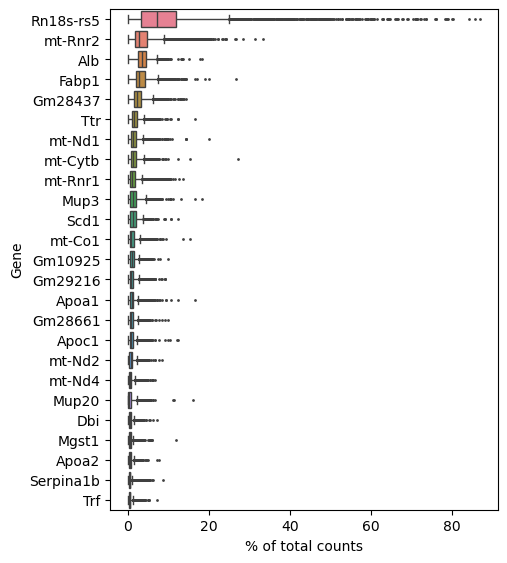

In [22]:
liver_ss3.var_names = liver_ss3.var['Gene']
sc.pl.highest_expr_genes(liver_ss3, n_top=25)

In [23]:
import scanpy as sc
print(sc.__version__)

1.10.1


In [24]:
import scanpy as sc
from scanpy import preprocessing as pp 

#### Filtering

In [25]:
pp.filter_cells(liver_ss3, min_genes=800)
pp.filter_genes(liver_ss3, min_cells=10)

filtered out genes that are detected in less than 10 cells

In [26]:
liver_ss3

AnnData object with n_obs × n_vars = 3018 × 15442
    obs: 'CellID', 'Plate', 'Index', 'Age', 'Sex', 'Replicate', 'PlateN', 'n_genes'
    var: 'Accession', 'Chromosome', 'End', 'Gene', 'Start', 'Strand', 'n_cells'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [27]:
liver_ss3.var

,Accession,Chromosome,End,Gene,Start,Strand,n_cells
Gene,,,,,,,
Gm37381,ENSMUSG00000102343,1,4056438,Gm37381,3975962,-,31
Gm6085,ENSMUSG00000098104,1,4759626,Gm6085,4758157,-,29
Mrpl15,ENSMUSG00000033845,1,4855962,Mrpl15,4843429,-,2301
Gm57122,ENSMUSG00000120372,1,7159048,Gm57122,7158447,-,27
Gm26901,ENSMUSG00000097797,1,7468093,Gm26901,7419630,-,22
...,...,...,...,...,...,...,...
Eif2s3y,ENSMUSG00000069049,Y,1028847,Eif2s3y,1010543,+,1252
Gm29650,ENSMUSG00000099876,Y,1049134,Gm29650,1048393,+,22
Gapdh-ps15,ENSMUSG00000096438,Y,38576129,Gapdh-ps15,38575128,+,469


In [28]:
liver_ss3.obs

,CellID,Plate,Index,Age,Sex,Replicate,PlateN,n_genes
cellid,,,,,,,,
AACGTACCGTTGCCTACGTC,ss3_full:AACGTACCGTTGCCTACGTCx,SP_Y_M2_p2,19J,Young,Male,2.0,p2,2514
AACTGCGCCATGGACGGAGT,ss3_full:AACTGCGCCATGGACGGAGTx,SP_Y_M1_p2,10G,Young,Male,1.0,p2,3421
AACGTACCGTGAATAGACCA,ss3_full:AACGTACCGTGAATAGACCAx,SP_2_p2,14J,Old,Female,2.0,p2,2949
AACGTACCGTGGAGATTGAA,ss3_full:AACGTACCGTGGAGATTGAAx,SP_2_p2,14J,Old,Female,2.0,p2,1312
AACGTACCGTCCGTATCATA,ss3_full:AACGTACCGTCCGTATCATAx,SP_Y_M2_p2,19J,Young,Male,2.0,p2,6871
...,...,...,...,...,...,...,...,...
TTGTTACTCCTAAGTGCTCG,ss3_full:TTGTTACTCCTAAGTGCTCGx,SP_Y_F1_p3,7B,Young,Female,1.0,p3,4021
TTGTTACTCCTTGTGTCTTC,ss3_full:TTGTTACTCCTTGTGTCTTCx,SP_3_p2,3B,Old,Male,1.0,p2,3275
TTGTTACTCCGTGTTCCACG,ss3_full:TTGTTACTCCGTGTTCCACGx,SP_Y_F1_p3,7B,Young,Female,1.0,p3,5820


In [29]:
raw_matrix=liver_ss3.X

High proportions are indicative of poor-quality cells, possibly because of loss of cytoplasmic RNA from perforated cells. The reasoning is that mitochondria are larger than individual transcript molecules and less likely to escape through tears in the cell membrane.

In [30]:
# annotate the group of mitochondrial genes as 'mt'
liver_ss3.var['mt'] = liver_ss3.var_names.str.startswith('mt-')
sc.pp.calculate_qc_metrics(liver_ss3, qc_vars = ['mt'], 
                        percent_top = None, 
                        log1p = False,
                        inplace = True,
                       )
                        

A violin plot of some of the computed quality measures:

-the number of genes expressed in the count matrix

-the total counts per cell

-the percentage of counts in mitochondrial genes

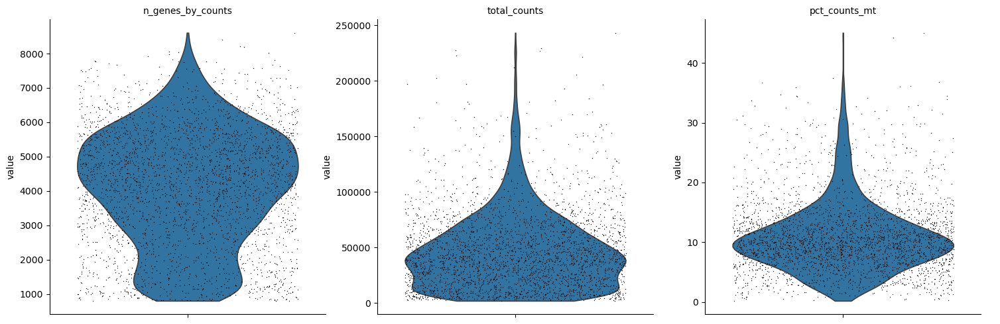

In [31]:
liver_ss3.var_names_make_unique()
#identify potentially problematic cells
sc.pl.violin(liver_ss3, 
             ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
             jitter = 0.4,
             multi_panel = True,
            )

This plot helps identify cells with unusually high mitochondrial gene expression.
High mitochondrial counts can indicate cell stress or death (apoptosis), as damaged cells release more mitochondrial RNA.Cells with high total counts and high mitochondrial gene percentage might be low-quality cells or doublets (two cells in one droplet), potentially indicating sequencing artifacts or technical errors.

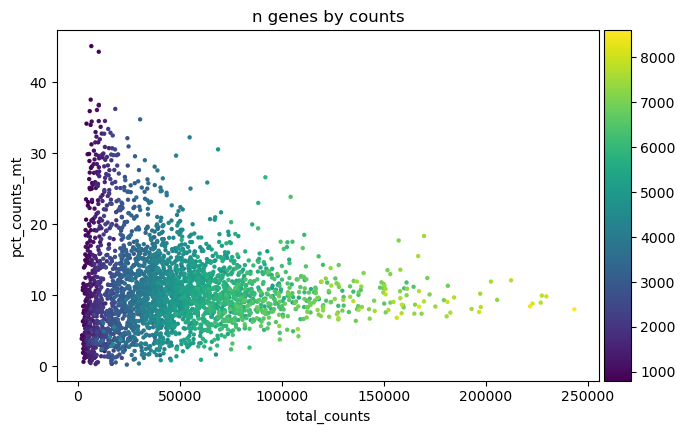

In [32]:
sc.pl.scatter(liver_ss3, x='total_counts', y='pct_counts_mt', color='n_genes_by_counts')


This plot helps identify cells with low gene diversity (fewer unique genes),
suggesting low-quality cells or technical issues. A low number of genes might 
indicate empty droplets, stressed cells, or other problems.
Cells with high total counts but a low number of unique 
genes might be technical artifacts or doublets, as they 
can contain more RNA without a corresponding increase in gene diversity.
A healthy scRNA-seq dataset often shows a positive correlation between 
total counts and the number of unique genes. Outliers, such as cells 
with high counts but few genes or vice versa, can indicate problems.

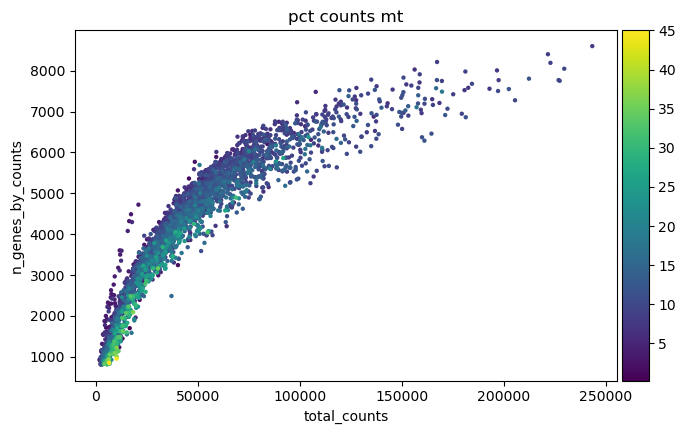

In [33]:
sc.pl.scatter(liver_ss3, x='total_counts', y='n_genes_by_counts', color='pct_counts_mt')


In [34]:
upper_limit = np.quantile(liver_ss3.obs.n_genes_by_counts, 0.98)
upper_limit

7187.859999999997

In [35]:
liver_ss3 = liver_ss3[liver_ss3.obs.n_genes_by_counts < upper_limit, :]
liver_ss3 = liver_ss3[liver_ss3.obs.pct_counts_mt < 25, :].copy()

- removed cells with more than 7187 genes
- removed > 25% mitochondrial count

In [36]:
raw_matrix=liver_ss3.X 

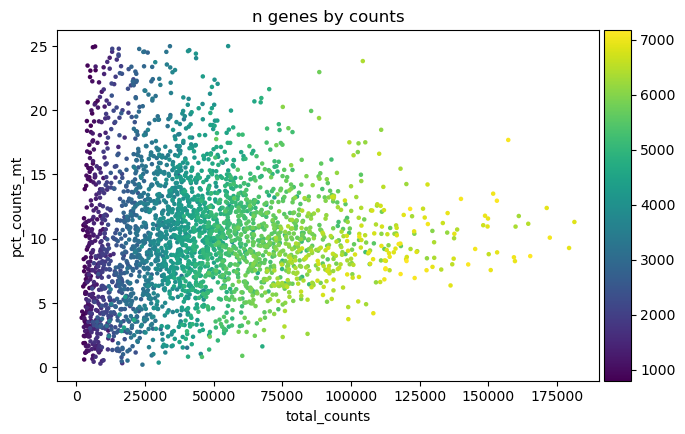

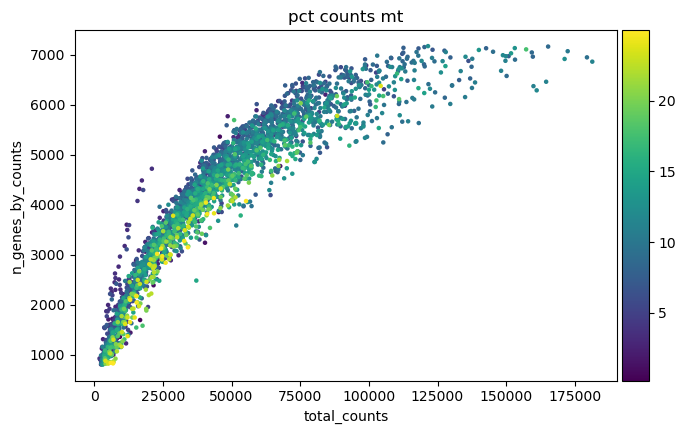

In [37]:
sc.pl.scatter(liver_ss3, x='total_counts', y='pct_counts_mt', color='n_genes_by_counts')
sc.pl.scatter(liver_ss3, x='total_counts', y='n_genes_by_counts', color='pct_counts_mt')

In [38]:
liver_ss3.X.sum(axis = 1)

matrix([[22719.],
        [39147.],
        [24865.],
        ...,
        [65542.],
        [27258.],
        [40318.]], dtype=float32)

In [39]:
liver_ss3.X


<2847x15442 sparse matrix of type '<class 'numpy.float32'>'
	with 11755971 stored elements in Compressed Sparse Row format>

In [40]:
liver_ss3.raw = liver_ss3

In [41]:
liver_ss3.layers["raw"]=raw_matrix

In [42]:
liver_ss3.layers['raw'].max()

19498.0

In [43]:
liver_ss3

AnnData object with n_obs × n_vars = 2847 × 15442
    obs: 'CellID', 'Plate', 'Index', 'Age', 'Sex', 'Replicate', 'PlateN', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'Accession', 'Chromosome', 'End', 'Gene', 'Start', 'Strand', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced', 'raw'

- Total-count normalize (library-size correct) the data matrix 
 to 10,000 reads per cell, so that counts become comparable among cells.

In [44]:
sc.pp.normalize_total(liver_ss3, target_sum = 1e4)

In [45]:
liver_ss3.X.sum(axis = 1)

matrix([[10000.   ],
        [10000.001],
        [10000.   ],
        ...,
        [10000.   ],
        [ 9999.999],
        [10000.   ]], dtype=float32)

- Logarithmize the data:

In [46]:
sc.pp.log1p(liver_ss3)

In [47]:
liver_ss3.X.sum(axis = 1)

matrix([[2155.5076],
        [2093.4417],
        [2534.3337],
        ...,
        [3184.176 ],
        [2841.8372],
        [2849.9768]], dtype=float32)

In [48]:
#finding highly variable genes
sc.pp.highly_variable_genes(liver_ss3, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)

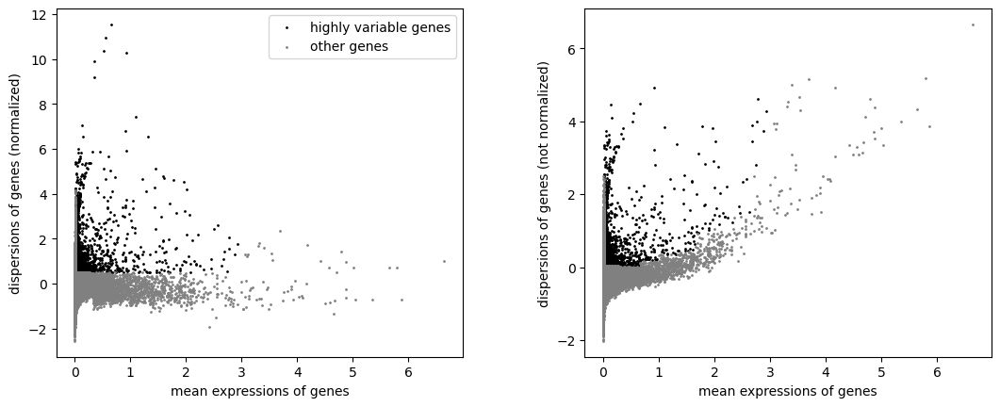

In [49]:
sc.pl.highly_variable_genes(liver_ss3)

In [50]:
liver_ss3 = liver_ss3[:, liver_ss3.var.highly_variable]
liver_ss3

View of AnnData object with n_obs × n_vars = 2847 × 1900
    obs: 'CellID', 'Plate', 'Index', 'Age', 'Sex', 'Replicate', 'PlateN', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'Accession', 'Chromosome', 'End', 'Gene', 'Start', 'Strand', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced', 'raw'

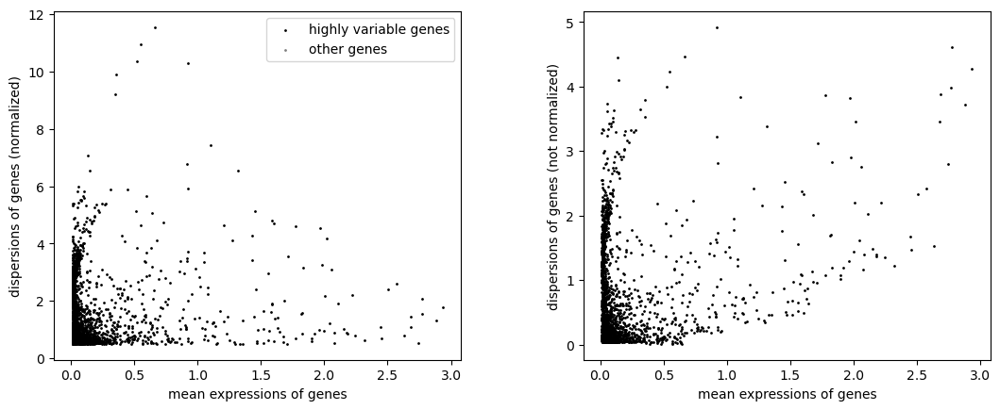

In [51]:
sc.pl.highly_variable_genes(liver_ss3)

- Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed. Scale the data to unit variance.

In [52]:
sc.pp.regress_out(liver_ss3, ['total_counts', 'pct_counts_mt'])

- Scale each gene to unit variance. Clip values exceeding standard deviation 10.

In [53]:
sc.pp.scale(liver_ss3, max_value = 10)

## Principal component analysis
Reduce the dimensionality of the data by running principal component analysis (PCA), which reveals the main axes of variation and denoises the data.

In [54]:
sc.tl.pca(liver_ss3, svd_solver = "arpack")

Inspect the contribution of single PCs to the total variance in the data. This gives information about how many PCs should be considered in order to compute the neighborhood relations of cells, e.g. used in the clustering function sc.tl.umap(). 

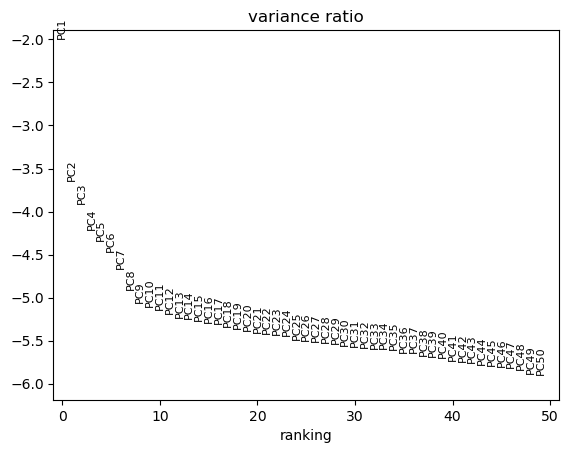

In [55]:
sc.pl.pca_variance_ratio(liver_ss3, log = True, n_pcs = 50)

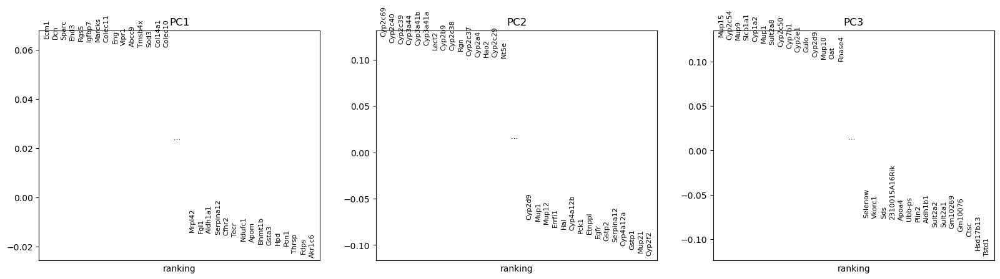

In [56]:
sc.pl.pca_loadings(liver_ss3)

## Computing the neighborhood graph
Compute the neighborhood graph of cells using the PCA representation of the data matrix. 

In [57]:
sc.pp.neighbors(liver_ss3, n_pcs = 15)

## Embedding the neighborhood graph
Embed the graph in two dimensions using UMAP. It is potentially more faithful and it better preserves trajectories. 

In [58]:
sc.tl.umap(liver_ss3)

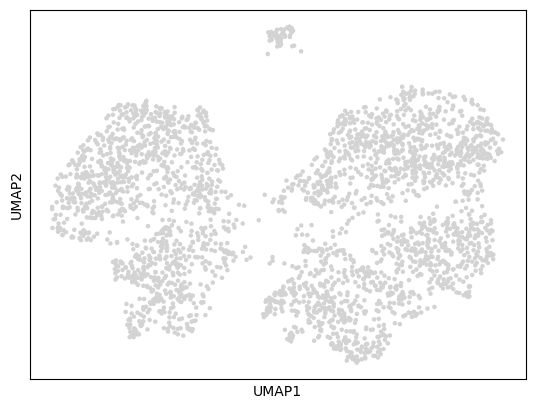

In [59]:
sc.pl.umap(liver_ss3)

## Clustering the neighborhood graph
Leiden clustering directly clusters the neighborhood graph of cells, which were already computed in the previous section.

In [60]:
sc.tl.leiden(liver_ss3, resolution = 0.5)

In [61]:
liver_ss3.obs

,CellID,Plate,Index,Age,Sex,Replicate,PlateN,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden
cellid,,,,,,,,,,,,,
AACGTACCGTTGCCTACGTC,ss3_full:AACGTACCGTTGCCTACGTCx,SP_Y_M2_p2,19J,Young,Male,2.0,p2,2514,2513,22719.0,992.0,4.366389,0
AACTGCGCCATGGACGGAGT,ss3_full:AACTGCGCCATGGACGGAGTx,SP_Y_M1_p2,10G,Young,Male,1.0,p2,3421,3419,39147.0,7553.0,19.293943,0
AACGTACCGTGAATAGACCA,ss3_full:AACGTACCGTGAATAGACCAx,SP_2_p2,14J,Old,Female,2.0,p2,2949,2948,24865.0,890.0,3.579328,3
AACGTACCGTGGAGATTGAA,ss3_full:AACGTACCGTGGAGATTGAAx,SP_2_p2,14J,Old,Female,2.0,p2,1312,1312,5596.0,264.0,4.717656,3
AACGTACCGTCCGTATCATA,ss3_full:AACGTACCGTCCGTATCATAx,SP_Y_M2_p2,19J,Young,Male,2.0,p2,6871,6839,116682.0,11986.0,10.272365,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTACTCCTAAGTGCTCG,ss3_full:TTGTTACTCCTAAGTGCTCGx,SP_Y_F1_p3,7B,Young,Female,1.0,p3,4021,4015,36888.0,4544.0,12.318369,2
TTGTTACTCCTTGTGTCTTC,ss3_full:TTGTTACTCCTTGTGTCTTCx,SP_3_p2,3B,Old,Male,1.0,p2,3275,3271,24552.0,3328.0,13.554904,6
TTGTTACTCCGTGTTCCACG,ss3_full:TTGTTACTCCGTGTTCCACGx,SP_Y_F1_p3,7B,Young,Female,1.0,p3,5820,5796,65542.0,5396.0,8.232888,2


In [62]:
liver_ss3.uns

OrderedDict([('log1p', {'base': None}),
             ('hvg', {'flavor': 'seurat'}),
             ('pca',
              {'params': {'zero_center': True,
                'use_highly_variable': True,
                'mask_var': 'highly_variable'},
               'variance': array([216.1889875 ,  41.45189767,  31.85868558,  23.54367089,
                       20.74213177,  18.19515418,  14.93609732,  11.61418935,
                       10.05726478,   9.53157249,   9.23591718,   8.8370437 ,
                        8.47153104,   8.34263767,   8.14518101,   7.91499102,
                        7.86772749,   7.60706453,   7.39522677,   7.22240705,
                        7.05646295,   7.03368823,   6.91071265,   6.81233568,
                        6.50572307,   6.43397115,   6.34959575,   6.33035563,
                        6.23412339,   6.08267931,   6.00199219,   5.9663331 ,
                        5.90999818,   5.88115661,   5.78254796,   5.58844152,
                        5.58226287,   5.4

In [63]:
sc.set_figure_params(figsize=(5, 5))

In [64]:
liver_ss3.obs

,CellID,Plate,Index,Age,Sex,Replicate,PlateN,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden
cellid,,,,,,,,,,,,,
AACGTACCGTTGCCTACGTC,ss3_full:AACGTACCGTTGCCTACGTCx,SP_Y_M2_p2,19J,Young,Male,2.0,p2,2514,2513,22719.0,992.0,4.366389,0
AACTGCGCCATGGACGGAGT,ss3_full:AACTGCGCCATGGACGGAGTx,SP_Y_M1_p2,10G,Young,Male,1.0,p2,3421,3419,39147.0,7553.0,19.293943,0
AACGTACCGTGAATAGACCA,ss3_full:AACGTACCGTGAATAGACCAx,SP_2_p2,14J,Old,Female,2.0,p2,2949,2948,24865.0,890.0,3.579328,3
AACGTACCGTGGAGATTGAA,ss3_full:AACGTACCGTGGAGATTGAAx,SP_2_p2,14J,Old,Female,2.0,p2,1312,1312,5596.0,264.0,4.717656,3
AACGTACCGTCCGTATCATA,ss3_full:AACGTACCGTCCGTATCATAx,SP_Y_M2_p2,19J,Young,Male,2.0,p2,6871,6839,116682.0,11986.0,10.272365,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTACTCCTAAGTGCTCG,ss3_full:TTGTTACTCCTAAGTGCTCGx,SP_Y_F1_p3,7B,Young,Female,1.0,p3,4021,4015,36888.0,4544.0,12.318369,2
TTGTTACTCCTTGTGTCTTC,ss3_full:TTGTTACTCCTTGTGTCTTCx,SP_3_p2,3B,Old,Male,1.0,p2,3275,3271,24552.0,3328.0,13.554904,6
TTGTTACTCCGTGTTCCACG,ss3_full:TTGTTACTCCGTGTTCCACGx,SP_Y_F1_p3,7B,Young,Female,1.0,p3,5820,5796,65542.0,5396.0,8.232888,2


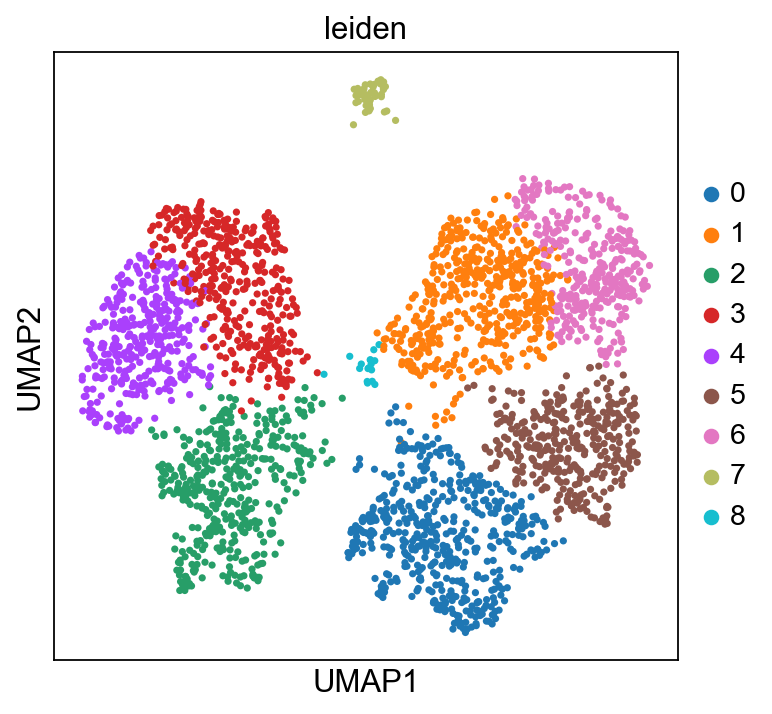

In [65]:
sc.pl.umap(liver_ss3, color = ['leiden'])

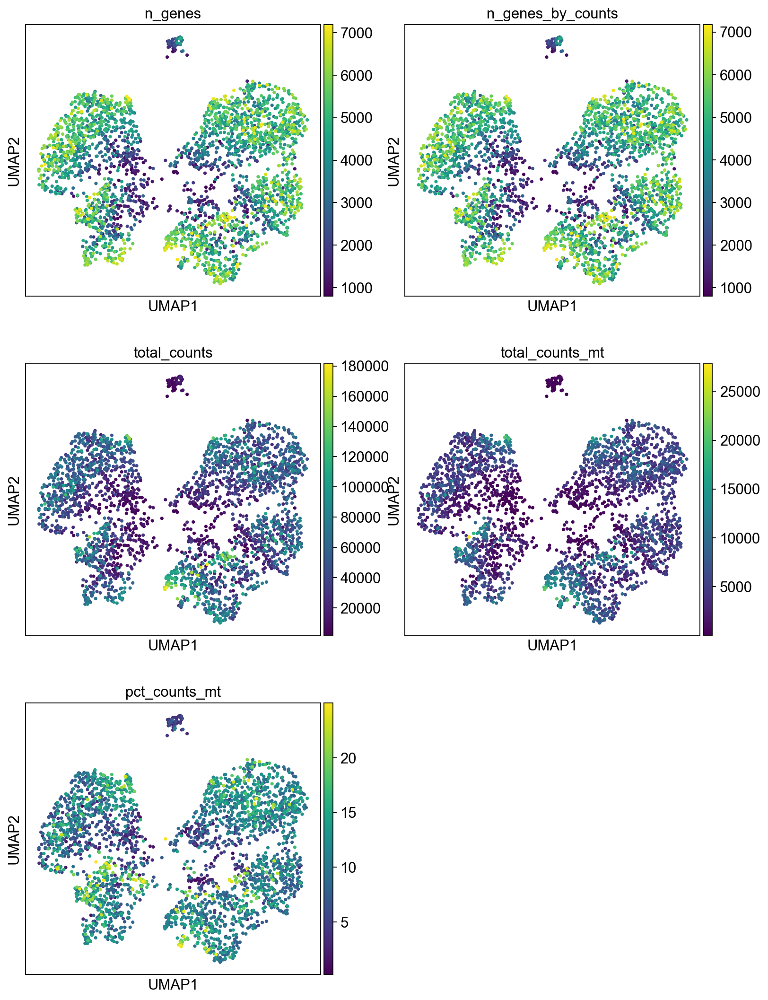

In [66]:
import seaborn as sns
colorblind_palette = sns.color_palette("tab10")
sc.pl.umap(liver_ss3, color = ['n_genes', 'n_genes_by_counts','total_counts', 'total_counts_mt', 'pct_counts_mt'], palette=colorblind_palette, ncols =2 )

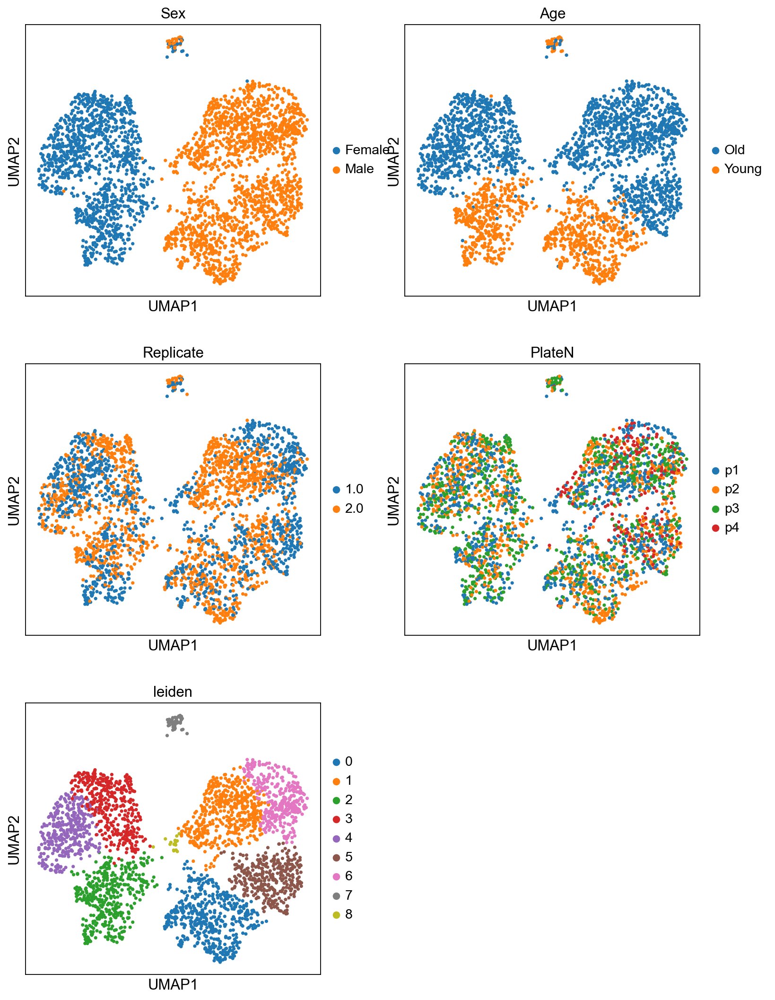

In [67]:
import seaborn as sns
colorblind_palette = sns.color_palette("tab10")
sc.pl.umap(liver_ss3, color = ['Sex', 'Age','Replicate', 'PlateN', 'leiden'], palette=colorblind_palette, ncols =2)

- comparing the most expressed genes in each clusters against any other cluster

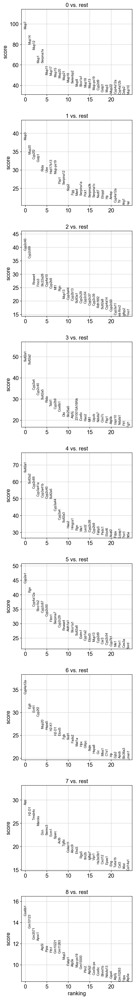

In [68]:
sc.tl.rank_genes_groups(liver_ss3, 'leiden', method='t-test', key_added = "t-test")
sc.pl.rank_genes_groups(liver_ss3, n_genes=25, sharey=False, key = "t-test", ncols=1)

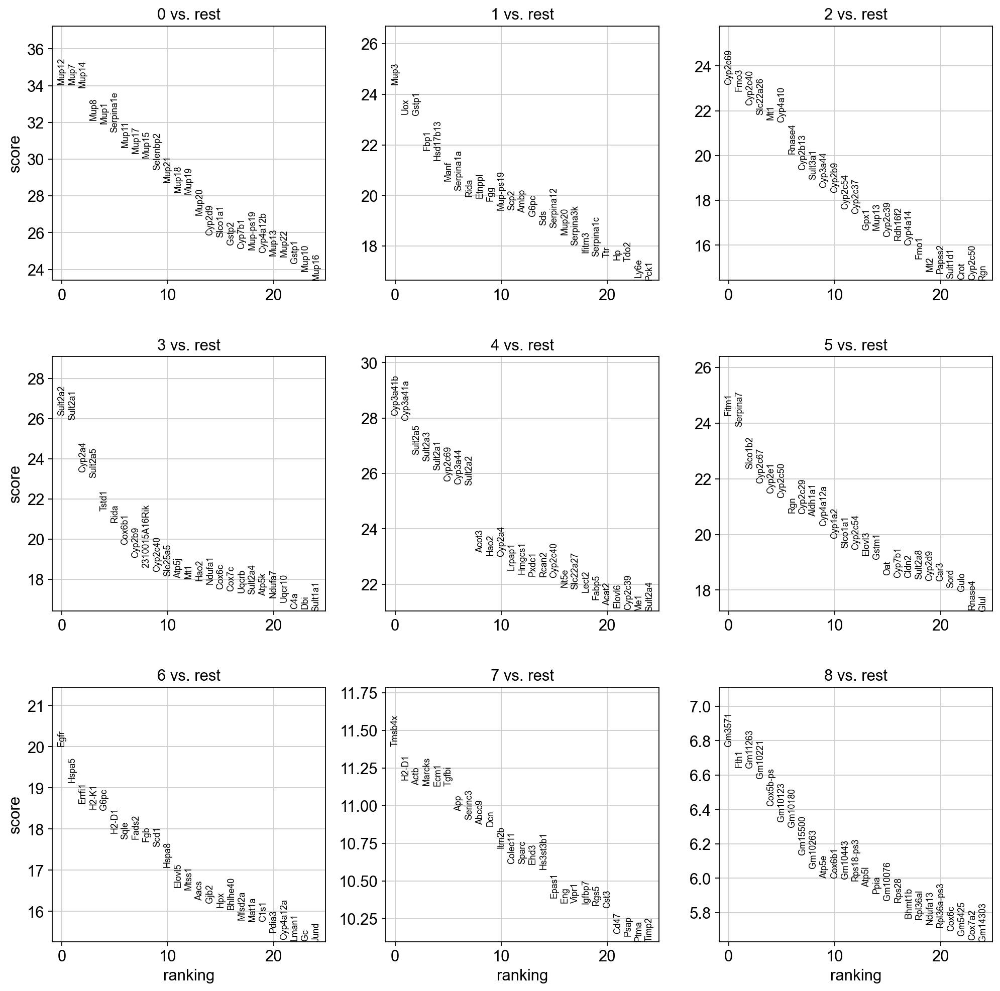

In [69]:
sc.tl.rank_genes_groups(liver_ss3, 'leiden', method='wilcoxon', key_added = "wilcoxon")
sc.pl.rank_genes_groups(liver_ss3, n_genes=25, sharey=False, key = "wilcoxon", ncols=3)

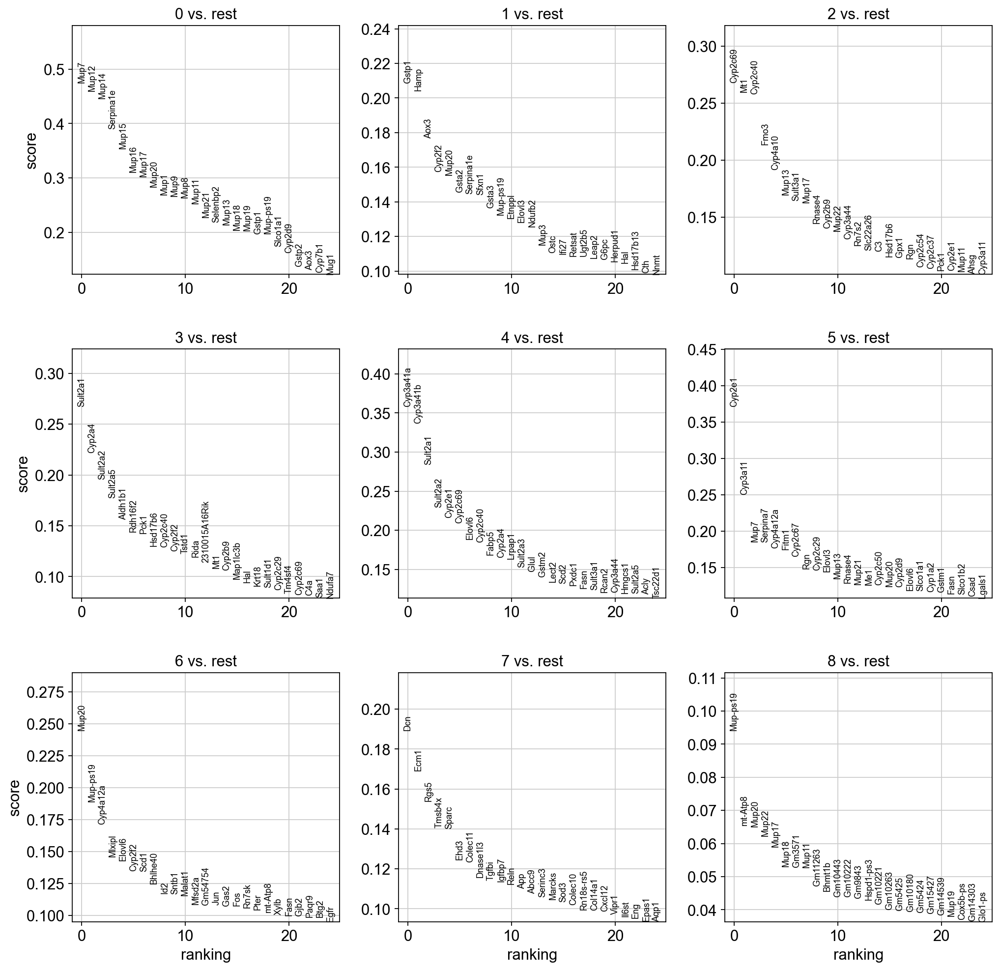

In [70]:
sc.tl.rank_genes_groups(liver_ss3, 'leiden', method='logreg')
sc.pl.rank_genes_groups(liver_ss3, n_genes=25, sharey=False, ncols=3)

In [71]:
print(liver_ss3.obs['leiden'].unique())

['0', '3', '1', '6', '5', '4', '2', '7', '8']
Categories (9, object): ['0', '1', '2', '3', ..., '5', '6', '7', '8']


In [72]:
def annotate_clusters(row):
    cluster_id = int(row['leiden'])  
    age = 'old' if cluster_id not in [0, 2] else 'young'
    sex = 'female' if cluster_id in [2, 3, 4] else 'male'
    cell_type = 'Kupffer' if cluster_id == 7 else 'hep'
    
    if cell_type == 'Kupffer':
        return f'{cell_type} cells'
    else:
        return f'{age} {sex} {cell_type}'

In [73]:
liver_ss3.obs['Annotated Cluster'] = liver_ss3.obs.apply(annotate_clusters, axis = 1)

In [74]:
liver_ss3.obs

,CellID,Plate,Index,Age,Sex,Replicate,PlateN,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,Annotated Cluster
cellid,,,,,,,,,,,,,,
AACGTACCGTTGCCTACGTC,ss3_full:AACGTACCGTTGCCTACGTCx,SP_Y_M2_p2,19J,Young,Male,2.0,p2,2514,2513,22719.0,992.0,4.366389,0,young male hep
AACTGCGCCATGGACGGAGT,ss3_full:AACTGCGCCATGGACGGAGTx,SP_Y_M1_p2,10G,Young,Male,1.0,p2,3421,3419,39147.0,7553.0,19.293943,0,young male hep
AACGTACCGTGAATAGACCA,ss3_full:AACGTACCGTGAATAGACCAx,SP_2_p2,14J,Old,Female,2.0,p2,2949,2948,24865.0,890.0,3.579328,3,old female hep
AACGTACCGTGGAGATTGAA,ss3_full:AACGTACCGTGGAGATTGAAx,SP_2_p2,14J,Old,Female,2.0,p2,1312,1312,5596.0,264.0,4.717656,3,old female hep
AACGTACCGTCCGTATCATA,ss3_full:AACGTACCGTCCGTATCATAx,SP_Y_M2_p2,19J,Young,Male,2.0,p2,6871,6839,116682.0,11986.0,10.272365,0,young male hep
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTACTCCTAAGTGCTCG,ss3_full:TTGTTACTCCTAAGTGCTCGx,SP_Y_F1_p3,7B,Young,Female,1.0,p3,4021,4015,36888.0,4544.0,12.318369,2,young female hep
TTGTTACTCCTTGTGTCTTC,ss3_full:TTGTTACTCCTTGTGTCTTCx,SP_3_p2,3B,Old,Male,1.0,p2,3275,3271,24552.0,3328.0,13.554904,6,old male hep
TTGTTACTCCGTGTTCCACG,ss3_full:TTGTTACTCCGTGTTCCACGx,SP_Y_F1_p3,7B,Young,Female,1.0,p3,5820,5796,65542.0,5396.0,8.232888,2,young female hep


In [75]:
sc.tl.rank_genes_groups(liver_ss3, 'leiden', groups=['0','1'], reference='2', method='wilcoxon', use_raw = True)
moc_res = liver_ss3.uns['rank_genes_groups']
groups = moc_res['names'].dtype.names
moc_degs = pd.DataFrame(
    {group + '_' + key: moc_res[key][group]
    for group in groups for key in ['names','scores', 'pvals','pvals_adj','logfoldchanges']})

In [76]:
liver_ss3

AnnData object with n_obs × n_vars = 2847 × 1900
    obs: 'CellID', 'Plate', 'Index', 'Age', 'Sex', 'Replicate', 'PlateN', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'Annotated Cluster'
    var: 'Accession', 'Chromosome', 'End', 'Gene', 'Start', 'Strand', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'Sex_colors', 'Age_colors', 'Replicate_colors', 'PlateN_colors', 't-test', 'wilcoxon', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced', 'raw'
    obsp: 'distances', 'connectivities'

In [77]:
moc_degs

,0_names,0_scores,0_pvals,0_pvals_adj,0_logfoldchanges,1_names,1_scores,1_pvals,1_pvals_adj,1_logfoldchanges
0,Mup20,25.659672,3.297813e-145,5.092483e-141,7.095884,Mup20,25.382334,3.952221e-142,6.103020e-138,6.298646
1,Mup12,25.410112,1.949726e-142,1.431203e-138,5.860667,Mup-ps19,25.226234,2.065224e-140,1.594559e-136,6.393817
2,Mup7,25.396162,2.780476e-142,1.431203e-138,5.387271,Gstp1,24.740681,3.905947e-135,1.206313e-131,3.185727
3,Mup21,25.232761,1.751198e-140,6.760498e-137,5.738623,Cyp4a12a,24.674576,2.005387e-134,5.161198e-131,7.025454
4,Mup-ps19,25.215969,2.676571e-140,8.266322e-137,7.115741,Serpina12,23.759087,8.851032e-125,1.952538e-121,3.175414
...,...,...,...,...,...,...,...,...,...,...
15437,Cyp2a4,-21.779894,3.599075e-105,2.416388e-102,-6.549726,Rgn,-22.467949,8.544871e-112,1.099582e-108,-2.991950
15438,Mt1,-23.070440,9.172635e-118,7.869102e-115,-5.970092,Cyp2c29,-22.958147,1.221700e-116,1.886549e-113,-3.958342
15439,Cyp2b9,-23.395693,4.727623e-121,4.562747e-118,-7.445979,Rnase4,-23.298752,4.564268e-120,7.831270e-117,-3.447383
15440,Cyp2c69,-24.910221,5.765670e-137,9.892609e-134,-6.327273,Cyp2c69,-24.788200,1.201752e-135,4.639364e-132,-6.914389


## Annotation 

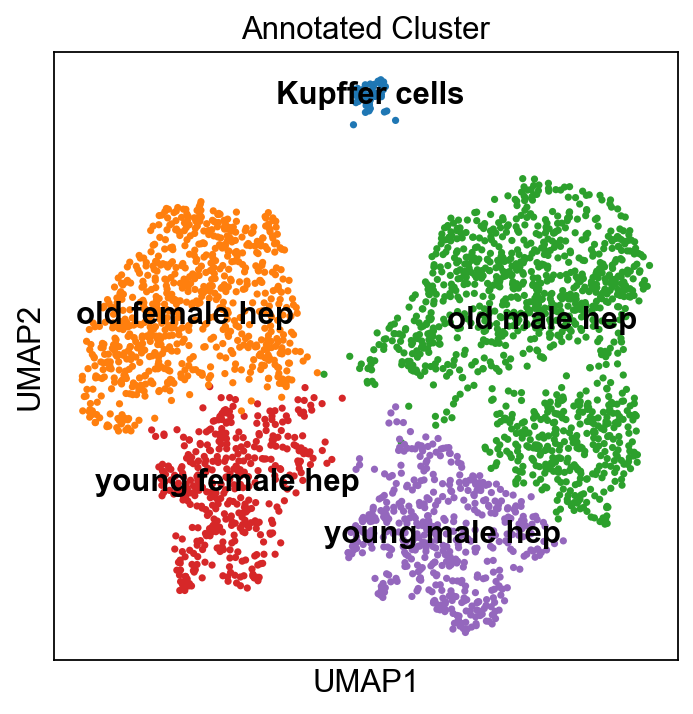

In [78]:
sc.pl.umap(liver_ss3, color = ['Annotated Cluster'],  legend_loc='on data',palette=colorblind_palette)


In [79]:
def annotate(row):
    cluster_id = int(row['leiden'])  
    
    age = 'O' if cluster_id not in [0, 2] else 'Y'
    
    sex = 'F' if cluster_id in [2, 3, 4] else 'M'
    
    if cluster_id == 7:
        cell_type = 'Kupffer cells'
    elif cluster_id in [4, 5]:
        cell_type = 'pericentral hep'
    elif cluster_id in [1, 3, 6, 8]:
        cell_type = 'periportal hep'
    else:
        cell_type = 'hep'
    
    if cell_type == 'Kupffer':
        return f'{cell_type} cells'
    else:
        return f'{age}{sex} {cell_type}'

In [80]:
liver_ss3.obs['CV & PV'] = liver_ss3.obs.apply(annotate, axis = 1)

In [81]:
def combine_annotations(row):
    return f"{row['leiden']}_{row['CV & PV']}"

In [82]:
liver_ss3.obs['Hep. subtypes annotation'] = liver_ss3.obs.apply(combine_annotations, axis=1)

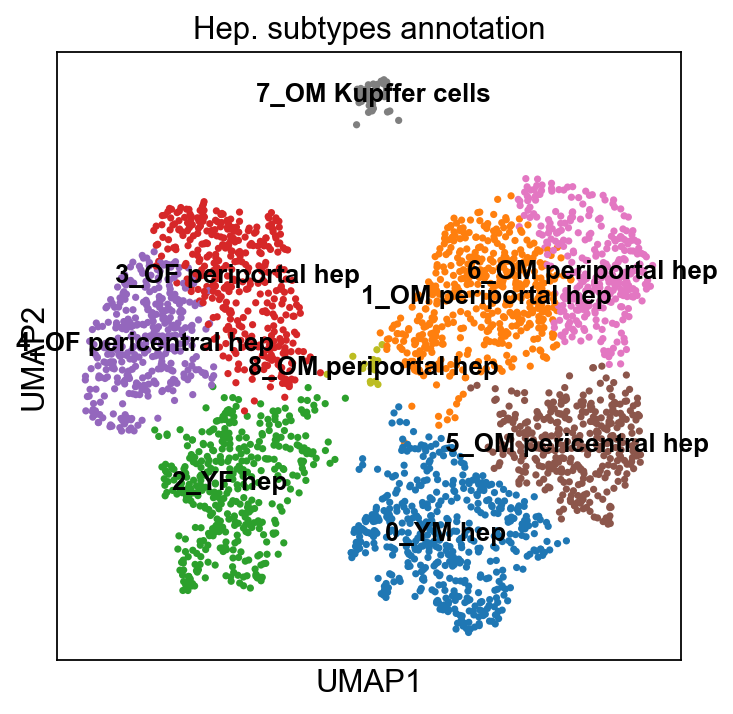

In [83]:
sc.pl.umap(liver_ss3, color='Hep. subtypes annotation', palette=colorblind_palette, legend_loc='on data', legend_fontsize='small')

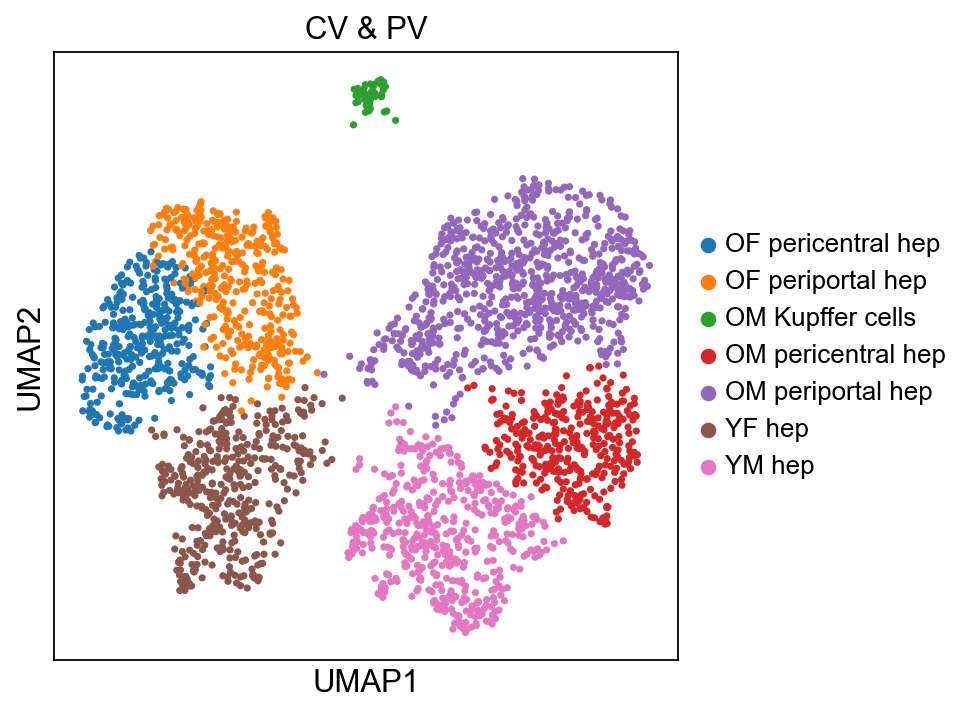

In [84]:
sc.pl.umap(liver_ss3, color='CV & PV', palette=colorblind_palette, legend_fontsize='small')

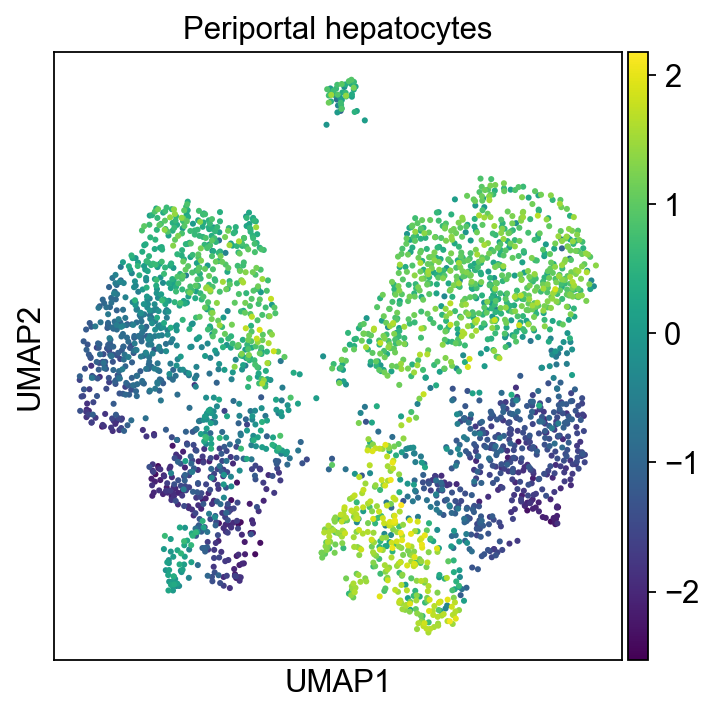

In [291]:
liver_ss3.obs['periportal_score'] = liver_ss3[:, periportal_genes].X.mean(axis=1)
liver_ss3.obs['pericentral_score'] = liver_ss3[:, pericentral_genes].X.mean(axis=1)

liver_ss3.obs['transition_score'] = liver_ss3.obs['periportal_score'] - liver_ss3.obs['pericentral_score']

sc.pl.umap(liver_ss3, color='transition_score', palette=colorblind_palette , title='Periportal hepatocytes', size=30, frameon = True, legend_loc = 'upper right')


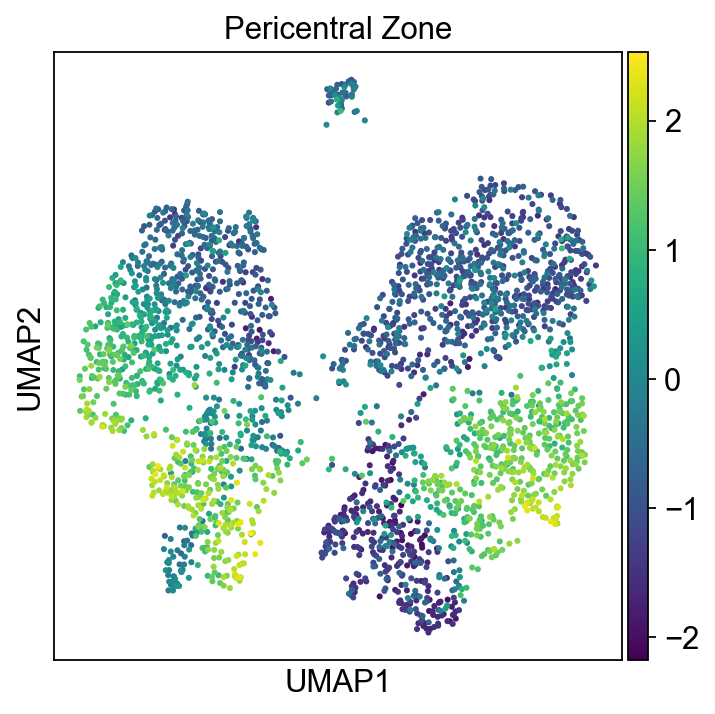

In [88]:
liver_ss3.obs['periportal_score'] = liver_ss3[:, periportal_genes].X.mean(axis=1)
liver_ss3.obs['pericentral_score'] = liver_ss3[:, pericentral_genes].X.mean(axis=1)

liver_ss3.obs['score'] = liver_ss3.obs['pericentral_score'] - liver_ss3.obs['periportal_score'] 

sc.pl.umap(liver_ss3, color='score', palette=colorblind_palette , title='Pericentral Zone', size=30, frameon = True, legend_loc = 'upper right')


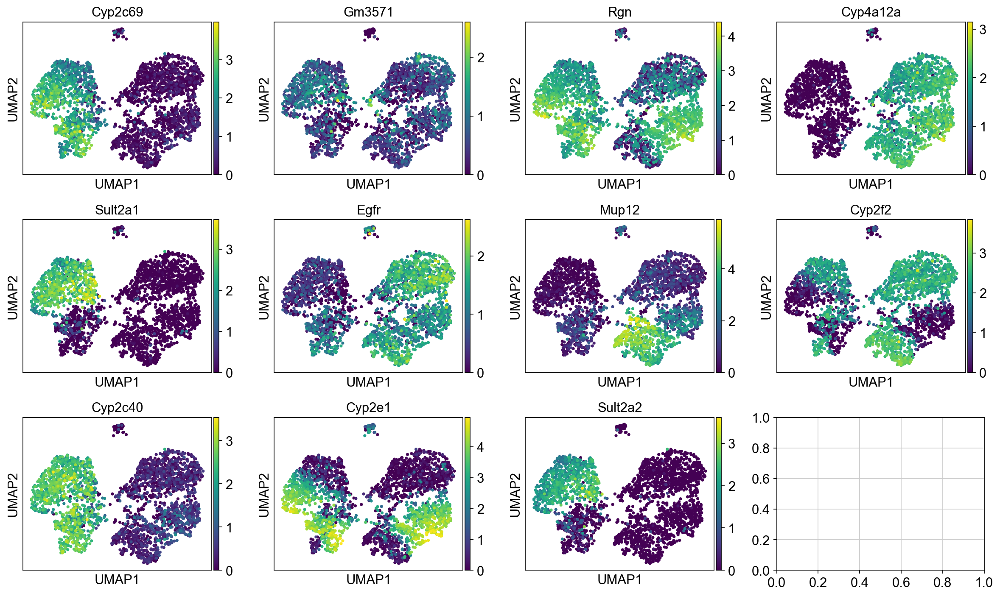

In [89]:
genes_to_plot = ['Cyp2c69', 'Gm3571', 'Rgn', 'Cyp4a12a', 'Sult2a1', 'Egfr', 'Mup12', 'Cyp2f2', 'Cyp2c40', 'Cyp2e1', 'Sult2a2']
fig, axes = plt.subplots(3, 4, figsize=(15, 9))

for ax, gene in zip(axes.flatten(), genes_to_plot):
    if gene in liver_ss3.var.index:
        sc.pl.umap(liver_ss3, color=gene, ax=ax, show=False)
        ax.set_title(gene)

plt.tight_layout()
plt.show()

### Comparing the gene expression of old male pericentral hepatocytes(cluster 5) against old male periportal hepatocytes (cluster 1,6 and 8)
The questions I am trying to answer are:
 - How does old age affect male periportal and pericentral hepatocytes?
 - What functions are affected? 

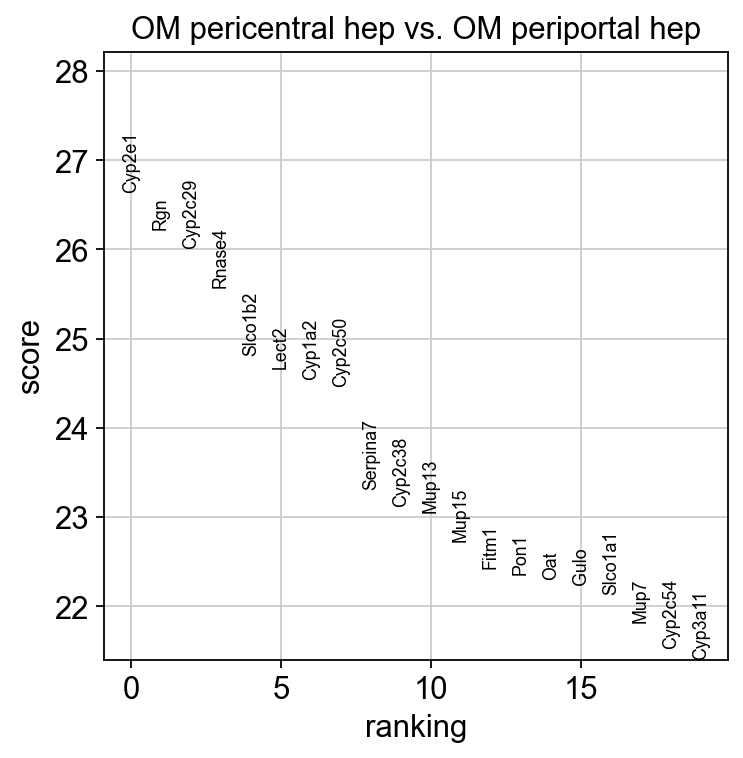

In [199]:
sc.tl.rank_genes_groups(liver_ss3, 'CV & PV', groups=['OM pericentral hep'], reference='OM periportal hep', method='wilcoxon', use_raw=True)
sc.pl.rank_genes_groups(liver_ss3, groups=['OM pericentral hep'], n_genes=20)

In [200]:
sc.tl.rank_genes_groups(liver_ss3, 'CV & PV', groups=['OM periportal hep'], reference='OM pericentral hep', method='wilcoxon', use_raw=True)
print(liver_ss3.uns['rank_genes_groups'].keys())
print(liver_ss3.uns['rank_genes_groups']['names'].dtype.names)


dict_keys(['params', 'names', 'scores', 'pvals', 'pvals_adj', 'logfoldchanges'])
('OM periportal hep',)


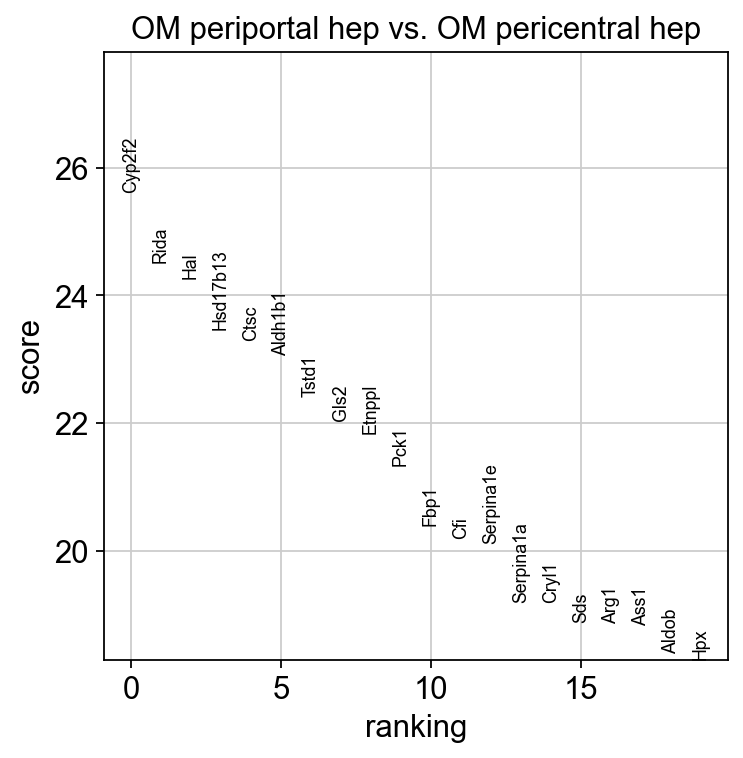

In [201]:
sc.pl.rank_genes_groups(liver_ss3, groups=['OM periportal hep'], n_genes=20)

In [202]:
mop_res = liver_ss3.uns['rank_genes_groups']
groups = mop_res['names'].dtype.names
mop_degs = pd.DataFrame(
    {group + '_' + key: mop_res[key][group]
    for group in groups for key in ['names','scores', 'pvals','pvals_adj','logfoldchanges']})

In [203]:
mop_degs

,OM periportal hep_names,OM periportal hep_scores,OM periportal hep_pvals,OM periportal hep_pvals_adj,OM periportal hep_logfoldchanges
0,Cyp2f2,25.621880,8.703710e-145,3.360067e-141,5.168696
1,Rida,24.525852,7.829699e-133,1.343402e-129,1.367577
2,Hal,24.261194,5.037539e-130,7.071789e-127,3.360103
3,Hsd17b13,23.473391,7.628606e-122,9.816745e-119,2.504894
4,Ctsc,23.297787,4.668330e-120,5.149168e-117,5.553892
...,...,...,...,...,...
15437,Slco1b2,-24.809401,7.097643e-136,1.826697e-132,-2.026497
15438,Rnase4,-25.577930,2.685766e-144,8.294719e-141,-3.418710
15439,Cyp2c29,-26.012987,3.531046e-149,1.817547e-145,-4.794189
15440,Rgn,-26.228106,1.270656e-151,9.810732e-148,-3.467686


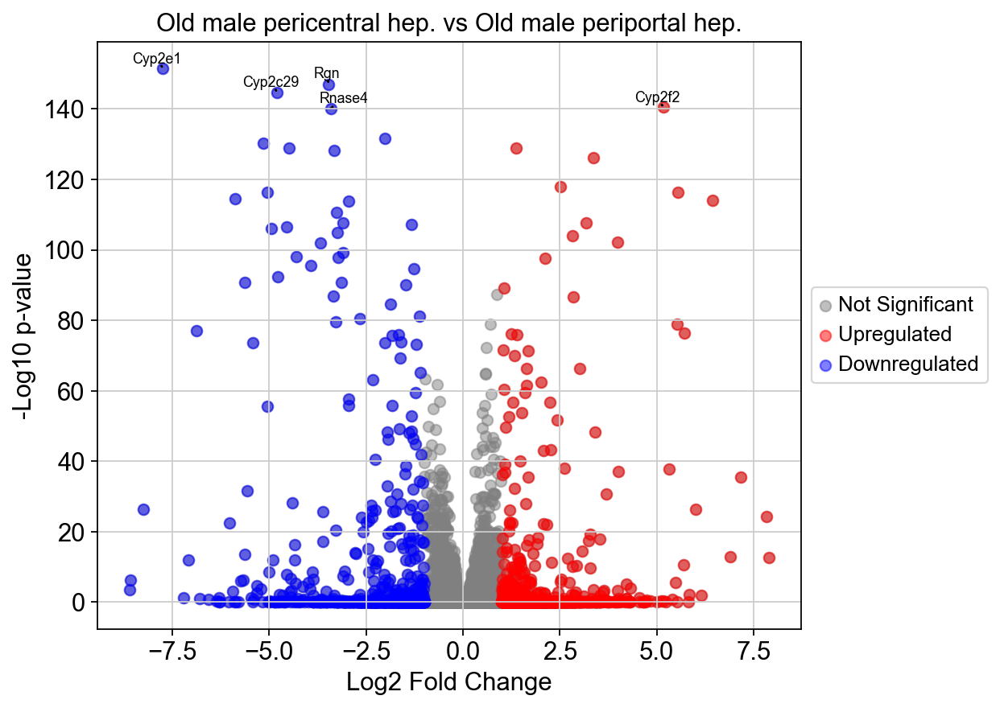

In [204]:
#padj_threshold = 0.05
logfc_threshold = 1

# Filter the data to exclude log2 fold changes lower than -15 and higher than 15
filtered_mop_degs = mop_degs[(mop_degs['OM periportal hep_logfoldchanges'] >= -15) & 
                             (mop_degs['OM periportal hep_logfoldchanges'] <= 15)]

# Identify significant genes within the filtered data
significant_genes = filtered_mop_degs[(filtered_mop_degs['OM periportal hep_logfoldchanges'].abs() > logfc_threshold)]
upregulated_genes = significant_genes[significant_genes['OM periportal hep_logfoldchanges'] > logfc_threshold]
downregulated_genes = significant_genes[significant_genes['OM periportal hep_logfoldchanges'] < -logfc_threshold]
top_genes = significant_genes.sort_values(by='OM periportal hep_pvals_adj').head(5)

plt.figure(figsize=(7, 6))
plt.scatter(filtered_mop_degs['OM periportal hep_logfoldchanges'], 
            -np.log10(filtered_mop_degs['OM periportal hep_pvals_adj']),
            c='grey', alpha=0.5, label='Not Significant')
plt.scatter(upregulated_genes['OM periportal hep_logfoldchanges'], 
            -np.log10(upregulated_genes['OM periportal hep_pvals_adj']),
            c='red', alpha=0.5, label='Upregulated')
plt.scatter(downregulated_genes['OM periportal hep_logfoldchanges'], 
            -np.log10(downregulated_genes['OM periportal hep_pvals_adj']),
            c='blue', alpha=0.5, label='Downregulated')

texts = []
for i, row in top_genes.iterrows():
    texts.append(plt.text(row['OM periportal hep_logfoldchanges'], 
                          -np.log10(row['OM periportal hep_pvals_adj']) + 0.1,
                          row['OM periportal hep_names'], fontsize=8, ha='center'))

adjust_text(texts, arrowprops=dict(arrowstyle='->'))
plt.xlabel('Log2 Fold Change')
plt.ylabel('-Log10 p-value')
plt.title('Old male pericentral hep. vs Old male periportal hep.')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize='small')
plt.show()


In [205]:
print(len(upregulated_genes))
print(len(downregulated_genes))

1244
1031


# Comparison between old male periportal hepatocytes vs old female periportal hepatocytes

In [224]:
sc.tl.rank_genes_groups(liver_ss3, 'CV & PV', groups=['OM periportal hep'], reference='OF periportal hep', method='wilcoxon', use_raw=True)

In [225]:
mop_res = liver_ss3.uns['rank_genes_groups']
groups = mop_res['names'].dtype.names
mop_degs = pd.DataFrame(
    {group + '_' + key: mop_res[key][group]
    for group in groups for key in ['names','scores', 'pvals','pvals_adj','logfoldchanges']})

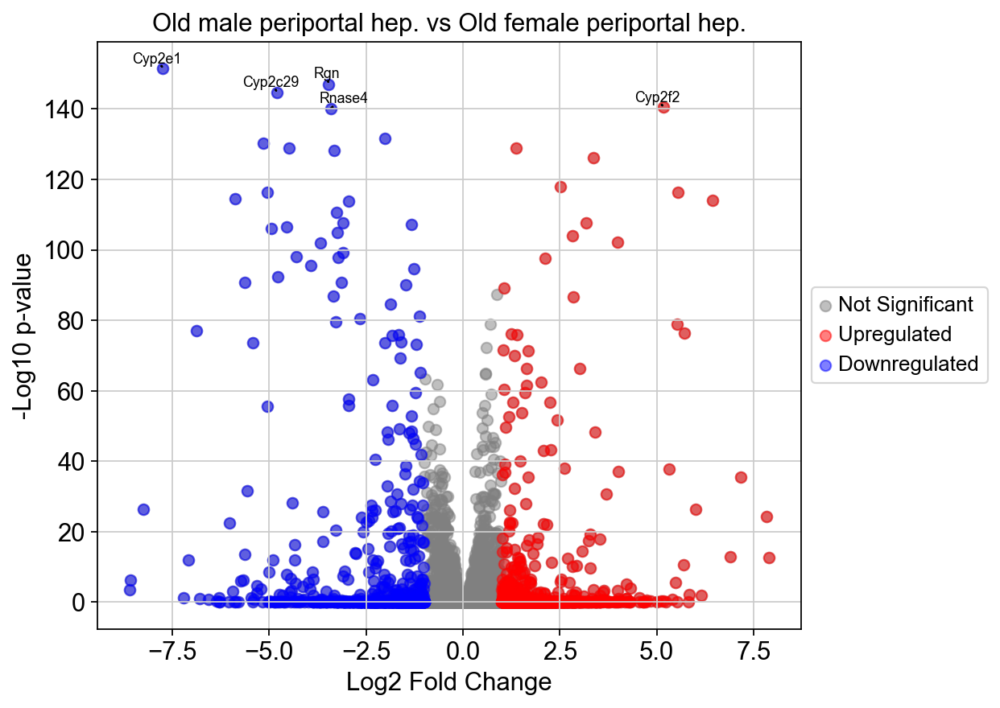

In [292]:
#padj_threshold = 0.05
logfc_threshold = 1

# Filter the data to exclude log2 fold changes lower than -15 and higher than 15
filtered_mop_degs = mop_degs[(mop_degs['OM periportal hep_logfoldchanges'] >= -15) & 
                             (mop_degs['OM periportal hep_logfoldchanges'] <= 15)]

# Identify significant genes within the filtered data
significant_genes = filtered_mop_degs[(filtered_mop_degs['OM periportal hep_logfoldchanges'].abs() > logfc_threshold)]
upregulated_genes = significant_genes[significant_genes['OM periportal hep_logfoldchanges'] > logfc_threshold]
downregulated_genes = significant_genes[significant_genes['OM periportal hep_logfoldchanges'] < -logfc_threshold]
top_genes = significant_genes.sort_values(by='OM periportal hep_pvals_adj').head(5)

plt.figure(figsize=(7, 6))
plt.scatter(filtered_mop_degs['OM periportal hep_logfoldchanges'], 
            -np.log10(filtered_mop_degs['OM periportal hep_pvals_adj']),
            c='grey', alpha=0.5, label='Not Significant')
plt.scatter(upregulated_genes['OM periportal hep_logfoldchanges'], 
            -np.log10(upregulated_genes['OM periportal hep_pvals_adj']),
            c='red', alpha=0.5, label='Upregulated')
plt.scatter(downregulated_genes['OM periportal hep_logfoldchanges'], 
            -np.log10(downregulated_genes['OM periportal hep_pvals_adj']),
            c='blue', alpha=0.5, label='Downregulated')

texts = []
for i, row in top_genes.iterrows():
    texts.append(plt.text(row['OM periportal hep_logfoldchanges'], 
                          -np.log10(row['OM periportal hep_pvals_adj']) + 0.1,
                          row['OM periportal hep_names'], fontsize=8, ha='center'))

adjust_text(texts, arrowprops=dict(arrowstyle='->'))
plt.xlabel('Log2 Fold Change')
plt.ylabel('-Log10 p-value')
plt.title('Old male periportal hep. vs Old female periportal hep.')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize='small')
plt.show()


In [293]:
upregulated_genes = significant_genes[significant_genes['OM periportal hep_logfoldchanges'] > logfc_threshold]['OM periportal hep_names'].tolist()
downregulated_genes = significant_genes[significant_genes['OM periportal hep_logfoldchanges'] < -logfc_threshold]['OM periportal hep_names'].tolist()

In [294]:
up_enrichment = gp.enrichr(gene_list = upregulated_genes, gene_sets = 'KEGG_2021_Human', organism = 'Mouse')

In [233]:
up_enrichment_df = pd.DataFrame(up_enrichment.results)
up_enrichment_20 = up_enrichment_df.head(20)
up_enrichment_20

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,KEGG_2021_Human,Protein digestion and absorption,18/103,0.015237,0.999995,0,0,1.882411,7.876003,KCNK5;COL16A1;COL27A1;COL13A1;COL25A1;SLC8A1;C...
1,KEGG_2021_Human,MAPK signaling pathway,40/294,0.034011,0.999995,0,0,1.401970,4.740181,FLT1;CSF1;FLT4;SRF;IL1RAP;ELK1;EFNA4;EGFR;CACN...
2,KEGG_2021_Human,Osteoclast differentiation,19/127,0.054817,0.999995,0,0,1.562600,4.537403,JUN;SPI1;JUND;CSF1;IL1R1;PIK3R3;CYBA;FOS;GAB2;...
3,KEGG_2021_Human,Fluid shear stress and atherosclerosis,20/139,0.069360,0.999995,0,0,1.492621,3.982974,MEF2A;JUN;IL1R1;DUSP1;GSTP1;PIK3R3;CYBA;FOS;AC...
4,KEGG_2021_Human,AGE-RAGE signaling pathway in diabetic complic...,15/100,0.079660,0.999995,0,0,1.566341,3.962824,JUN;SERPINE1;PIK3R3;MAPK12;COL1A1;THBD;COL3A1;...
5,KEGG_2021_Human,Amoebiasis,15/102,0.090985,0.999995,0,0,1.530162,3.667893,IL1R1;LAMA1;LAMB2;LAMA3;PIK3R3;CXCL1;C8B;C8A;C...
6,KEGG_2021_Human,Rap1 signaling pathway,27/210,0.118754,0.999995,0,0,1.310190,2.791625,FLT1;CSF1;FLT4;LPAR1;ADCY4;PIK3R3;EFNA4;EGFR;R...
7,KEGG_2021_Human,Complement and coagulation cascades,12/85,0.150486,0.999995,0,0,1.457866,2.761028,THBD;PROCR;C1QA;C6;SERPINE1;F2R;C3AR1;C8B;TFPI...
8,KEGG_2021_Human,Circadian entrainment,13/97,0.182666,0.999995,0,0,1.372371,2.333165,GUCY1A1;ADCY4;FOS;CACNA1G;PER2;PER1;MTNR1A;GNG...
9,KEGG_2021_Human,"Parathyroid hormone synthesis, secretion and a...",14/106,0.185474,0.999995,0,0,1.349487,2.273667,MEF2A;JUND;ADCY4;PTH1R;FOS;EGFR;NR4A2;MAFB;PLC...


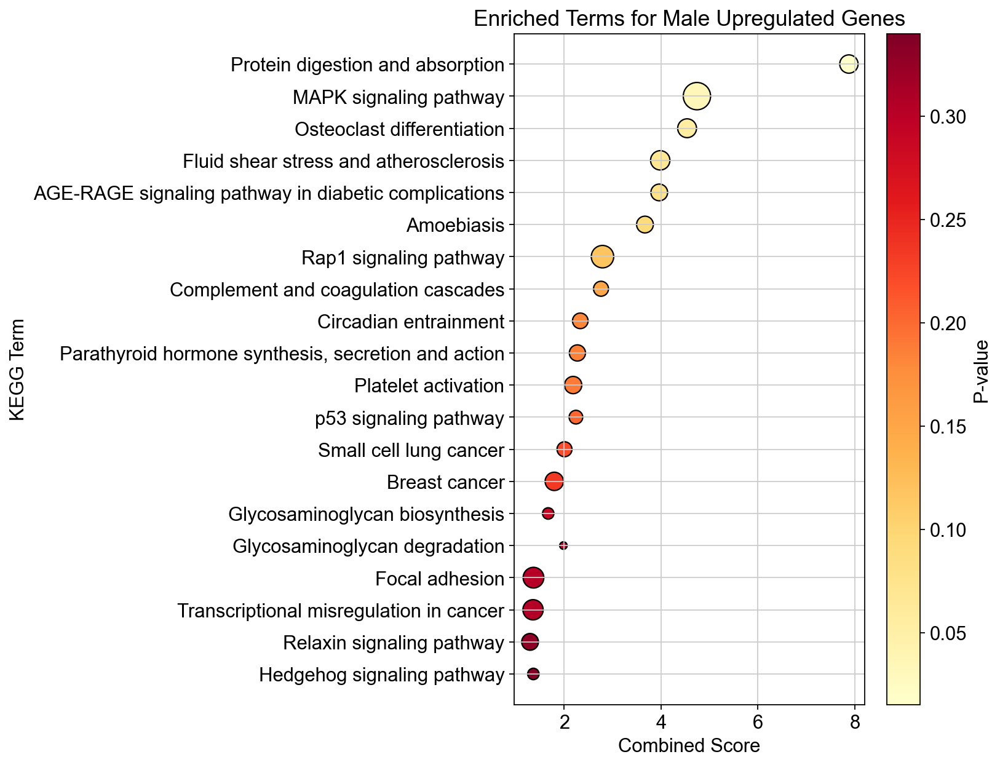

In [234]:
up_enrichment_20['Count'] = [int(x.split('/')[0]) for x in up_enrichment_20['Overlap']]
up_enrichment_20['dot_size'] = up_enrichment_20['Count'] * 10
plt.figure(figsize=(10, 8))
scatter = plt.scatter(up_enrichment_20['Combined Score'], up_enrichment_20['Term'], 
                      s=up_enrichment_20['dot_size'], c=up_enrichment_20['P-value'], cmap='YlOrRd', edgecolor='black')
plt.xlabel('Combined Score', fontsize=14)
plt.ylabel('KEGG Term', fontsize=14)
plt.title('upregulated genes between male and female for periportal hep', fontsize=16)
plt.colorbar(scatter, label='P-value')
handles, labels = scatter.legend_elements(prop="sizes", alpha=0.6)
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

In [241]:
down_enrichment = gp.enrichr(gene_list = downregulated_genes, gene_sets = 'KEGG_2021_Human', organism = 'Mouse')

In [244]:
down_enrichment_df = pd.DataFrame(down_enrichment.results)
down_enrichment_20 = down_enrichment_df.head(20)
down_enrichment_20

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,KEGG_2021_Human,Vitamin B6 metabolism,3/6,0.025344,0.999996,0,0,7.429174,27.303716,PSAT1;PNPO;PDXP
1,KEGG_2021_Human,ECM-receptor interaction,17/88,0.028606,0.999996,0,0,1.782473,6.335173,LAMA4;GP1BA;LAMC1;HMMR;NPNT;THBS2;HSPG2;COL1A1...
2,KEGG_2021_Human,Hedgehog signaling pathway,11/56,0.062633,0.999996,0,0,1.817823,5.036207,EVC2;HHAT;GRK3;EVC;CCND1;KIF3A;IQCE;GAS1;EFCAB...
3,KEGG_2021_Human,Focal adhesion,31/201,0.076712,0.999996,0,0,1.357923,3.486737,SHC4;SRC;LAMA4;LAMC1;THBS2;ELK1;MYLK3;RELN;CCN...
4,KEGG_2021_Human,Protein digestion and absorption,17/103,0.099787,0.999996,0,0,1.470319,3.388667,SLC6A19;CELA2A;COL16A1;COL14A1;COL12A1;SLC3A1;...
5,KEGG_2021_Human,D-Glutamine and D-glutamate metabolism,2/5,0.110391,0.999996,0,0,4.950695,10.909978,GLS2;GLS
6,KEGG_2021_Human,Proteoglycans in cancer,29/205,0.182026,0.999996,0,0,1.225541,2.087839,CAMK2B;CD63;SRC;ITPR3;ELK1;CCND1;ERBB3;ERBB2;P...
7,KEGG_2021_Human,Bladder cancer,7/41,0.208039,0.999996,0,0,1.529424,2.401244,RPS6KA5;CCND1;SRC;CDH1;ERBB2;RAF1;HBEGF
8,KEGG_2021_Human,Axon guidance,25/182,0.248022,0.999996,0,0,1.183629,1.650260,CAMK2B;SEMA5B;SRC;SEMA3B;SEMA3F;EFNA4;RND1;EFN...
9,KEGG_2021_Human,Histidine metabolism,4/22,0.260810,0.999996,0,0,1.650218,2.217830,HAL;ALDH1B1;ALDH3B1;CARNS1


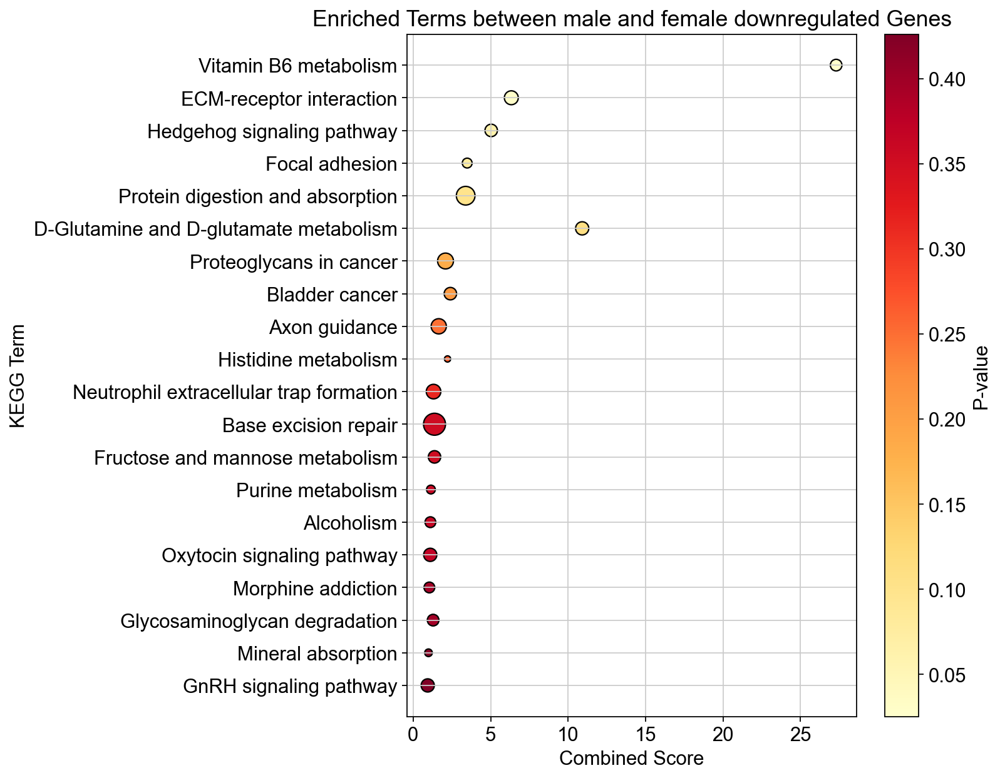

In [245]:
down_enrichment_20['Count'] = [int(x.split('/')[0]) for x in up_enrichment_20['Overlap']]
down_enrichment_20['dot_size'] = down_enrichment_20['Count'] * 10
plt.figure(figsize=(10, 8))
scatter = plt.scatter(down_enrichment_20['Combined Score'], down_enrichment_20['Term'], 
                      s=up_enrichment_20['dot_size'], c=down_enrichment_20['P-value'], cmap='YlOrRd', edgecolor='black')
plt.xlabel('Combined Score', fontsize=14)
plt.ylabel('KEGG Term', fontsize=14)
plt.title('downregulated genes between male and female for periportal hep', fontsize=16)
plt.colorbar(scatter, label='P-value')
handles, labels = scatter.legend_elements(prop="sizes", alpha=0.6)
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

# Comparison between old male pericentral hepatocytes vs old female pericentral hapatocytes

In [252]:
sc.tl.rank_genes_groups(liver_ss3, 'CV & PV', groups=['OM pericentral hep'], reference='OF pericentral hep', method='wilcoxon', use_raw=True)

In [253]:
mop_res = liver_ss3.uns['rank_genes_groups']
groups = mop_res['names'].dtype.names
mop_degs = pd.DataFrame(
    {group + '_' + key: mop_res[key][group]
    for group in groups for key in ['names','scores', 'pvals','pvals_adj','logfoldchanges']})

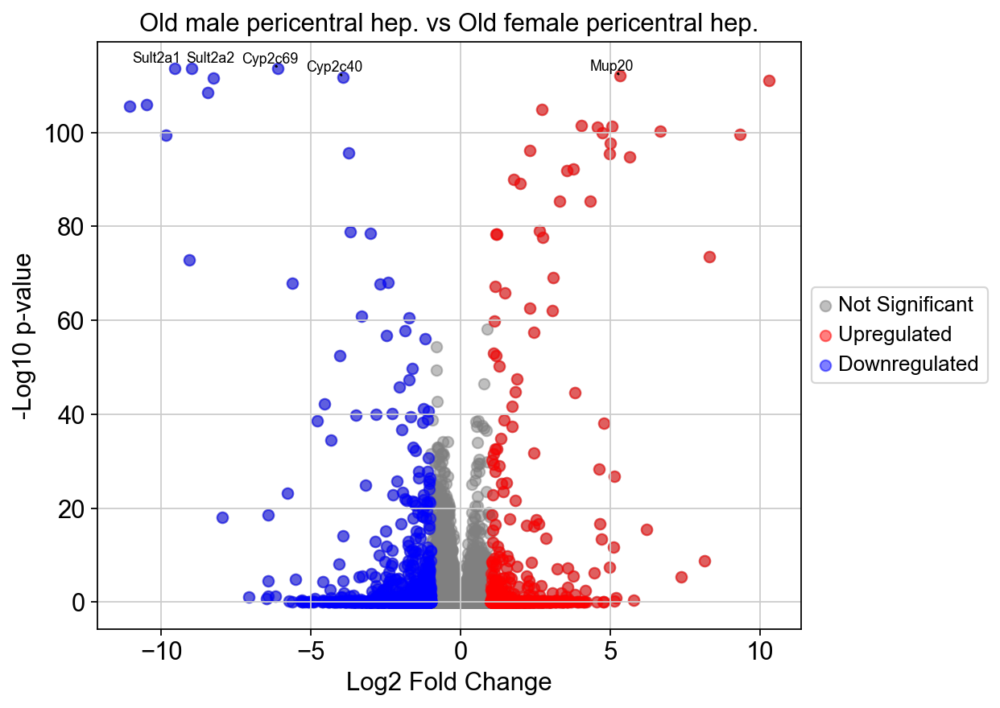

In [254]:
#padj_threshold = 0.05
logfc_threshold = 1

# Filter the data to exclude log2 fold changes lower than -15 and higher than 15
filtered_mop_degs = mop_degs[(mop_degs['OM pericentral hep_logfoldchanges'] >= -15) & 
                             (mop_degs['OM pericentral hep_logfoldchanges'] <= 15)]

# Identify significant genes within the filtered data
significant_genes = filtered_mop_degs[(filtered_mop_degs['OM pericentral hep_logfoldchanges'].abs() > logfc_threshold)]
upregulated_genes = significant_genes[significant_genes['OM pericentral hep_logfoldchanges'] > logfc_threshold]
downregulated_genes = significant_genes[significant_genes['OM pericentral hep_logfoldchanges'] < -logfc_threshold]
top_genes = significant_genes.sort_values(by='OM pericentral hep_pvals_adj').head(5)

plt.figure(figsize=(7, 6))
plt.scatter(filtered_mop_degs['OM pericentral hep_logfoldchanges'], 
            -np.log10(filtered_mop_degs['OM pericentral hep_pvals_adj']),
            c='grey', alpha=0.5, label='Not Significant')
plt.scatter(upregulated_genes['OM pericentral hep_logfoldchanges'], 
            -np.log10(upregulated_genes['OM pericentral hep_pvals_adj']),
            c='red', alpha=0.5, label='Upregulated')
plt.scatter(downregulated_genes['OM pericentral hep_logfoldchanges'], 
            -np.log10(downregulated_genes['OM pericentral hep_pvals_adj']),
            c='blue', alpha=0.5, label='Downregulated')

texts = []
for i, row in top_genes.iterrows():
    texts.append(plt.text(row['OM pericentral hep_logfoldchanges'], 
                          -np.log10(row['OM pericentral hep_pvals_adj']) + 0.1,
                          row['OM pericentral hep_names'], fontsize=8, ha='center'))

adjust_text(texts, arrowprops=dict(arrowstyle='->'))
plt.xlabel('Log2 Fold Change')
plt.ylabel('-Log10 p-value')
plt.title('Old male pericentral hep. vs Old female pericentral hep.')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize='small')
plt.show()

In [255]:
significant_genes = mop_degs[mop_degs['OM pericentral hep_logfoldchanges'].abs() > logfc_threshold]

upregulated_genes = significant_genes[significant_genes['OM pericentral hep_logfoldchanges'] > logfc_threshold]
downregulated_genes = significant_genes[significant_genes['OM pericentral hep_logfoldchanges'] < -logfc_threshold]
upregulated_genes = significant_genes[significant_genes['OM pericentral hep_logfoldchanges'] > logfc_threshold]['OM pericentral hep_names'].tolist()
downregulated_genes = significant_genes[significant_genes['OM pericentral hep_logfoldchanges'] < -logfc_threshold]['OM pericentral hep_names'].tolist()

In [256]:
up_enrichment = gp.enrichr(gene_list = upregulated_genes, gene_sets = 'KEGG_2021_Human', organism = 'Mouse')

In [257]:
up_enrichment_df = pd.DataFrame(up_enrichment.results)
up_enrichment_20 = up_enrichment_df.head(20)
up_enrichment_20

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,KEGG_2021_Human,Regulation of lipolysis in adipocytes,7/55,0.044744,0.999996,0,0,2.298407,7.140670,FABP4;NPR1;PRKG2;PIK3R3;PRKG1;GNAI1;ADCY5
1,KEGG_2021_Human,Prostate cancer,10/97,0.064612,0.999996,0,0,1.812354,4.964671,PDGFRB;CCNE1;GSTP1;BCL2;PIK3R3;E2F2;E2F3;ERG;E...
2,KEGG_2021_Human,Non-small cell lung cancer,8/72,0.065257,0.999996,0,0,1.970038,5.377066,RASSF1;KIF5A;PIK3R3;E2F2;E2F3;PLCG1;JAK3;EGFR
3,KEGG_2021_Human,Primary immunodeficiency,5/38,0.074425,0.999996,0,0,2.385855,6.198364,CD4;DCLRE1C;PTPRC;JAK3;UNG
4,KEGG_2021_Human,Rap1 signaling pathway,18/210,0.079803,0.999996,0,0,1.479882,3.741433,PDGFRB;FLT1;FLT4;F2R;LPAR1;PIK3R3;NGF;EGFR;GNA...
5,KEGG_2021_Human,Morphine addiction,9/91,0.094107,0.999996,0,0,1.729582,4.087556,GABRB3;GABRR2;PDE11A;GNGT2;GRK5;GABRA3;PDE8B;G...
6,KEGG_2021_Human,Phospholipase D signaling pathway,13/148,0.106569,0.999996,0,0,1.518293,3.399408,PDGFRB;DGKD;F2R;LPAR1;PIK3R3;AVPR1A;GAB2;EGFR;...
7,KEGG_2021_Human,Gap junction,8/88,0.155970,0.999996,0,0,1.574685,2.925910,PDGFRB;PLCB4;LPAR1;PRKG2;PRKG1;EGFR;GNAI1;ADCY5
8,KEGG_2021_Human,Cell adhesion molecules,12/148,0.176347,0.999996,0,0,1.389948,2.411977,CDH5;CLDN10;CADM3;CD4;PTPRC;ICAM2;PECAM1;CLDN1...
9,KEGG_2021_Human,Non-homologous end-joining,2/13,0.180673,0.999996,0,0,2.859186,4.892264,DCLRE1C;LIG4


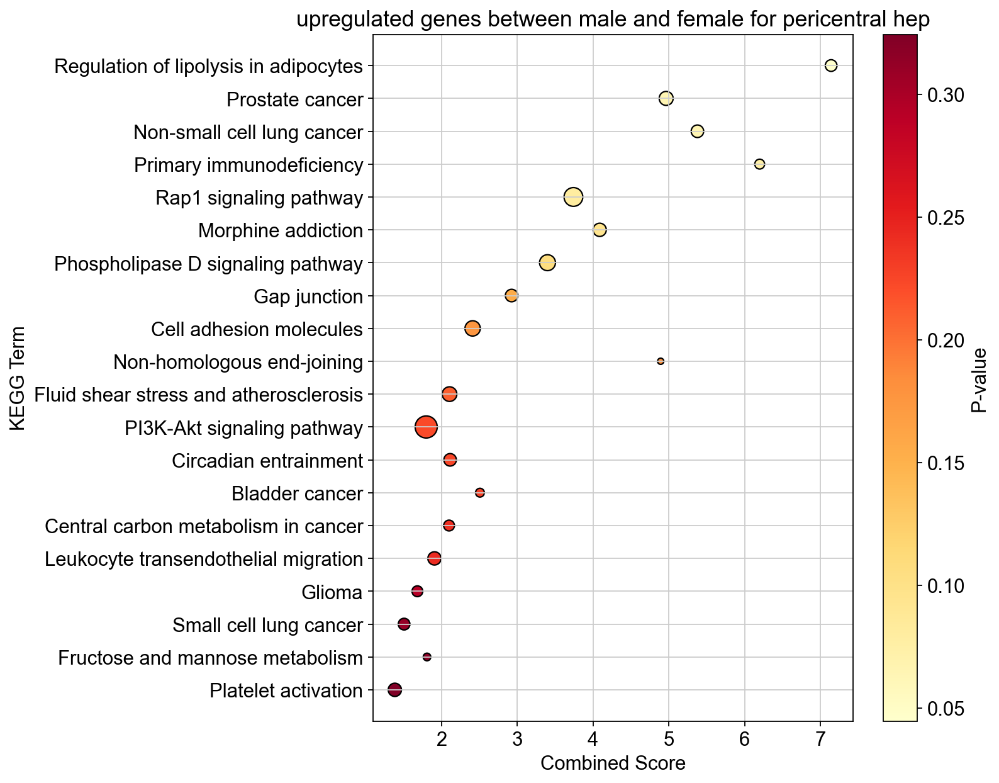

In [258]:
up_enrichment_20['Count'] = [int(x.split('/')[0]) for x in up_enrichment_20['Overlap']]
up_enrichment_20['dot_size'] = up_enrichment_20['Count'] * 10
plt.figure(figsize=(10, 8))
scatter = plt.scatter(up_enrichment_20['Combined Score'], up_enrichment_20['Term'], 
                      s=up_enrichment_20['dot_size'], c=up_enrichment_20['P-value'], cmap='YlOrRd', edgecolor='black')
plt.xlabel('Combined Score', fontsize=14)
plt.ylabel('KEGG Term', fontsize=14)
plt.title('upregulated genes between male and female for pericentral hep', fontsize=16)
plt.colorbar(scatter, label='P-value')
handles, labels = scatter.legend_elements(prop="sizes", alpha=0.6)
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

In [259]:
down_enrichment = gp.enrichr(gene_list = downregulated_genes, gene_sets = 'KEGG_2021_Human', organism = 'Mouse')

In [260]:
down_enrichment_df = pd.DataFrame(down_enrichment.results)
down_enrichment_20 = down_enrichment_df.head(20)
down_enrichment_20

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,KEGG_2021_Human,Vitamin B6 metabolism,3/6,0.025344,0.999996,0,0,7.429174,27.303716,PSAT1;PNPO;PDXP
1,KEGG_2021_Human,ECM-receptor interaction,17/88,0.028606,0.999996,0,0,1.782473,6.335173,LAMA4;GP1BA;LAMC1;HMMR;NPNT;THBS2;HSPG2;COL1A1...
2,KEGG_2021_Human,Hedgehog signaling pathway,11/56,0.062633,0.999996,0,0,1.817823,5.036207,EVC2;HHAT;GRK3;EVC;CCND1;KIF3A;IQCE;GAS1;EFCAB...
3,KEGG_2021_Human,Focal adhesion,31/201,0.076712,0.999996,0,0,1.357923,3.486737,SHC4;SRC;LAMA4;LAMC1;THBS2;ELK1;MYLK3;RELN;CCN...
4,KEGG_2021_Human,Protein digestion and absorption,17/103,0.099787,0.999996,0,0,1.470319,3.388667,SLC6A19;CELA2A;COL16A1;COL14A1;COL12A1;SLC3A1;...
5,KEGG_2021_Human,D-Glutamine and D-glutamate metabolism,2/5,0.110391,0.999996,0,0,4.950695,10.909978,GLS2;GLS
6,KEGG_2021_Human,Proteoglycans in cancer,29/205,0.182026,0.999996,0,0,1.225541,2.087839,CAMK2B;CD63;SRC;ITPR3;ELK1;CCND1;ERBB3;ERBB2;P...
7,KEGG_2021_Human,Bladder cancer,7/41,0.208039,0.999996,0,0,1.529424,2.401244,RPS6KA5;CCND1;SRC;CDH1;ERBB2;RAF1;HBEGF
8,KEGG_2021_Human,Axon guidance,25/182,0.248022,0.999996,0,0,1.183629,1.650260,CAMK2B;SEMA5B;SRC;SEMA3B;SEMA3F;EFNA4;RND1;EFN...
9,KEGG_2021_Human,Histidine metabolism,4/22,0.260810,0.999996,0,0,1.650218,2.217830,HAL;ALDH1B1;ALDH3B1;CARNS1


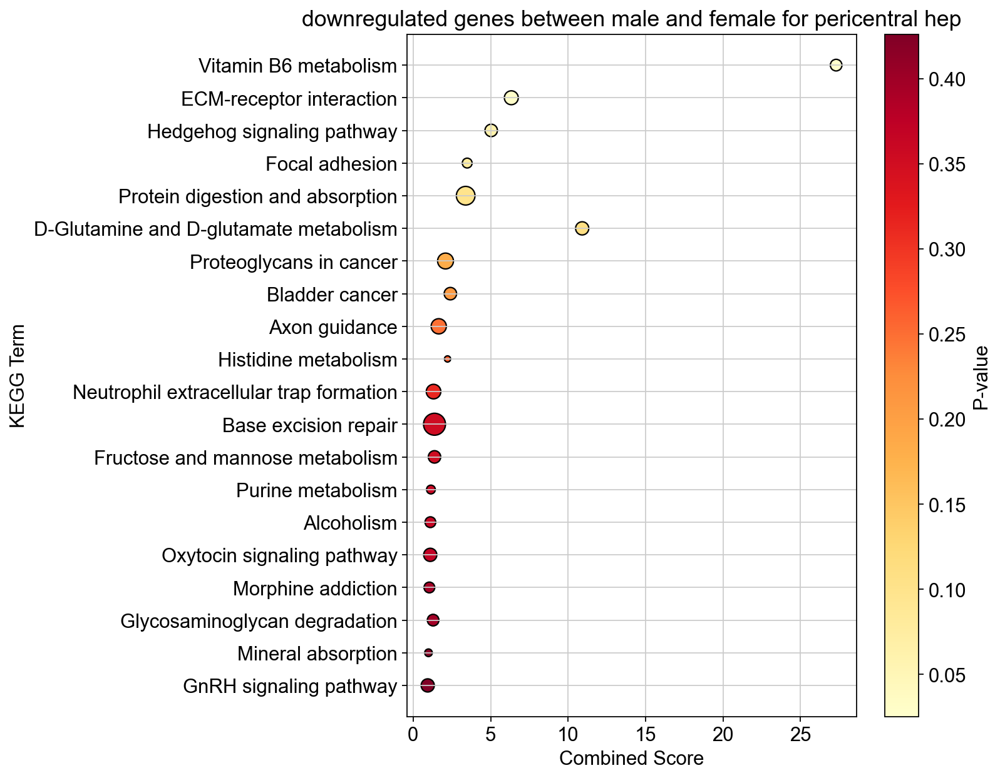

In [261]:
down_enrichment_20['Count'] = [int(x.split('/')[0]) for x in up_enrichment_20['Overlap']]
down_enrichment_20['dot_size'] = down_enrichment_20['Count'] * 10
plt.figure(figsize=(10, 8))
scatter = plt.scatter(down_enrichment_20['Combined Score'], down_enrichment_20['Term'], 
                      s=up_enrichment_20['dot_size'], c=down_enrichment_20['P-value'], cmap='YlOrRd', edgecolor='black')
plt.xlabel('Combined Score', fontsize=14)
plt.ylabel('KEGG Term', fontsize=14)
plt.title('downregulated genes between male and female for pericentral hep', fontsize=16)
plt.colorbar(scatter, label='P-value')
handles, labels = scatter.legend_elements(prop="sizes", alpha=0.6)
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

# Comparing the gene expression of old female pericentral hepatocytes(cluster 3) against old female periportal hepatocytes (cluster 4)
The questions I am trying to answer are:

- How does old age affect female periportal and pericentral hepatocytes?
- What functions are affected?

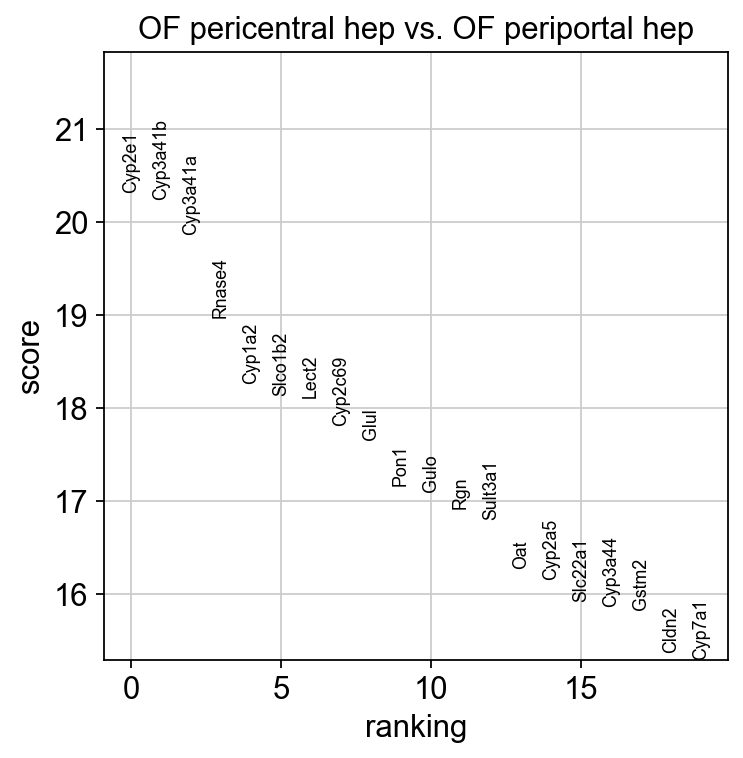

In [262]:
sc.tl.rank_genes_groups(liver_ss3, 'CV & PV', groups=['OF pericentral hep'], reference='OF periportal hep', method='wilcoxon', use_raw=True)
sc.pl.rank_genes_groups(liver_ss3, groups=['OF pericentral hep'], n_genes=20)

In [263]:
sc.tl.rank_genes_groups(liver_ss3, 'CV & PV', groups=['OF periportal hep'], reference='OF pericentral hep', method='wilcoxon', use_raw=True)
print(liver_ss3.uns['rank_genes_groups'].keys())
print(liver_ss3.uns['rank_genes_groups']['names'].dtype.names)

dict_keys(['params', 'names', 'scores', 'pvals', 'pvals_adj', 'logfoldchanges'])
('OF periportal hep',)


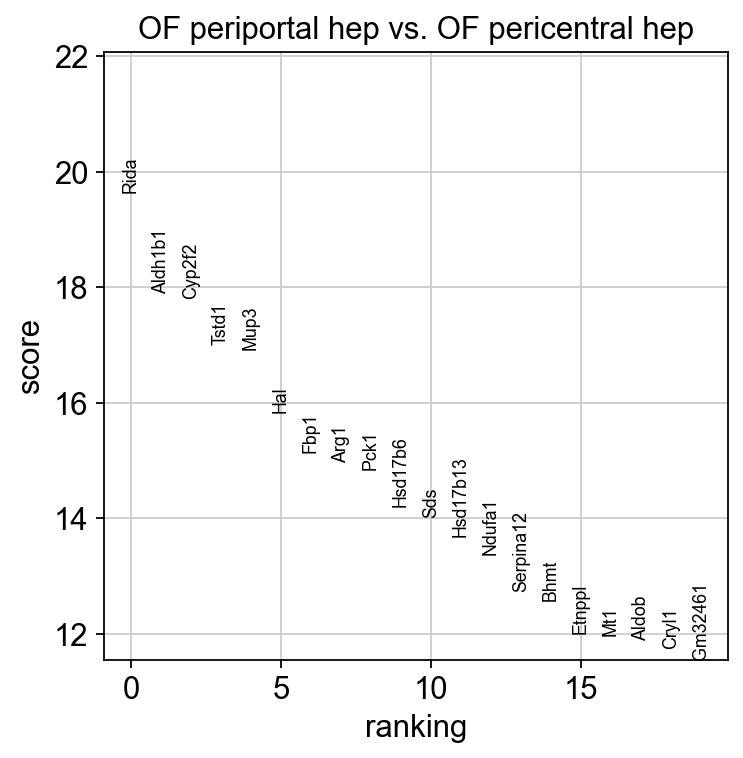

In [264]:
sc.pl.rank_genes_groups(liver_ss3, groups=['OF periportal hep'], n_genes=20)

In [265]:
mop_res = liver_ss3.uns['rank_genes_groups']
groups = mop_res['names'].dtype.names
mop_degs = pd.DataFrame(
    {group + '_' + key: mop_res[key][group]
    for group in groups for key in ['names','scores', 'pvals','pvals_adj','logfoldchanges']})

In [266]:
mop_degs

,OF periportal hep_names,OF periportal hep_scores,OF periportal hep_pvals,OF periportal hep_pvals_adj,OF periportal hep_logfoldchanges
0,Rida,19.648815,5.917819e-86,2.284574e-82,1.228299
1,Aldh1b1,17.887188,1.484112e-71,2.546407e-68,4.024288
2,Cyp2f2,17.805914,6.358682e-71,8.926433e-68,3.499156
3,Tstd1,17.017244,6.118290e-65,6.298576e-62,1.968270
4,Mup3,16.915901,3.435187e-64,3.120363e-61,1.549915
...,...,...,...,...,...
15437,Cyp1a2,-18.263796,1.607201e-74,4.136401e-71,-3.281996
15438,Rnase4,-18.978882,2.549649e-80,7.874337e-77,-2.198641
15439,Cyp3a41a,-19.866718,7.900054e-88,4.066421e-84,-4.420182
15440,Cyp3a41b,-20.251520,3.444387e-91,2.659411e-87,-4.326992


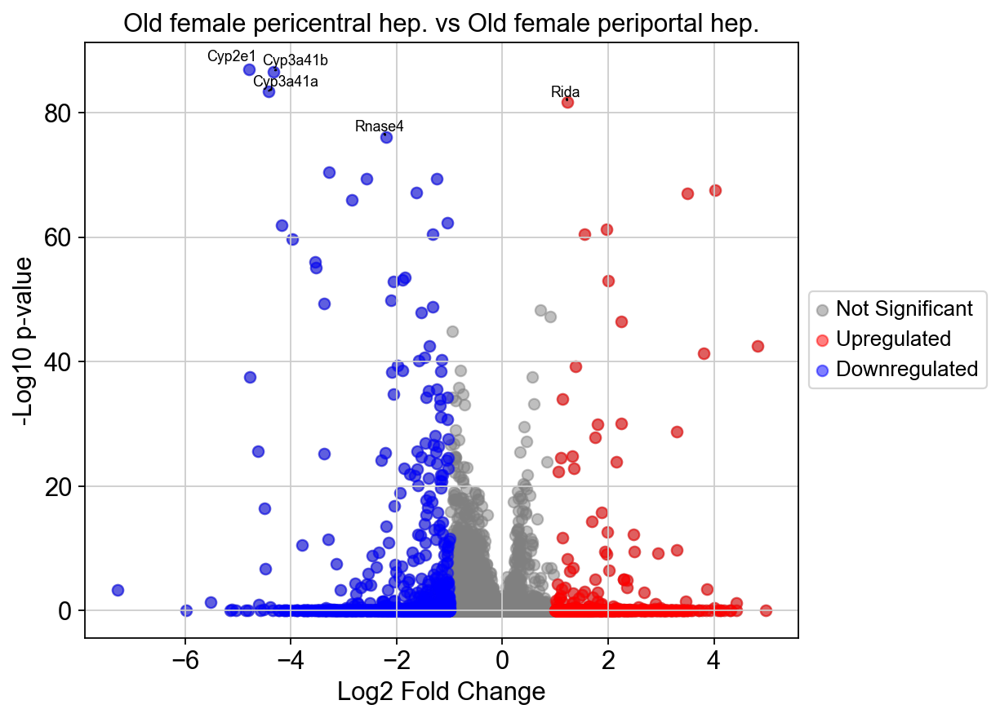

In [267]:
#padj_threshold = 0.05
logfc_threshold = 1

# Filter the data to exclude log2 fold changes lower than -15 and higher than 15
filtered_mop_degs = mop_degs[(mop_degs['OF periportal hep_logfoldchanges'] >= -15) & 
                             (mop_degs['OF periportal hep_logfoldchanges'] <= 15)]

# Identify significant genes within the filtered data
significant_genes = filtered_mop_degs[(filtered_mop_degs['OF periportal hep_logfoldchanges'].abs() > logfc_threshold)]
upregulated_genes = significant_genes[significant_genes['OF periportal hep_logfoldchanges'] > logfc_threshold]
downregulated_genes = significant_genes[significant_genes['OF periportal hep_logfoldchanges'] < -logfc_threshold]
top_genes = significant_genes.sort_values(by='OF periportal hep_pvals_adj').head(5)

plt.figure(figsize=(7, 6))
plt.scatter(filtered_mop_degs['OF periportal hep_logfoldchanges'], 
            -np.log10(filtered_mop_degs['OF periportal hep_pvals_adj']),
            c='grey', alpha=0.5, label='Not Significant')
plt.scatter(upregulated_genes['OF periportal hep_logfoldchanges'], 
            -np.log10(upregulated_genes['OF periportal hep_pvals_adj']),
            c='red', alpha=0.5, label='Upregulated')
plt.scatter(downregulated_genes['OF periportal hep_logfoldchanges'], 
            -np.log10(downregulated_genes['OF periportal hep_pvals_adj']),
            c='blue', alpha=0.5, label='Downregulated')

texts = []
for i, row in top_genes.iterrows():
    texts.append(plt.text(row['OF periportal hep_logfoldchanges'], 
                          -np.log10(row['OF periportal hep_pvals_adj']) + 0.1,
                          row['OF periportal hep_names'], fontsize=8, ha='center'))

adjust_text(texts, arrowprops=dict(arrowstyle='->'))
plt.xlabel('Log2 Fold Change')
plt.ylabel('-Log10 p-value')
plt.title('Old female pericentral hep. vs Old female periportal hep.')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize='small')
plt.show()


## here starts the analysis of each individual clusters
Go through it only if you have time for left 

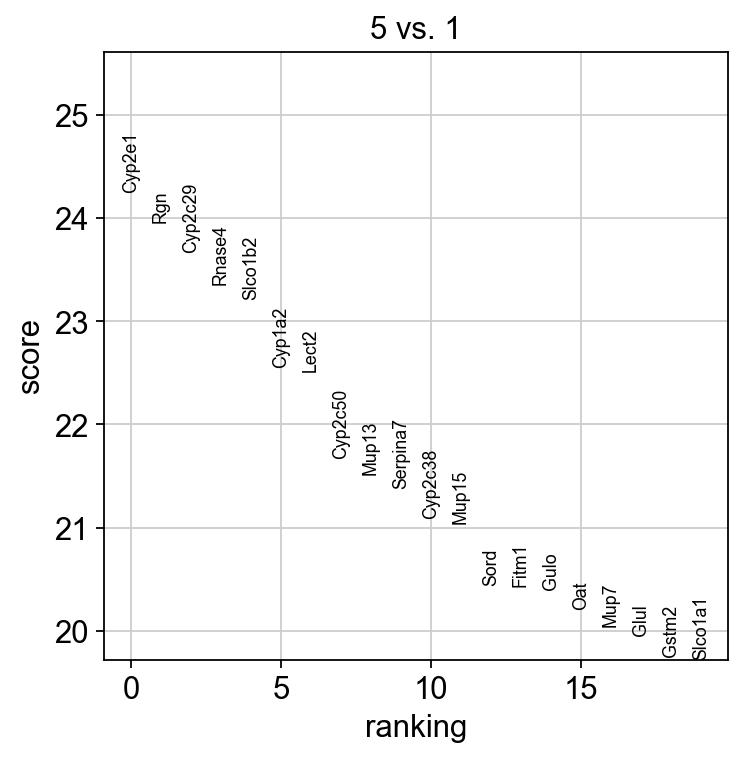

In [103]:
sc.tl.rank_genes_groups(liver_ss3, 'leiden', groups=['5'], reference='1', method='wilcoxon', use_raw=True)
sc.pl.rank_genes_groups(liver_ss3, groups=['5'], n_genes=20)

In [104]:
sc.tl.rank_genes_groups(liver_ss3, 'leiden', groups=['5'], reference='1', method='wilcoxon')
mop_res = liver_ss3.uns['rank_genes_groups']
groups = mop_res['names'].dtype.names
mop_degs = pd.DataFrame(
    {group + '_' + key: mop_res[key][group]
    for group in groups for key in ['names','scores', 'pvals','pvals_adj','logfoldchanges']})
mop_degs


,5_names,5_scores,5_pvals,5_pvals_adj,5_logfoldchanges
0,Cyp2e1,24.253107,6.131313e-130,9.467974e-126,8.416945
1,Rgn,23.963448,6.691646e-127,5.166620e-123,3.459778
2,Cyp2c29,23.665615,8.152102e-124,4.196158e-120,4.844891
3,Rnase4,23.355604,1.208814e-120,4.666625e-117,3.350280
4,Slco1b2,23.211813,3.459728e-119,8.904186e-116,2.276751
...,...,...,...,...,...
15437,Fbp1,-21.127293,4.464223e-99,4.595769e-96,-1.284841
15438,Hsd17b13,-21.891850,3.106516e-106,4.360983e-103,-2.634052
15439,Hal,-22.262022,8.626821e-110,1.332154e-106,-3.452546
15440,Rida,-23.133976,2.107840e-118,4.649895e-115,-1.519188


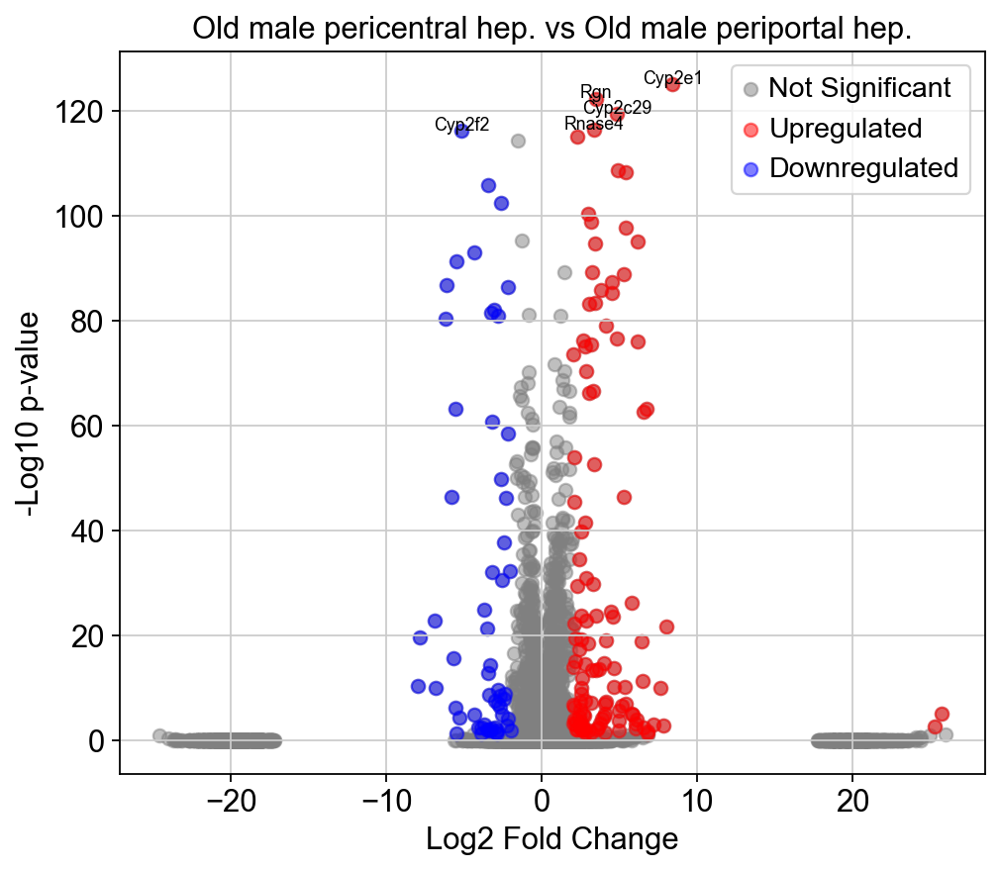

In [105]:
padj_threshold = 0.05
logfc_threshold = 2

significant_genes = mop_degs[(mop_degs['5_pvals_adj'] < padj_threshold) & (mop_degs['5_logfoldchanges'].abs() > logfc_threshold)]

upregulated_genes = significant_genes[significant_genes['5_logfoldchanges'] > logfc_threshold]
downregulated_genes = significant_genes[significant_genes['5_logfoldchanges'] < -logfc_threshold]
top_genes = significant_genes.sort_values(by='5_pvals_adj').head(5)
plt.figure(figsize=(7, 6))
plt.scatter(mop_degs['5_logfoldchanges'], -np.log10(mop_degs['5_pvals_adj']), c='grey', alpha=0.5, label='Not Significant')
plt.scatter(upregulated_genes['5_logfoldchanges'], -np.log10(upregulated_genes['5_pvals_adj']), c='red', alpha=0.5, label='Upregulated')
plt.scatter(downregulated_genes['5_logfoldchanges'], -np.log10(downregulated_genes['5_pvals_adj']), c='blue', alpha=0.5, label='Downregulated')
for i, row in top_genes.iterrows():
    plt.text(row['5_logfoldchanges'], -np.log10(row['5_pvals_adj']) + 0.1, row['5_names'],
             fontsize=8, ha='center')
plt.xlabel('Log2 Fold Change')
plt.ylabel('-Log10 p-value')
plt.title('Old male pericentral hep. vs Old male periportal hep.')
plt.legend()
plt.show()

In [106]:
results = liver_ss3.uns['rank_genes_groups']
groups = results['names'].dtype.names
pvals_adj = results['pvals_adj']

In [107]:
names = results['names']['5']
logfoldchanges = results['logfoldchanges']['5']
pvals = pvals_adj['5']
mean_expression = liver_ss3.raw[:, results['names']['5']].X.mean(axis=0)
mean_expression = np.array(mean_expression).flatten()
top_n = 10
top_genes = np.argsort(pvals)[:top_n]


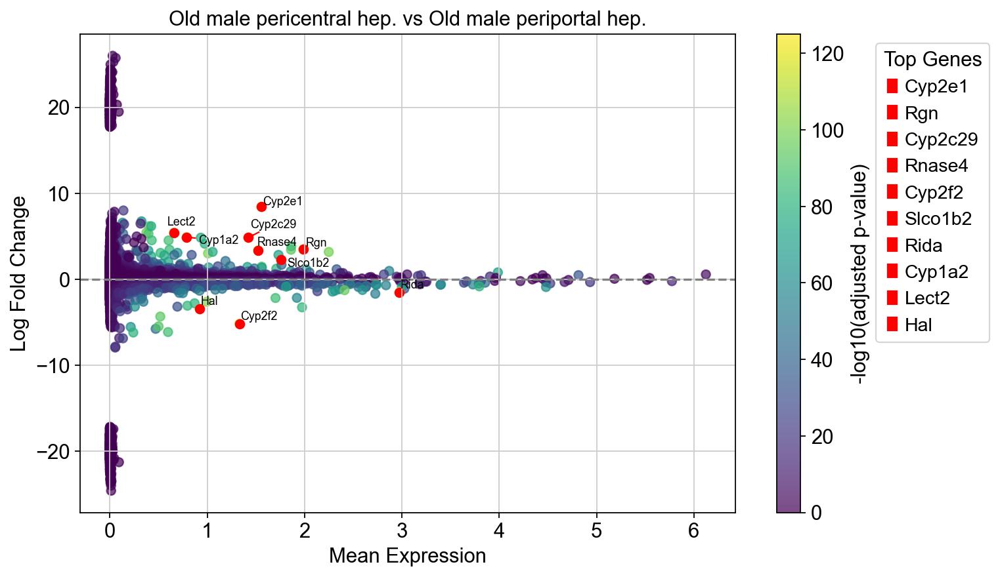

In [108]:
import matplotlib.patches as mpatches
plt.figure(figsize=(10, 6))
plt.scatter(mean_expression, logfoldchanges, c=-np.log10(pvals), cmap='viridis', alpha=0.7)
plt.colorbar(label='-log10(adjusted p-value)')
plt.axhline(0, color='grey', linestyle='--')
plt.xlabel('Mean Expression')
plt.ylabel('Log Fold Change')
plt.title('Old male pericentral hep. vs Old male periportal hep.')
texts = []
for i in top_genes:
    gene_name = liver_ss3.uns['rank_genes_groups']['names']['5'][i]
    plt.scatter(mean_expression[i], logfoldchanges[i], color='red')
    texts.append(plt.text(mean_expression[i], logfoldchanges[i], gene_name, fontsize=8))

adjust_text(texts, arrowprops=dict(arrowstyle='->', color='red'))

handles = [mpatches.Patch(color='red', label=liver_ss3.uns['rank_genes_groups']['names']['5'][i]) for i in top_genes]
plt.legend(handles=handles, title='Top Genes', bbox_to_anchor=(1.2, 1), loc='upper left')

plt.show()

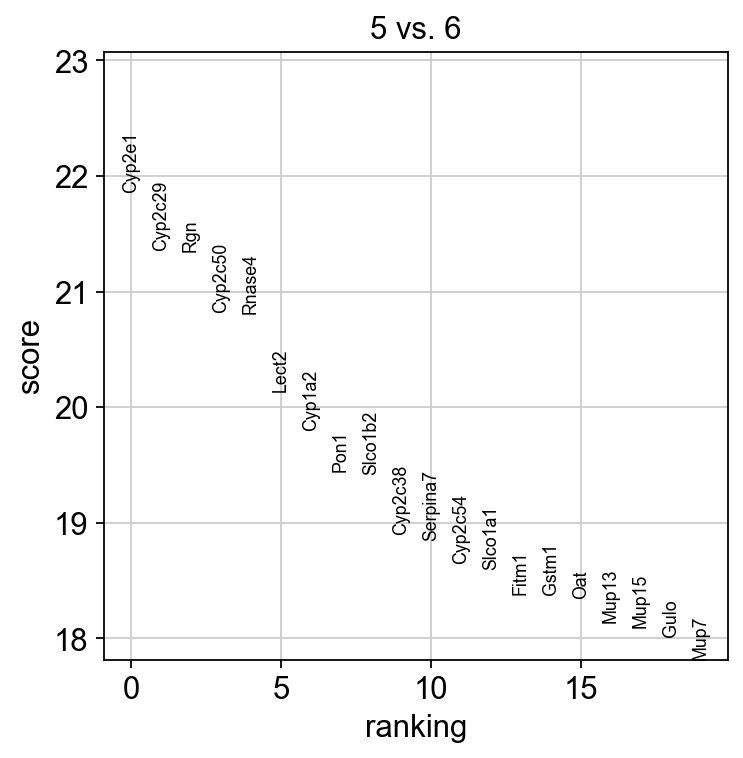

In [109]:
sc.tl.rank_genes_groups(liver_ss3, 'leiden', groups=['5'], reference='6', method='wilcoxon')
sc.pl.rank_genes_groups(liver_ss3, groups=['5'], n_genes=20)

In [110]:
sc.tl.rank_genes_groups(liver_ss3, 'leiden', groups=['5'], reference='6', method='wilcoxon')
mop_res = liver_ss3.uns['rank_genes_groups']
groups = mop_res['names'].dtype.names
mop_degs = pd.DataFrame(
    {group + '_' + key: mop_res[key][group]
    for group in groups for key in ['names','scores', 'pvals','pvals_adj','logfoldchanges']})
mop_degs

,5_names,5_scores,5_pvals,5_pvals_adj,5_logfoldchanges
0,Cyp2e1,21.862146,5.957710e-106,9.199895e-102,7.243488
1,Cyp2c29,21.354670,3.528520e-101,2.087897e-97,4.707760
2,Rgn,21.348156,4.056269e-101,2.087897e-97,3.485231
3,Cyp2c50,20.821547,2.761280e-96,8.458451e-93,3.850692
4,Rnase4,20.813200,3.286537e-96,8.458451e-93,3.466479
...,...,...,...,...,...
15437,Gls2,-19.767920,5.624781e-87,7.238156e-84,-2.915950
15438,Aldh1b1,-20.203741,9.075303e-91,1.557120e-87,-6.837285
15439,Hal,-20.228168,5.531920e-91,1.067799e-87,-3.284118
15440,Ctsc,-20.274174,2.174128e-91,4.796127e-88,-5.677705


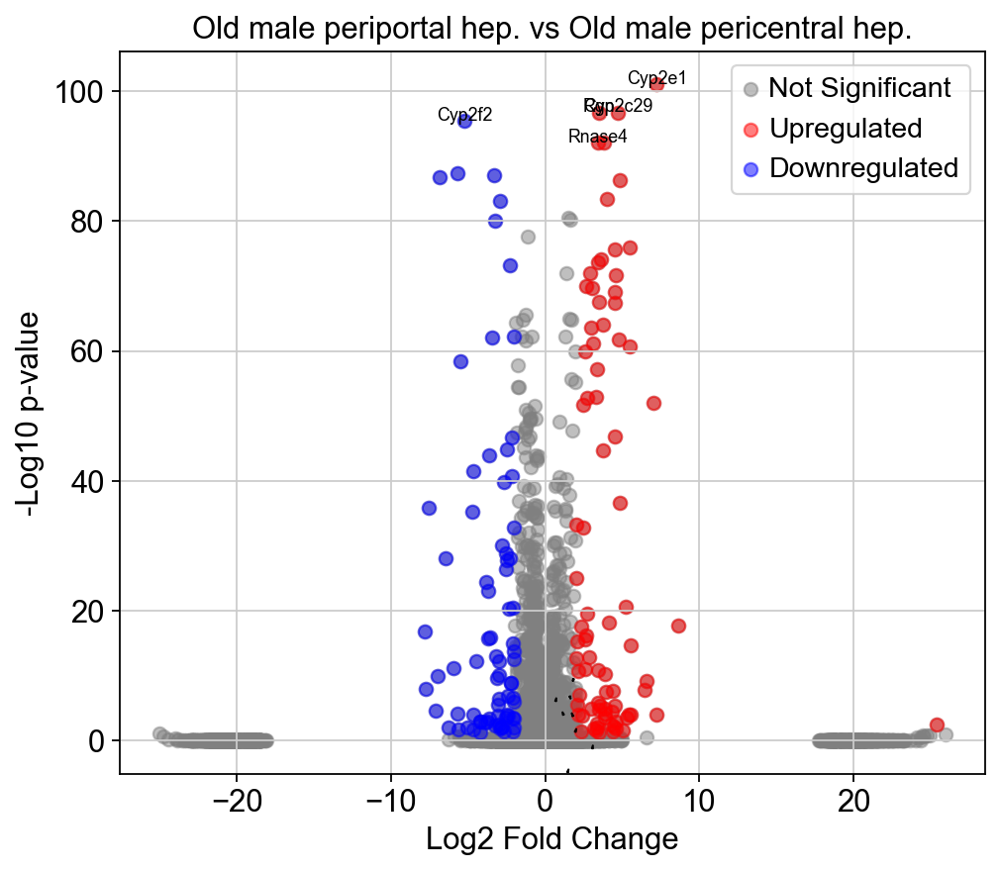

In [111]:

padj_threshold = 0.05
logfc_threshold = 2

significant_genes = mop_degs[(mop_degs['5_pvals_adj'] < padj_threshold) & (mop_degs['5_logfoldchanges'].abs() > logfc_threshold)]

upregulated_genes = significant_genes[significant_genes['5_logfoldchanges'] > logfc_threshold]
downregulated_genes = significant_genes[significant_genes['5_logfoldchanges'] < -logfc_threshold]
top_genes = significant_genes.sort_values(by='5_pvals_adj').head(5)
plt.figure(figsize=(7, 6))
plt.scatter(mop_degs['5_logfoldchanges'], -np.log10(mop_degs['5_pvals_adj']), c='grey', alpha=0.5, label='Not Significant')
plt.scatter(upregulated_genes['5_logfoldchanges'], -np.log10(upregulated_genes['5_pvals_adj']), c='red', alpha=0.5, label='Upregulated')
plt.scatter(downregulated_genes['5_logfoldchanges'], -np.log10(downregulated_genes['5_pvals_adj']), c='blue', alpha=0.5, label='Downregulated')
for i, row in top_genes.iterrows():
    plt.text(row['5_logfoldchanges'], -np.log10(row['5_pvals_adj']) + 0.1, row['5_names'],
             fontsize=8, ha='center')
adjust_text(texts, arrowprops=dict(arrowstyle='->', color='black'))

plt.xlabel('Log2 Fold Change')
plt.ylabel('-Log10 p-value')
plt.title('Old male periportal hep. vs Old male pericentral hep.')
plt.legend()
plt.show()

In [112]:
results = liver_ss3.uns['rank_genes_groups']
groups = results['names'].dtype.names
pvals_adj = results['pvals_adj']

In [113]:
names = results['names']['5']
logfoldchanges = results['logfoldchanges']['5']
pvals = pvals_adj['5']
mean_expression = liver_ss3.raw[:, results['names']['5']].X.mean(axis=0)
mean_expression = np.array(mean_expression).flatten()
top_n = 10
top_genes = np.argsort(pvals)[:top_n]


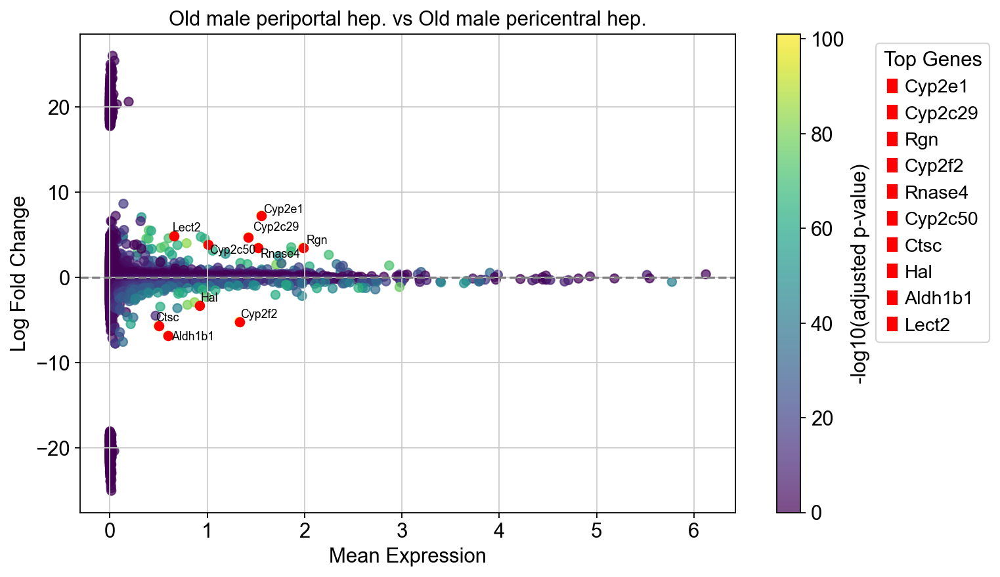

In [114]:
plt.figure(figsize=(10, 6))
plt.scatter(mean_expression, logfoldchanges, c=-np.log10(pvals), cmap='viridis', alpha=0.7)
plt.colorbar(label='-log10(adjusted p-value)')
plt.axhline(0, color='grey', linestyle='--')
plt.xlabel('Mean Expression')
plt.ylabel('Log Fold Change')
plt.title('Old male periportal hep. vs Old male pericentral hep.')
texts = []
for i in top_genes:
    gene_name = liver_ss3.uns['rank_genes_groups']['names']['5'][i]
    plt.scatter(mean_expression[i], logfoldchanges[i], color='red')
    texts.append(plt.text(mean_expression[i], logfoldchanges[i], gene_name, fontsize=8))

adjust_text(texts, arrowprops=dict(arrowstyle='->', color='red'))

handles = [mpatches.Patch(color='red', label=liver_ss3.uns['rank_genes_groups']['names']['5'][i]) for i in top_genes]
plt.legend(handles=handles, title='Top Genes', bbox_to_anchor=(1.2, 1), loc='upper left')

plt.show()

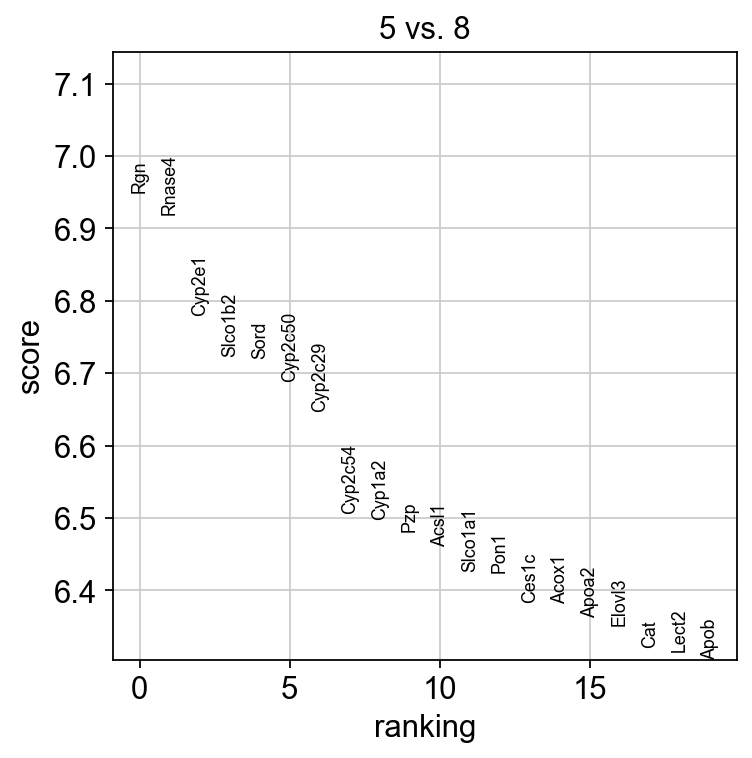

In [115]:
sc.tl.rank_genes_groups(liver_ss3, 'leiden', groups=['5'], reference='8', method='wilcoxon')
sc.pl.rank_genes_groups(liver_ss3, groups=['5'], n_genes=20)

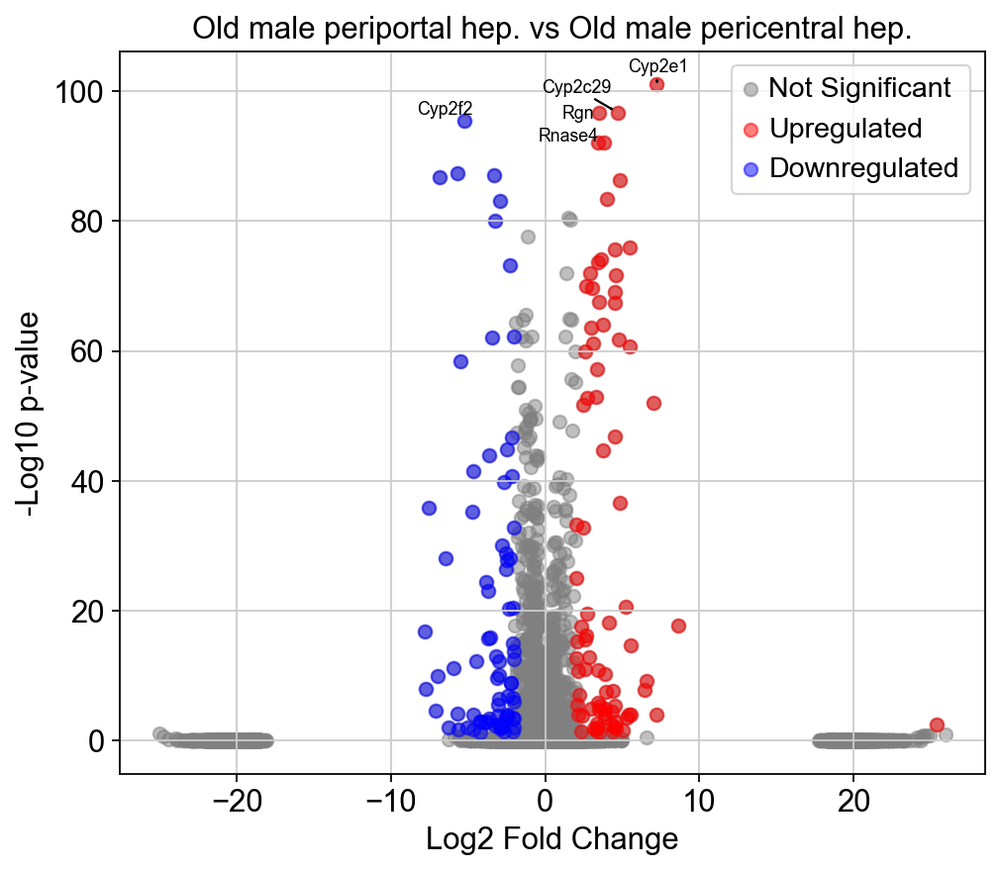

In [116]:
sc.tl.rank_genes_groups(liver_ss3, 'leiden', groups=['5'], reference='6', method='wilcoxon')
mop_res = liver_ss3.uns['rank_genes_groups']
groups = mop_res['names'].dtype.names
mop_degs = pd.DataFrame(
    {group + '_' + key: mop_res[key][group]
    for group in groups for key in ['names','scores', 'pvals','pvals_adj','logfoldchanges']})
mop_degs
padj_threshold = 0.05
logfc_threshold = 2

significant_genes = mop_degs[(mop_degs['5_pvals_adj'] < padj_threshold) & (mop_degs['5_logfoldchanges'].abs() > logfc_threshold)]

upregulated_genes = significant_genes[significant_genes['5_logfoldchanges'] > logfc_threshold]
downregulated_genes = significant_genes[significant_genes['5_logfoldchanges'] < -logfc_threshold]
top_genes = significant_genes.sort_values(by='5_pvals_adj').head(5)
plt.figure(figsize=(7, 6))
plt.scatter(mop_degs['5_logfoldchanges'], -np.log10(mop_degs['5_pvals_adj']), c='grey', alpha=0.5, label='Not Significant')
plt.scatter(upregulated_genes['5_logfoldchanges'], -np.log10(upregulated_genes['5_pvals_adj']), c='red', alpha=0.5, label='Upregulated')
plt.scatter(downregulated_genes['5_logfoldchanges'], -np.log10(downregulated_genes['5_pvals_adj']), c='blue', alpha=0.5, label='Downregulated')
texts = []
for i in top_genes.index:
    texts.append(
        plt.text(top_genes.at[i, '5_logfoldchanges'], -np.log10(top_genes.at[i, '5_pvals_adj']),
                 top_genes.at[i, '5_names'], fontsize=8, ha='right')
    )

adjust_text(texts, arrowprops=dict(arrowstyle='->', color='black'))

plt.xlabel('Log2 Fold Change')
plt.ylabel('-Log10 p-value')
plt.title('Old male periportal hep. vs Old male pericentral hep.')
plt.legend()
plt.show()

In [117]:
results = liver_ss3.uns['rank_genes_groups']
groups = results['names'].dtype.names
pvals_adj = results['pvals_adj']

In [118]:
names = results['names']['5']
logfoldchanges = results['logfoldchanges']['5']
pvals = pvals_adj['5']
mean_expression = liver_ss3.raw[:, results['names']['5']].X.mean(axis=0)
mean_expression = np.array(mean_expression).flatten()
top_n = 10
top_genes = np.argsort(pvals)[:top_n]

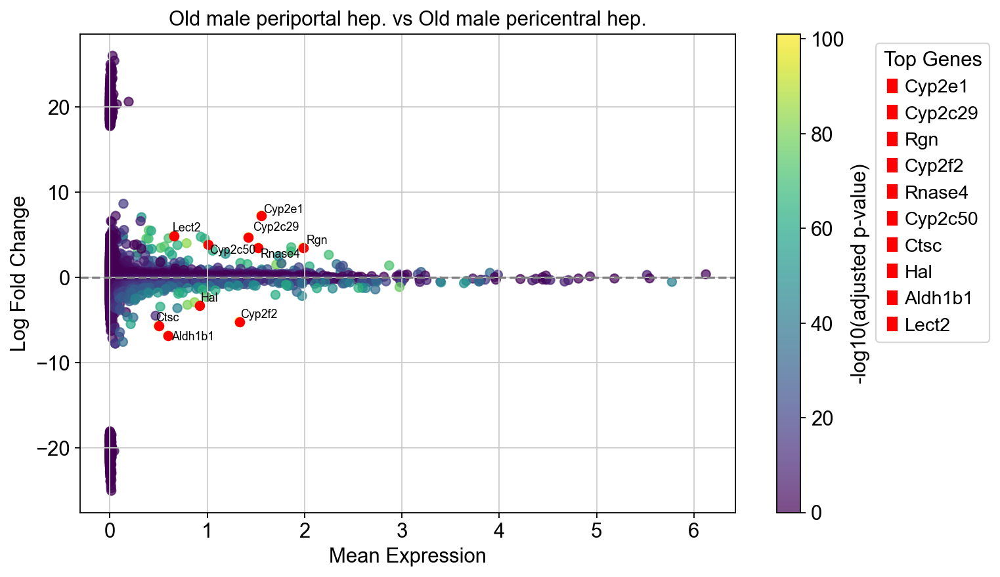

In [119]:
plt.figure(figsize=(10, 6))
plt.scatter(mean_expression, logfoldchanges, c=-np.log10(pvals), cmap='viridis', alpha=0.7)
plt.colorbar(label='-log10(adjusted p-value)')
plt.axhline(0, color='grey', linestyle='--')
plt.xlabel('Mean Expression')
plt.ylabel('Log Fold Change')
plt.title('Old male periportal hep. vs Old male pericentral hep.')
texts = []
for i in top_genes:
    gene_name = liver_ss3.uns['rank_genes_groups']['names']['5'][i]
    plt.scatter(mean_expression[i], logfoldchanges[i], color='red')
    texts.append(plt.text(mean_expression[i], logfoldchanges[i], gene_name, fontsize=8))

adjust_text(texts, arrowprops=dict(arrowstyle='->', color='red'))

handles = [mpatches.Patch(color='red', label=liver_ss3.uns['rank_genes_groups']['names']['5'][i]) for i in top_genes]
plt.legend(handles=handles, title='Top Genes', bbox_to_anchor=(1.2, 1), loc='upper left')

plt.show()

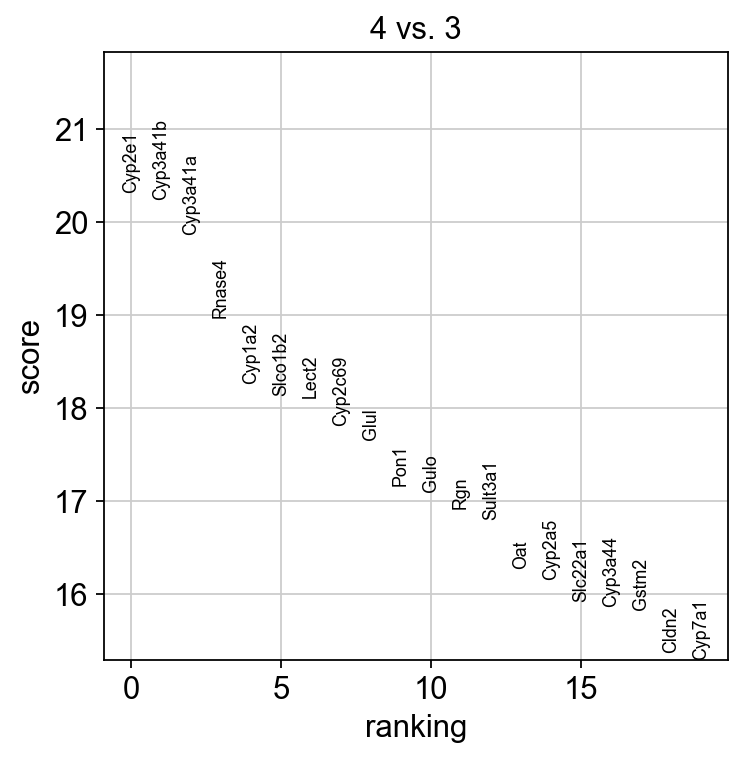

In [120]:
sc.tl.rank_genes_groups(liver_ss3, 'leiden', groups=['4'], reference='3', method='wilcoxon')
sc.pl.rank_genes_groups(liver_ss3, groups=['4'], n_genes=20)

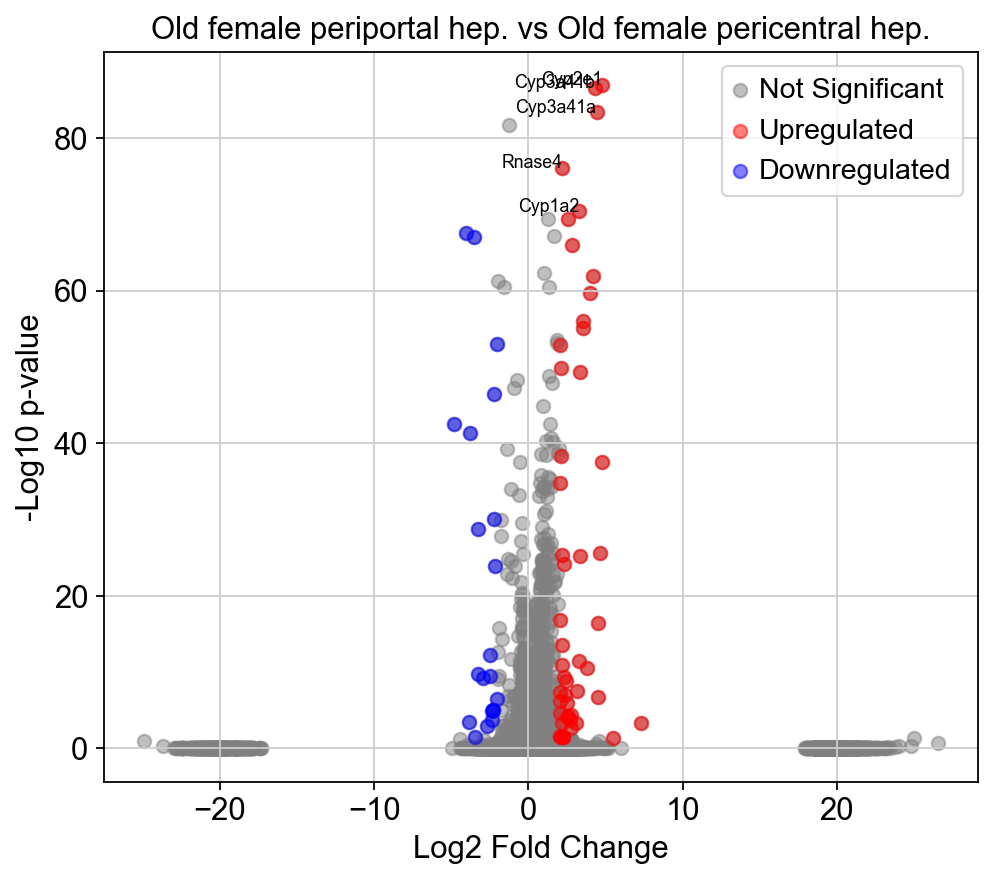

In [121]:
sc.tl.rank_genes_groups(liver_ss3, 'leiden', groups=['4'], reference='3', method='wilcoxon')
mop_res = liver_ss3.uns['rank_genes_groups']
groups = mop_res['names'].dtype.names
mop_degs = pd.DataFrame(
    {group + '_' + key: mop_res[key][group]
    for group in groups for key in ['names','scores', 'pvals','pvals_adj','logfoldchanges']})
mop_degs
padj_threshold = 0.05
logfc_threshold = 2

significant_genes = mop_degs[(mop_degs['4_pvals_adj'] < padj_threshold) & (mop_degs['4_logfoldchanges'].abs() > logfc_threshold)]

upregulated_genes = significant_genes[significant_genes['4_logfoldchanges'] > logfc_threshold]
downregulated_genes = significant_genes[significant_genes['4_logfoldchanges'] < -logfc_threshold]
top_genes = significant_genes.sort_values(by='4_pvals_adj').head(5)
plt.figure(figsize=(7, 6))
plt.scatter(mop_degs['4_logfoldchanges'], -np.log10(mop_degs['4_pvals_adj']), c='grey', alpha=0.5, label='Not Significant')
plt.scatter(upregulated_genes['4_logfoldchanges'], -np.log10(upregulated_genes['4_pvals_adj']), c='red', alpha=0.5, label='Upregulated')
plt.scatter(downregulated_genes['4_logfoldchanges'], -np.log10(downregulated_genes['4_pvals_adj']), c='blue', alpha=0.5, label='Downregulated')
for i in top_genes.index:
    texts.append(
        plt.text(top_genes.at[i, '4_logfoldchanges'], -np.log10(top_genes.at[i, '4_pvals_adj']),
                 top_genes.at[i, '4_names'], fontsize=8, ha='right')
    )


plt.xlabel('Log2 Fold Change')
plt.ylabel('-Log10 p-value')
plt.title('Old female periportal hep. vs Old female pericentral hep.')
plt.legend()
plt.show()

In [122]:
results = liver_ss3.uns['rank_genes_groups']
groups = results['names'].dtype.names
pvals_adj = results['pvals_adj']

In [123]:
names = results['names']['4']
logfoldchanges = results['logfoldchanges']['4']
pvals = pvals_adj['4']
mean_expression = liver_ss3.raw[:, results['names']['4']].X.mean(axis=0)
mean_expression = np.array(mean_expression).flatten()
top_n = 10
top_genes = np.argsort(pvals)[:top_n]

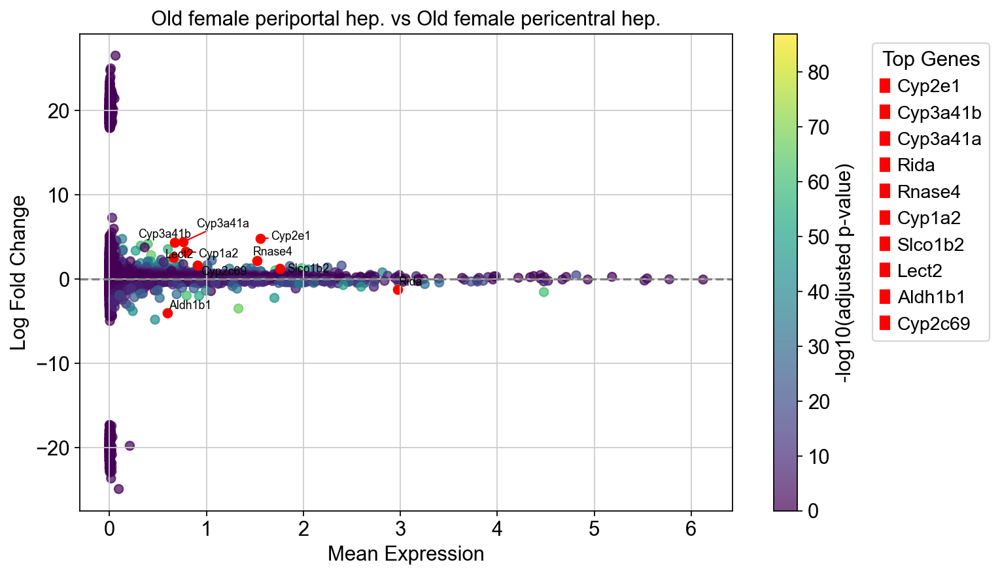

In [124]:
plt.figure(figsize=(10, 6))
plt.scatter(mean_expression, logfoldchanges, c=-np.log10(pvals), cmap='viridis', alpha=0.7)
plt.colorbar(label='-log10(adjusted p-value)')
plt.axhline(0, color='grey', linestyle='--')
plt.xlabel('Mean Expression')
plt.ylabel('Log Fold Change')
plt.title('Old female periportal hep. vs Old female pericentral hep.')
texts = []
for i in top_genes:
    gene_name = liver_ss3.uns['rank_genes_groups']['names']['4'][i]
    plt.scatter(mean_expression[i], logfoldchanges[i], color='red')
    texts.append(plt.text(mean_expression[i], logfoldchanges[i], gene_name, fontsize=8))

adjust_text(texts, arrowprops=dict(arrowstyle='->', color='red'))

handles = [mpatches.Patch(color='red', label=liver_ss3.uns['rank_genes_groups']['names']['4'][i]) for i in top_genes]
plt.legend(handles=handles, title='Top Genes', bbox_to_anchor=(1.2, 1), loc='upper left')

plt.show()

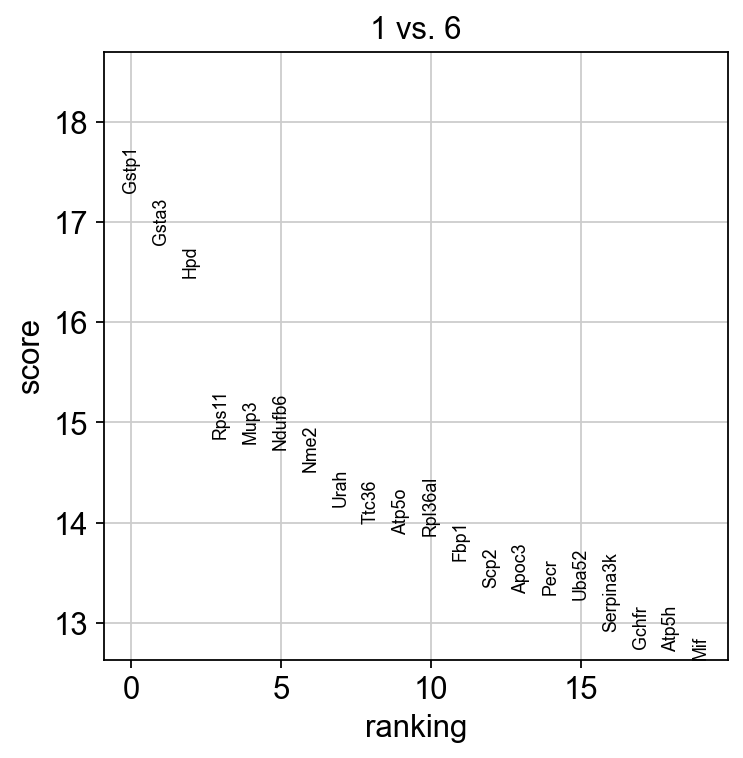

In [125]:
sc.tl.rank_genes_groups(liver_ss3, 'leiden', groups=['1'], reference='6', method='wilcoxon')
sc.pl.rank_genes_groups(liver_ss3, groups=['1'], n_genes=20)

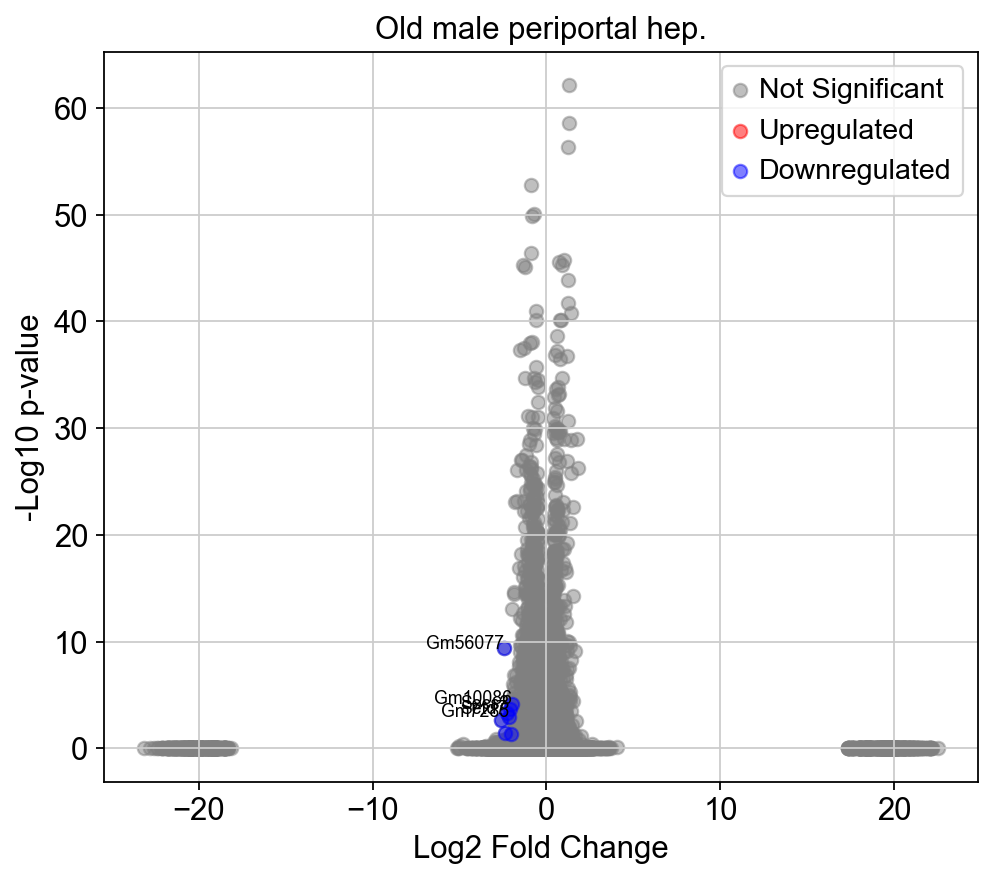

In [126]:
sc.tl.rank_genes_groups(liver_ss3, 'leiden', groups=['1'], reference='6', method='wilcoxon')
mop_res = liver_ss3.uns['rank_genes_groups']
groups = mop_res['names'].dtype.names
mop_degs = pd.DataFrame(
    {group + '_' + key: mop_res[key][group]
    for group in groups for key in ['names','scores', 'pvals','pvals_adj','logfoldchanges']})
mop_degs
padj_threshold = 0.05
logfc_threshold = 2

significant_genes = mop_degs[(mop_degs['1_pvals_adj'] < padj_threshold) & (mop_degs['1_logfoldchanges'].abs() > logfc_threshold)]

upregulated_genes = significant_genes[significant_genes['1_logfoldchanges'] > logfc_threshold]
downregulated_genes = significant_genes[significant_genes['1_logfoldchanges'] < -logfc_threshold]
top_genes = significant_genes.sort_values(by='1_pvals_adj').head(5)
plt.figure(figsize=(7, 6))
plt.scatter(mop_degs['1_logfoldchanges'], -np.log10(mop_degs['1_pvals_adj']), c='grey', alpha=0.5, label='Not Significant')
plt.scatter(upregulated_genes['1_logfoldchanges'], -np.log10(upregulated_genes['1_pvals_adj']), c='red', alpha=0.5, label='Upregulated')
plt.scatter(downregulated_genes['1_logfoldchanges'], -np.log10(downregulated_genes['1_pvals_adj']), c='blue', alpha=0.5, label='Downregulated')
for i in top_genes.index:
    texts.append(
        plt.text(top_genes.at[i, '1_logfoldchanges'], -np.log10(top_genes.at[i, '1_pvals_adj']),
                 top_genes.at[i, '1_names'], fontsize=8, ha='right')
    )


plt.xlabel('Log2 Fold Change')
plt.ylabel('-Log10 p-value')
plt.title('Old male periportal hep.')
plt.legend()
plt.show()

In [127]:
results = liver_ss3.uns['rank_genes_groups']
groups = results['names'].dtype.names
pvals_adj = results['pvals_adj']

In [128]:
names = results['names']['1']
logfoldchanges = results['logfoldchanges']['1']
pvals = pvals_adj['1']
mean_expression = liver_ss3.raw[:, results['names']['1']].X.mean(axis=0)
mean_expression = np.array(mean_expression).flatten()
top_n = 5
top_genes = np.argsort(pvals)[:top_n]

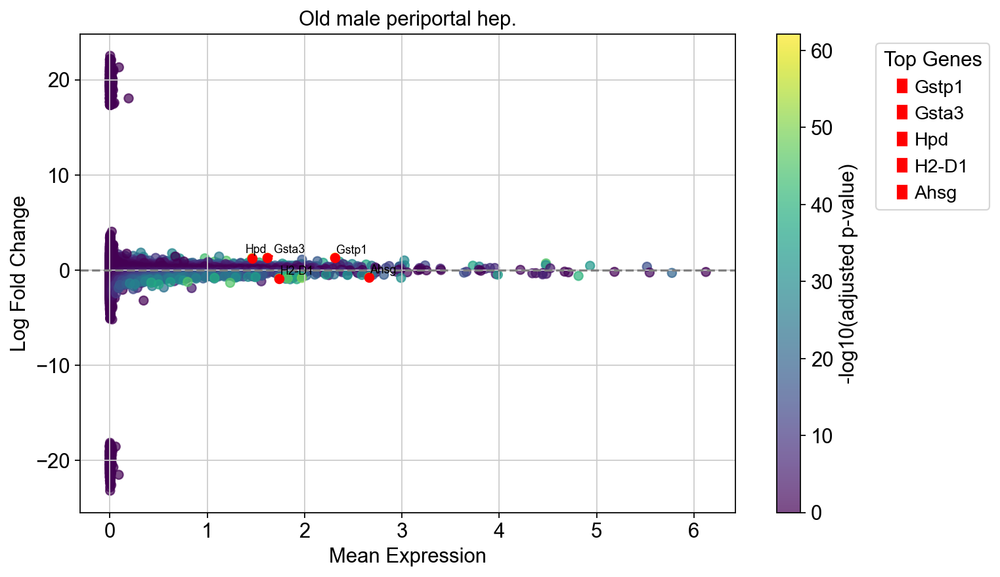

In [129]:
plt.figure(figsize=(10, 6))
plt.scatter(mean_expression, logfoldchanges, c=-np.log10(pvals), cmap='viridis', alpha=0.7)
plt.colorbar(label='-log10(adjusted p-value)')
plt.axhline(0, color='grey', linestyle='--')
plt.xlabel('Mean Expression')
plt.ylabel('Log Fold Change')
plt.title('Old male periportal hep.')
texts = []
for i in top_genes:
    gene_name = liver_ss3.uns['rank_genes_groups']['names']['1'][i]
    plt.scatter(mean_expression[i], logfoldchanges[i], color='red')
    texts.append(plt.text(mean_expression[i], logfoldchanges[i], gene_name, fontsize=8))

adjust_text(texts, arrowprops=dict(arrowstyle='->', color='red'))

handles = [mpatches.Patch(color='red', label=liver_ss3.uns['rank_genes_groups']['names']['1'][i]) for i in top_genes]
plt.legend(handles=handles, title='Top Genes', bbox_to_anchor=(1.2, 1), loc='upper left')

plt.show()

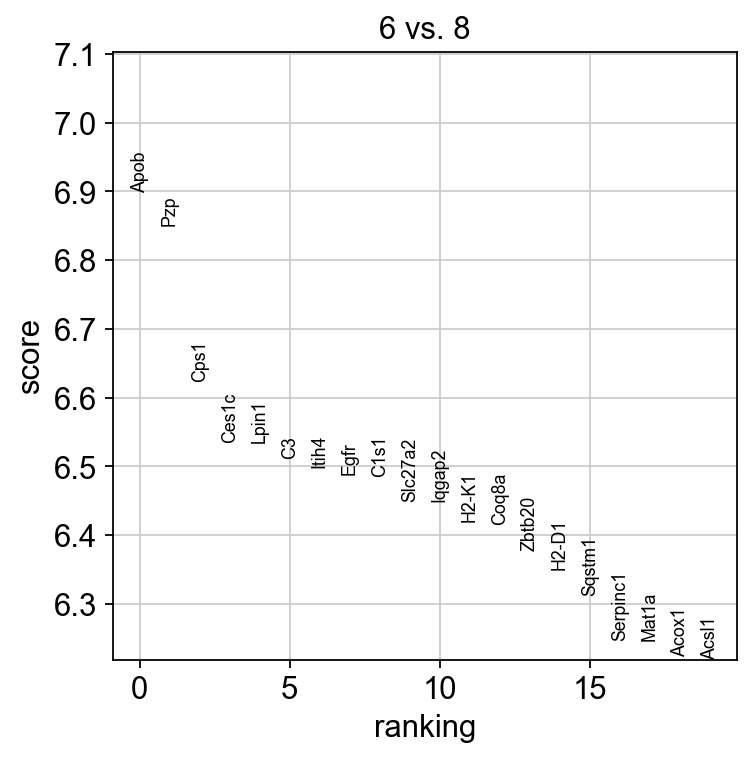

In [130]:
sc.tl.rank_genes_groups(liver_ss3, 'leiden', groups=['6'], reference='8', method='wilcoxon')
sc.pl.rank_genes_groups(liver_ss3, groups=['6'], n_genes=20)

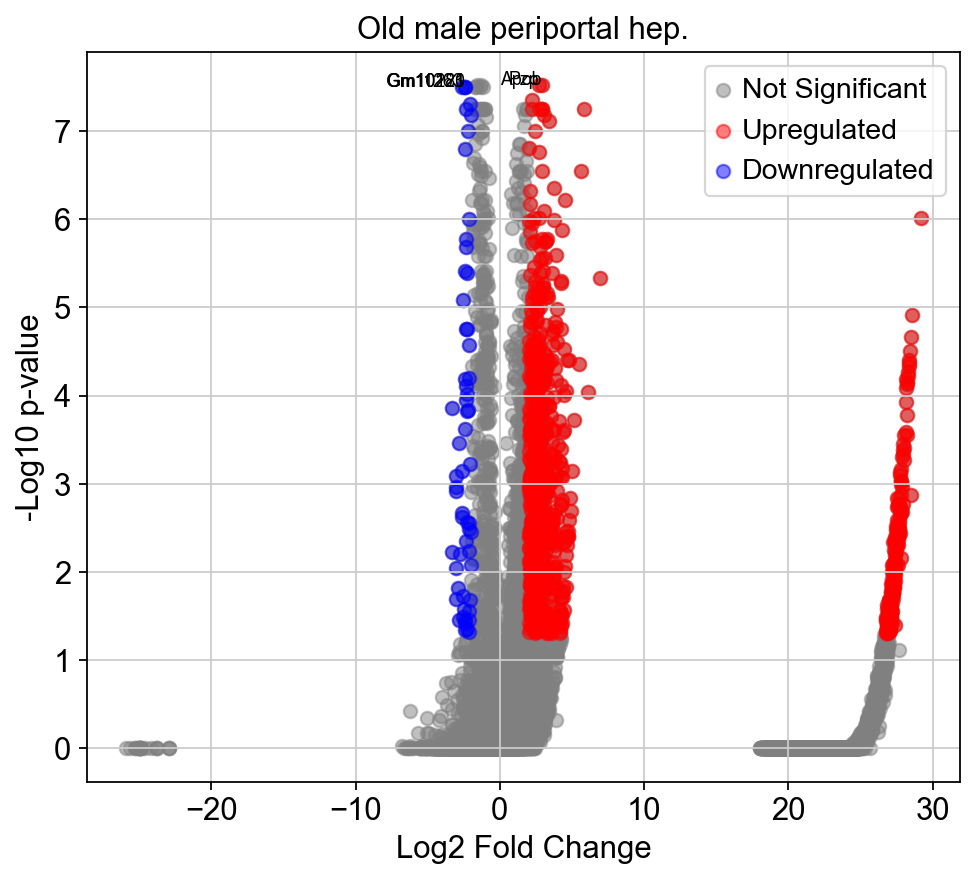

In [131]:
sc.tl.rank_genes_groups(liver_ss3, 'leiden', groups=['6'], reference='8', method='wilcoxon')
mop_res = liver_ss3.uns['rank_genes_groups']
groups = mop_res['names'].dtype.names
mop_degs = pd.DataFrame(
    {group + '_' + key: mop_res[key][group]
    for group in groups for key in ['names','scores', 'pvals','pvals_adj','logfoldchanges']})
mop_degs
padj_threshold = 0.05
logfc_threshold = 2

significant_genes = mop_degs[(mop_degs['6_pvals_adj'] < padj_threshold) & (mop_degs['6_logfoldchanges'].abs() > logfc_threshold)]

upregulated_genes = significant_genes[significant_genes['6_logfoldchanges'] > logfc_threshold]
downregulated_genes = significant_genes[significant_genes['6_logfoldchanges'] < -logfc_threshold]
top_genes = significant_genes.sort_values(by='6_pvals_adj').head(5)
plt.figure(figsize=(7, 6))
plt.scatter(mop_degs['6_logfoldchanges'], -np.log10(mop_degs['6_pvals_adj']), c='grey', alpha=0.5, label='Not Significant')
plt.scatter(upregulated_genes['6_logfoldchanges'], -np.log10(upregulated_genes['6_pvals_adj']), c='red', alpha=0.5, label='Upregulated')
plt.scatter(downregulated_genes['6_logfoldchanges'], -np.log10(downregulated_genes['6_pvals_adj']), c='blue', alpha=0.5, label='Downregulated')
for i in top_genes.index:
    texts.append(
        plt.text(top_genes.at[i, '6_logfoldchanges'], -np.log10(top_genes.at[i, '6_pvals_adj']),
                 top_genes.at[i, '6_names'], fontsize=8, ha='right')
    )

plt.xlabel('Log2 Fold Change')
plt.ylabel('-Log10 p-value')
plt.title('Old male periportal hep.')
plt.legend()
plt.show()

In [132]:
results = liver_ss3.uns['rank_genes_groups']
groups = results['names'].dtype.names
pvals_adj = results['pvals_adj']

In [133]:
names = results['names']['6']
logfoldchanges = results['logfoldchanges']['6']
pvals = pvals_adj['6']
mean_expression = liver_ss3.raw[:, results['names']['6']].X.mean(axis=0)
mean_expression = np.array(mean_expression).flatten()
top_n = 10
top_genes = np.argsort(pvals)[:top_n]

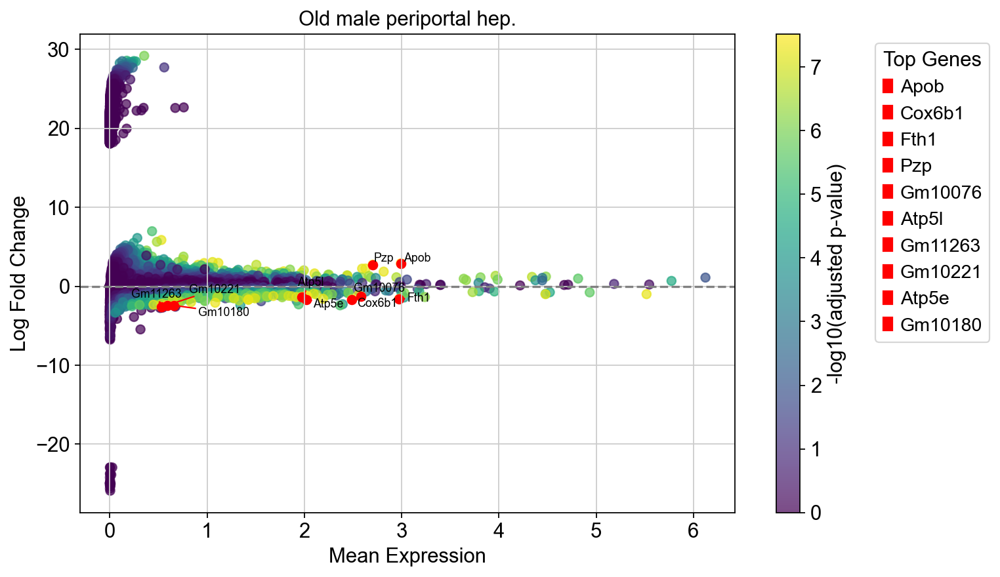

In [134]:
plt.figure(figsize=(10, 6))
plt.scatter(mean_expression, logfoldchanges, c=-np.log10(pvals), cmap='viridis', alpha=0.7)
plt.colorbar(label='-log10(adjusted p-value)')
plt.axhline(0, color='grey', linestyle='--')
plt.xlabel('Mean Expression')
plt.ylabel('Log Fold Change')
plt.title('Old male periportal hep.')
texts = []
for i in top_genes:
    gene_name = liver_ss3.uns['rank_genes_groups']['names']['6'][i]
    plt.scatter(mean_expression[i], logfoldchanges[i], color='red')
    texts.append(plt.text(mean_expression[i], logfoldchanges[i], gene_name, fontsize=8))

adjust_text(texts, arrowprops=dict(arrowstyle='->', color='red'))

handles = [mpatches.Patch(color='red', label=liver_ss3.uns['rank_genes_groups']['names']['6'][i]) for i in top_genes]
plt.legend(handles=handles, title='Top Genes', bbox_to_anchor=(1.2, 1), loc='upper left')

plt.show()

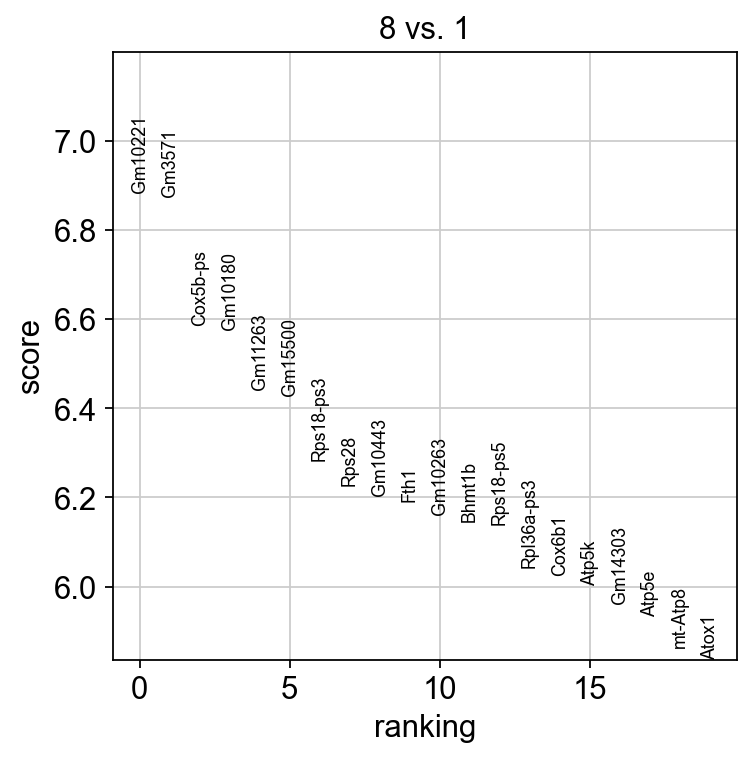

In [135]:
sc.tl.rank_genes_groups(liver_ss3, 'leiden', groups=['8'], reference='1', method='wilcoxon')
sc.pl.rank_genes_groups(liver_ss3, groups=['8'], n_genes=20)

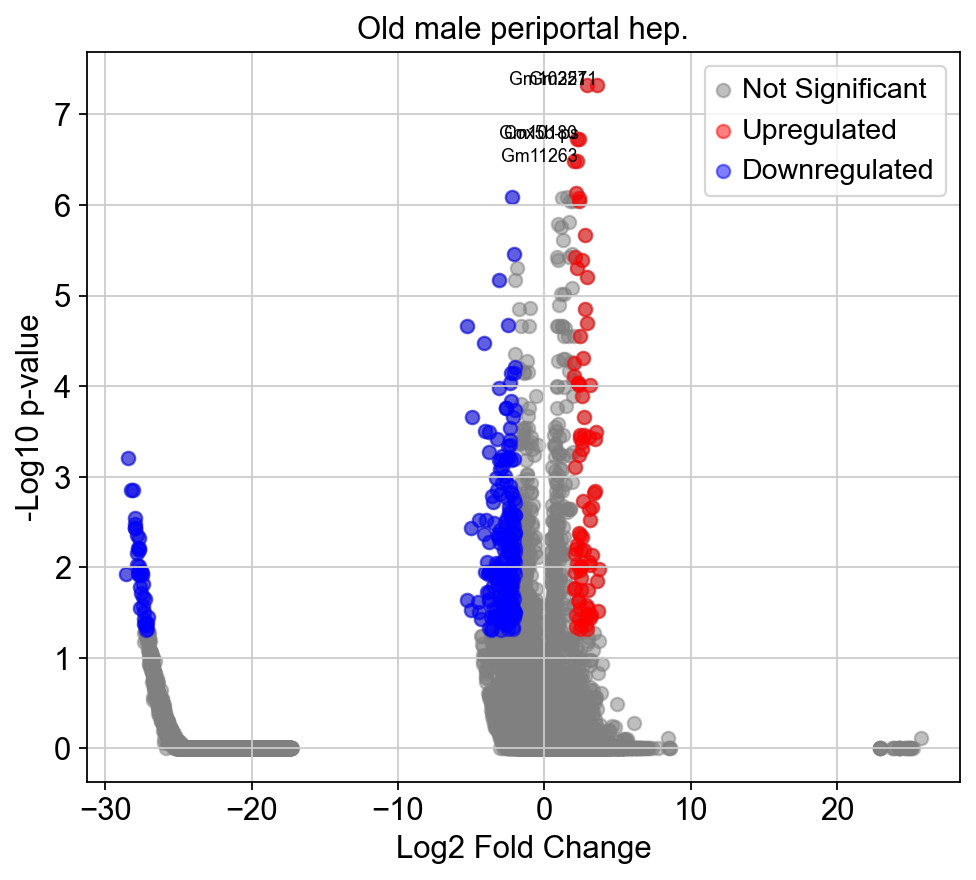

In [136]:
sc.tl.rank_genes_groups(liver_ss3, 'leiden', groups=['8'], reference='1', method='wilcoxon')
mop_res = liver_ss3.uns['rank_genes_groups']
groups = mop_res['names'].dtype.names
mop_degs = pd.DataFrame(
    {group + '_' + key: mop_res[key][group]
    for group in groups for key in ['names','scores', 'pvals','pvals_adj','logfoldchanges']})
mop_degs
padj_threshold = 0.05
logfc_threshold = 2

significant_genes = mop_degs[(mop_degs['8_pvals_adj'] < padj_threshold) & (mop_degs['8_logfoldchanges'].abs() > logfc_threshold)]

upregulated_genes = significant_genes[significant_genes['8_logfoldchanges'] > logfc_threshold]
downregulated_genes = significant_genes[significant_genes['8_logfoldchanges'] < -logfc_threshold]
top_genes = significant_genes.sort_values(by='8_pvals_adj').head(5)
plt.figure(figsize=(7, 6))
plt.scatter(mop_degs['8_logfoldchanges'], -np.log10(mop_degs['8_pvals_adj']), c='grey', alpha=0.5, label='Not Significant')
plt.scatter(upregulated_genes['8_logfoldchanges'], -np.log10(upregulated_genes['8_pvals_adj']), c='red', alpha=0.5, label='Upregulated')
plt.scatter(downregulated_genes['8_logfoldchanges'], -np.log10(downregulated_genes['8_pvals_adj']), c='blue', alpha=0.5, label='Downregulated')
for i in top_genes.index:
    texts.append(
        plt.text(top_genes.at[i, '8_logfoldchanges'], -np.log10(top_genes.at[i, '8_pvals_adj']),
                 top_genes.at[i, '8_names'], fontsize=8, ha='right')
    )
plt.xlabel('Log2 Fold Change')
plt.ylabel('-Log10 p-value')
plt.title('Old male periportal hep.')
plt.legend()
plt.show()

In [137]:
results = liver_ss3.uns['rank_genes_groups']
groups = results['names'].dtype.names
pvals_adj = results['pvals_adj']

In [138]:
names = results['names']['8']
logfoldchanges = results['logfoldchanges']['8']
pvals = pvals_adj['8']
mean_expression = liver_ss3.raw[:, results['names']['8']].X.mean(axis=0)
mean_expression = np.array(mean_expression).flatten()
top_n = 10
top_genes = np.argsort(pvals)[:top_n]

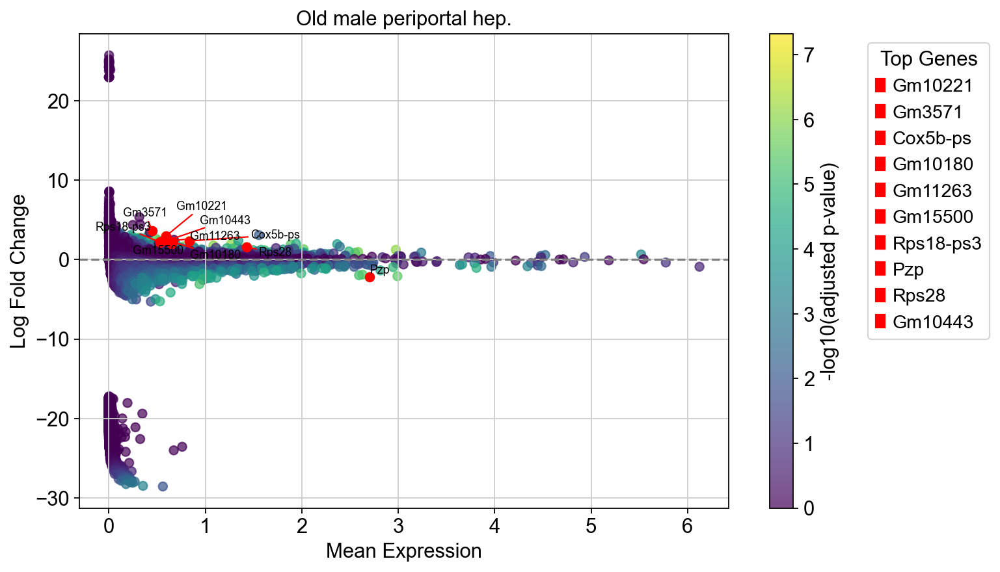

In [139]:
import matplotlib.patches as mpatches

plt.figure(figsize=(10, 6))
plt.scatter(mean_expression, logfoldchanges, c=-np.log10(pvals), cmap='viridis', alpha=0.7)
plt.colorbar(label='-log10(adjusted p-value)')
plt.axhline(0, color='grey', linestyle='--')
plt.xlabel('Mean Expression')
plt.ylabel('Log Fold Change')
plt.title('Old male periportal hep.')
texts = []
for i in top_genes:
    gene_name = liver_ss3.uns['rank_genes_groups']['names']['8'][i]
    plt.scatter(mean_expression[i], logfoldchanges[i], color='red')
    texts.append(plt.text(mean_expression[i], logfoldchanges[i], gene_name, fontsize=8))

adjust_text(texts, arrowprops=dict(arrowstyle='->', color='red'))

handles = [mpatches.Patch(color='red', label=liver_ss3.uns['rank_genes_groups']['names']['8'][i]) for i in top_genes]
plt.legend(handles=handles, title='Top Genes', bbox_to_anchor=(1.2, 1), loc='upper left')

plt.show()

## Here the analysis ends 

# Violin plot - shows the distribution of genes in different clusters

### the first 2 plots are for the presentation - more representative 

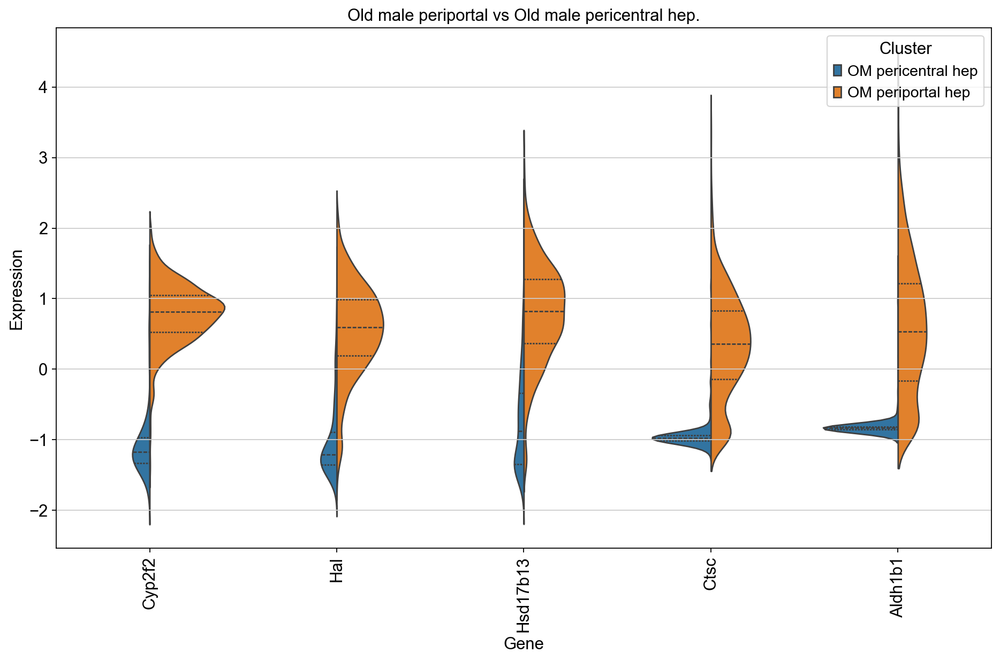

In [140]:
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt

def create_violin_plot(ad, clusters_1, clusters_2, title, top_n=5):
    group_key = 'CV & PV' 
    ad_sub = ad[ad.obs[group_key].isin(clusters_1 + clusters_2)]
    
    sc.tl.rank_genes_groups(ad_sub, groupby=group_key, method='wilcoxon')

    all_genes = []
    for cluster in clusters_1:
        all_genes.extend(ad_sub.uns['rank_genes_groups']['names'][cluster])
    valid_genes = [gene for gene in all_genes if gene in ad_sub.var_names][:top_n]

    top_gene_expression = ad_sub[:, valid_genes].to_df()
    top_gene_expression['Cluster'] = ad_sub.obs[group_key]

    melted_df = top_gene_expression.melt(id_vars='Cluster', var_name='Gene', value_name='Expression')

    plt.figure(figsize=(14, 8))
    sns.violinplot(x='Gene', y='Expression', hue='Cluster', data=melted_df, split=True, inner='quartile')
    plt.title(title)
    plt.xticks(rotation=90)
    plt.legend(title='Cluster')
    plt.show()

create_violin_plot(liver_ss3, ['OM periportal hep'], ['OM pericentral hep'], "Old male periportal vs Old male pericentral hep.")


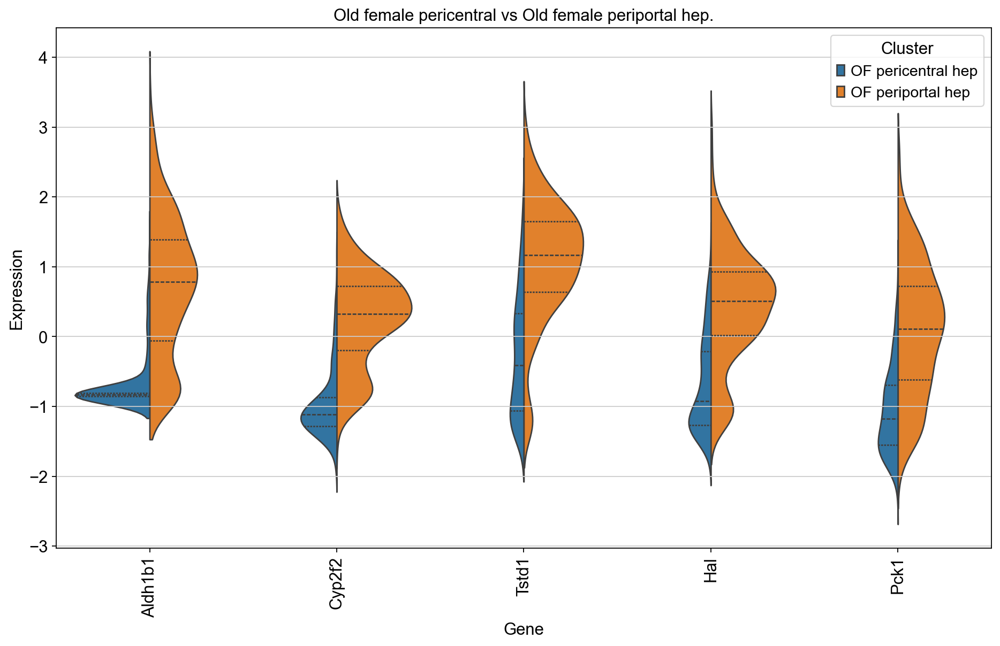

In [141]:
create_violin_plot(liver_ss3, ['OF periportal hep'], ['OF pericentral hep'], "Old female pericentral vs Old female periportal hep.")

### here I use leiden column to plot the violin plots, for each individual cluster

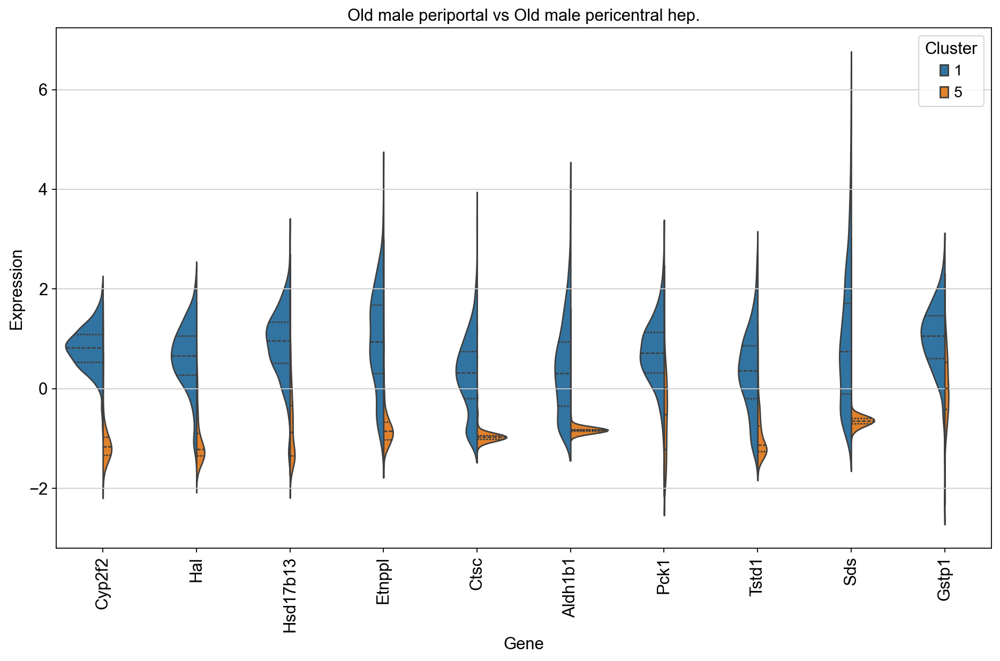

In [142]:
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

sc.tl.rank_genes_groups(liver_ss3, groupby='leiden', method='wilcoxon')

def create_violin_plot(ad, clusters_1, clusters_2, title, top_n=10):
    group_key = 'leiden'
    ad_sub = ad[ad.obs[group_key].isin(clusters_1 + clusters_2)]

    sc.tl.rank_genes_groups(ad_sub, groupby=group_key, method='wilcoxon')

    all_genes = []
    for cluster in clusters_1:
        all_genes.extend(ad_sub.uns['rank_genes_groups']['names'][cluster])
    valid_genes = [gene for gene in all_genes if gene in ad_sub.var_names][:top_n]

    top_gene_expression = ad_sub[:, valid_genes].to_df()
    top_gene_expression['Cluster'] = ad_sub.obs['leiden']

    melted_df = top_gene_expression.melt(id_vars='Cluster', var_name='Gene', value_name='Expression')

    plt.figure(figsize=(14, 8))
    sns.violinplot(x='Gene', y='Expression', hue='Cluster', data=melted_df, split=True, inner='quartile')
    plt.title(title)
    plt.xticks(rotation=90)
    plt.legend(title='Cluster')
    plt.show()

create_violin_plot(liver_ss3, ['1'], ['5'], "Old male periportal vs Old male pericentral hep.")


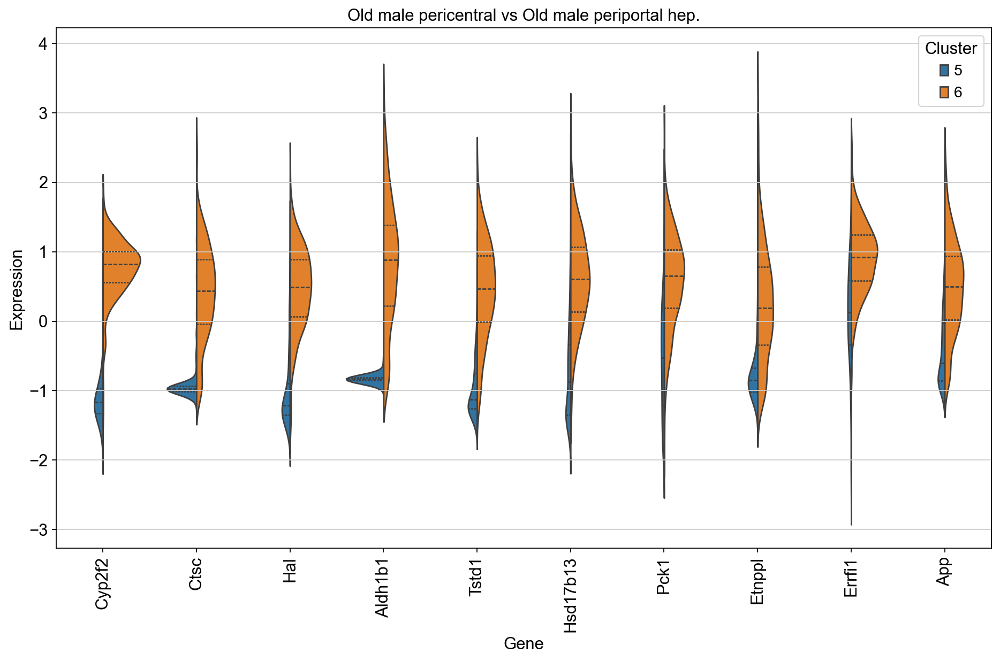

In [143]:
create_violin_plot(liver_ss3, ['6'], ['5'], "Old male pericentral vs Old male periportal hep.")

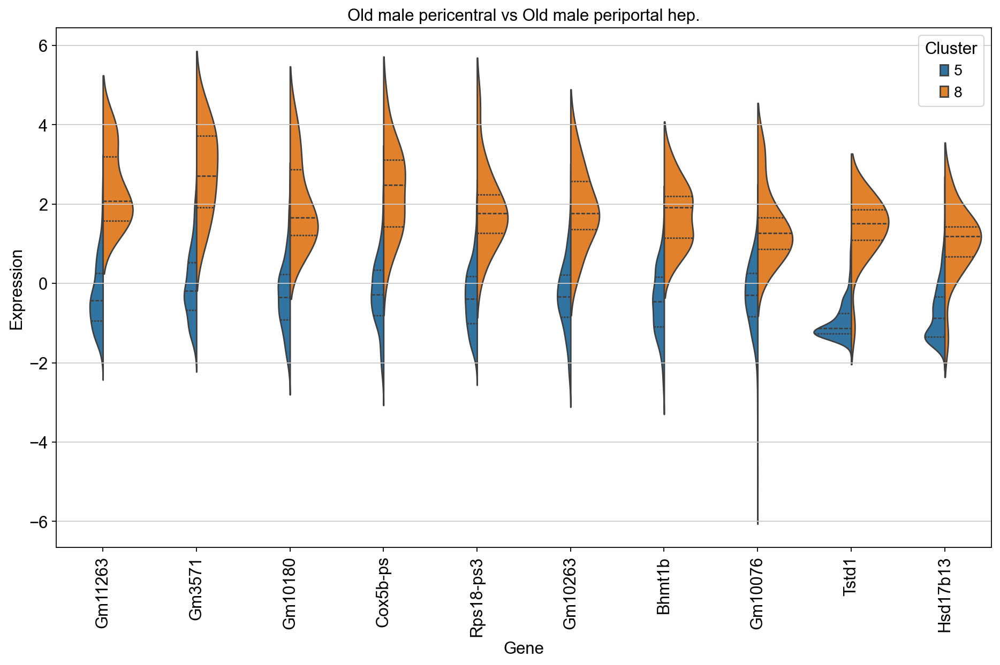

In [144]:
create_violin_plot(liver_ss3, ['8'], ['5'], "Old male pericentral vs Old male periportal hep.")

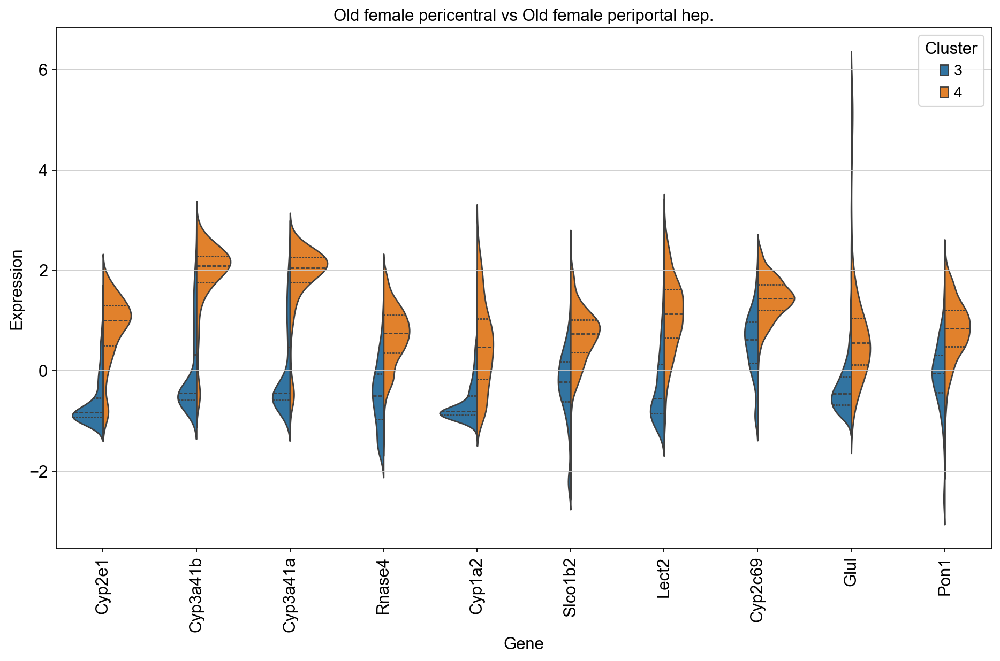

In [145]:
create_violin_plot(liver_ss3, ['4'], ['3'], "Old female pericentral vs Old female periportal hep.")

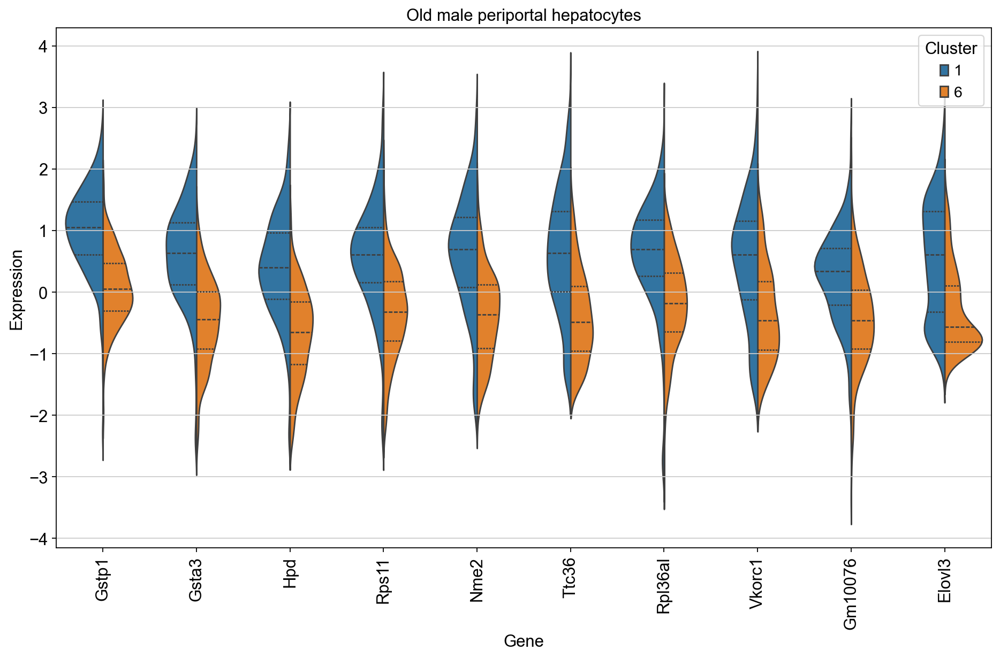

In [146]:
create_violin_plot(liver_ss3, ['1'], ['6'], "Old male periportal hepatocytes")

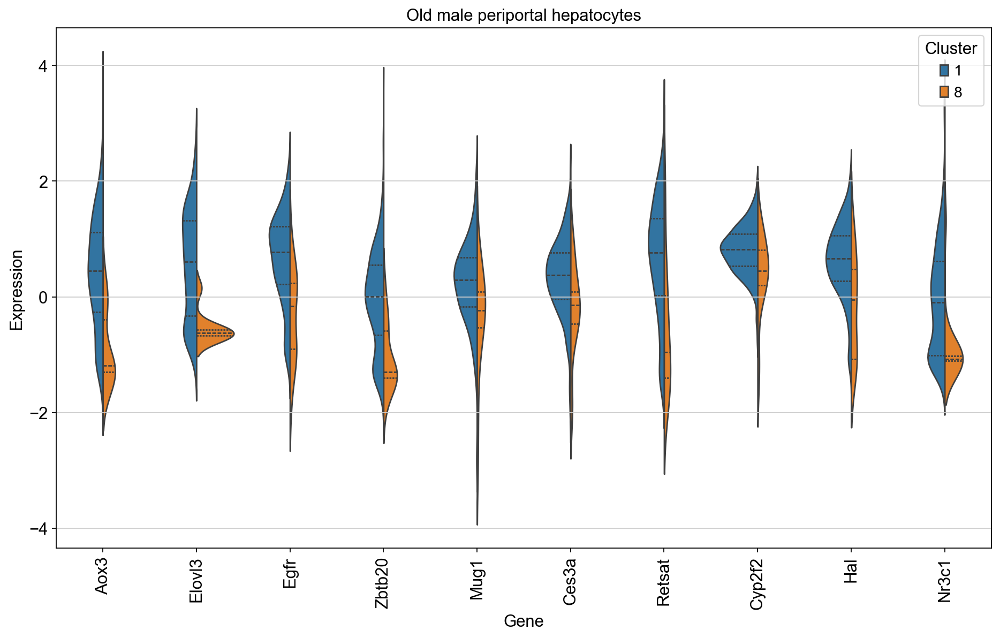

In [147]:
create_violin_plot(liver_ss3, ['1'], ['8'], "Old male periportal hepatocytes")

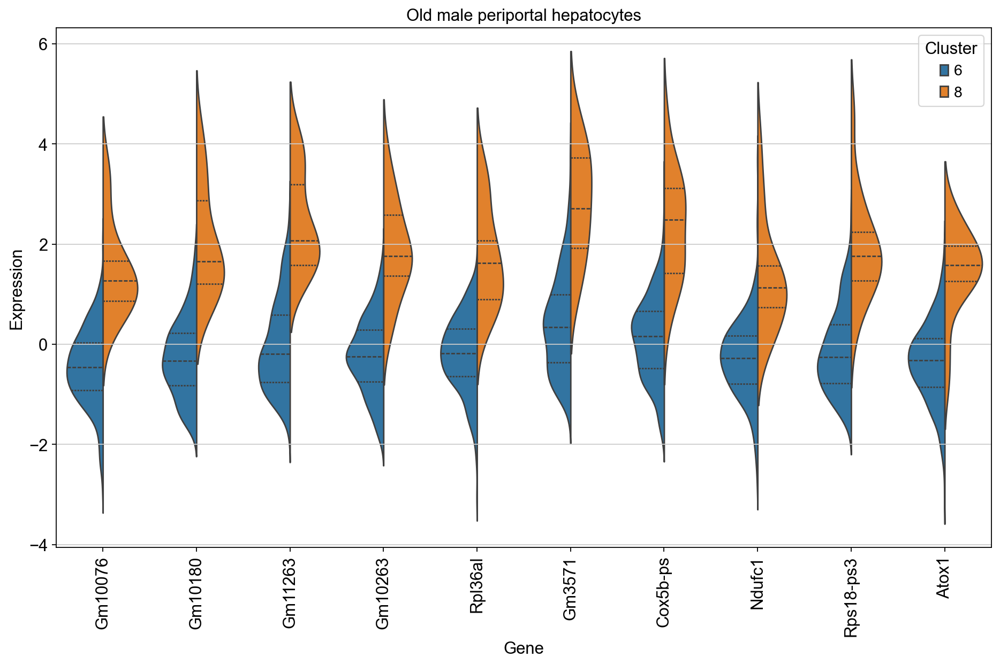

In [148]:
create_violin_plot(liver_ss3, ['8'], ['6'], "Old male periportal hepatocytes")

# Functional Enrichment Analysis

### Analyse old male pericentral hepatocytes against old male periportal hepatocytes

In [149]:
import pandas as pd
import enrichrpy
import enrichrpy.enrichr as een
import enrichrpy.plotting as epl
import gseapy as gp
from gseapy import barplot, dotplot
import plotly.express as px

In [284]:
sc.tl.rank_genes_groups(liver_ss3, 'CV & PV', groups=['OM periportal hep'], reference='OM pericentral hep', method='wilcoxon', use_raw=True)
mop_res = liver_ss3.uns['rank_genes_groups']
groups = mop_res['names'].dtype.names
mop_degs = pd.DataFrame(
    {group + '_' + key: mop_res[key][group]
    for group in groups for key in ['names','scores', 'pvals','pvals_adj','logfoldchanges']})

logfc_threshold = 1

significant_genes = mop_degs[mop_degs['OM periportal hep_logfoldchanges'].abs() > logfc_threshold]

upregulated_genes = significant_genes[significant_genes['OM periportal hep_logfoldchanges'] > logfc_threshold]
downregulated_genes = significant_genes[significant_genes['OM periportal hep_logfoldchanges'] < -logfc_threshold]

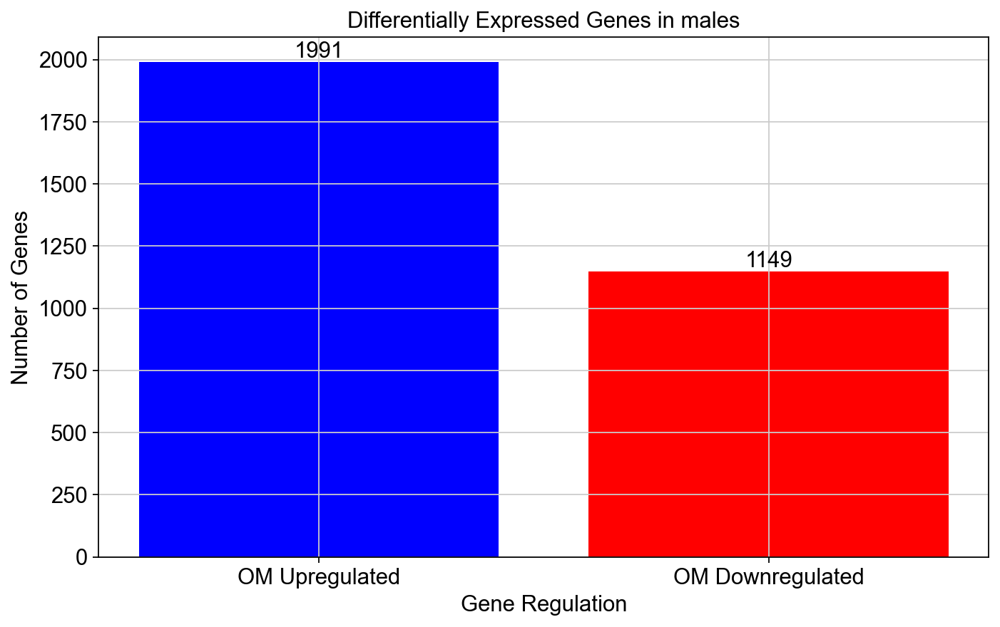

In [285]:
plt.figure(figsize=(10, 6))
bars = plt.bar(['OM Upregulated', 'OM Downregulated'], [len(upregulated_genes), len(downregulated_genes)], color=['blue', 'red'])
plt.xlabel('Gene Regulation')
plt.ylabel('Number of Genes')
plt.title('Differentially Expressed Genes in males')
plt.bar_label(bars)
plt.show()

In [286]:
upregulated_genes = significant_genes[significant_genes['OM periportal hep_logfoldchanges'] > logfc_threshold]['OM periportal hep_names'].tolist()
downregulated_genes = significant_genes[significant_genes['OM periportal hep_logfoldchanges'] < -logfc_threshold]['OM periportal hep_names'].tolist()

In [219]:
for gene in upregulated_genes:
    print(gene)

Cyp2f2
Rida
Hal
Hsd17b13
Ctsc
Aldh1b1
Tstd1
Gls2
Etnppl
Pck1
Fbp1
Serpina1e
Cryl1
Sds
Arg1
Ass1
Hpx
Sfxn1
Got1
Bdh2
Gldc
Mup-ps19
Gas2
Pigr
Mup20
Amdhd1
Gm32461
Slc7a2
G6pc
Esr1
Uroc1
Mt1
Nnmt
Apoa4
App
Sdc1
Noct
Hsd17b6
Slc39a4
Tm4sf4
Cps1
Wfdc2
Fgfr2
Gm5424
Sdsl
Slc25a51
Mmd2
Cyp2u1
Gm4956
Mfsd2a
Arsg
Nipal1
Abhd2
Sox9
Ak4
Plxna2
Cyp17a1
Gm30262
Sulf2
B4galt5
Slc3a1
Olfm3
Dpy19l3
Crp
Slc41a2
Fst
Hamp
Tceal9
Wsb1
Sult5a1
Gm8893
Wfdc15b
Gsta1
Rasgef1b
Zap70
Hes1
Fam124a
Prelid2
Defb1
Aqp4
Nat8f7
Cxcl1
Farp1
Ctnnbip1
Mafb
Gm44787
Tmc5
Gm12718
Gm3776
Plxnb1
Nat8b-ps
Tle4
Arl4d
Junb
Atp2b2
Slc22a7
Gm12715
Gm47544
Saa1
Gng11
Btg2
Ppl
Car14
Foxq1
Rpp40
Ptcd1
Reck
Il6ra
Cecr2
Gm5331
Gm30842
Gm35696
Celsr1
Gsto1
Cpd
AI463229
Slc16a5
Vamp5
Gm32202
Chrm3
Eppk1
Gm16573
Sall1
Gnat1
Ggact
Gm5940
Glra3
Sdcbp
Grm8
Gm12909
Gm38832
Hapln4
Crym
D630033O11Rik
Yae1d1
Mapt
1810064F22Rik
Gm40787
Gvin2
Galns
Dsg1c
Gypc
Gm19619
Rbp1
Gss
Hectd2
Cyp39a1
Tead1
Nrg4
Col27a1
Tent5a
Serpinb8
Kcnk10
Gm56568
Ncam2
I

In [220]:
for gene in downregulated_genes:
    print(gene)

Rbms3
Gm57003
Gm6787
Slc35b4
Cct3-ps1
Gm57012
Gm43549
Gm56655
Spry2
Tssc4
4930449E18Rik
Car11
Gm16559
Potegl
Hmgxb4
Gm32655
Gm11405
Gm17748
Cenph
Gm46344
Gm5430
1700030J22Rik
Skida1
Hbb-bs
Tpcn2
Gm37670
Clec4g
Gm47683
Gm32569
Gm5628
Gm43684
Slc1a5
Cdkn3
Slc25a53
Erg
Gm15622
Gm33799
Cdr2l
Gm7565
Xkr6
Gna12
Gm38250
Gm9514
Col11a2
Mxd3
Osbp2
Gm9442
Rgs2
Gm56851
Aox2
Gm8618
Gm12031
Sh3d21
Serpinb6b
Adcy6
Gm34091
Rab40b
Mrc1
Exoc3l4
Des
Mylip
Gm49607
Gm7085
B4galt6
Npr1
Gm7457
Plekhg1
Gm11839
Clec7a
Dpep1
Trpv2
Esam
Aqp1
H2ac23
9130230L23Rik
Sult2a3
Adgrl4
4933439C10Rik
Gm8724
1700030C14Rik
Elfn2
Serpinh1
Gm30934
Pde6c
Col13a1
Icam2
ENSMUSG00000121456
Cdh5
Cela2a
Ckap2
Gm45422
Stab1
Rnasel
ENSMUSG00000121485
Chst15
Sema3f
Gm48338
BC048671
Fgd5
Crip1
Gm5305
Tyrobp
H2-Eb1
Ntn4
Col5a1
A930017M01Rik
D17H6S56E-5
Hoxb4
Chpf2
Gm50420
Oscp1
Donson
Omd
Gm34655
Gm18113
Ccdc89
Gm16380
Akr1b7
Fxyd7
Gm5380
Gm16581
Gm8920
Gm13160
BC065403
Cenpp
A730036I17Rik
AA914427
Gm44117
Gm22360
Tek
H2al1k
Gramd1b
Zf

In [153]:
#male_up_enrichment = gp.enrichr(gene_list = upregulated_genes, gene_sets = 'GO_Biological_Process_2021' , organism = 'Mouse')

In [287]:
male_up_enrichment = gp.enrichr(gene_list = upregulated_genes, gene_sets = 'KEGG_2021_Human', organism = 'Mouse')

In [288]:
male_up_enrichment_df = pd.DataFrame(male_up_enrichment.results)
male_up_enrichment_20 = male_up_enrichment_df.head(20)
male_up_enrichment_20

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,KEGG_2021_Human,Arginine biosynthesis,6/22,0.017786,0.999996,0,0,3.399181,13.696522,GOT1;CPS1;ARG1;GLS2;ASS1;GLS
1,KEGG_2021_Human,Malaria,9/50,0.056297,0.999996,0,0,1.990008,5.725490,KLRK1;TGFB1;VCAM1;GYPC;HGF;CCL2;SDC1;ITGAL;TLR2
2,KEGG_2021_Human,Histidine metabolism,5/22,0.061046,0.999996,0,0,2.664534,7.450380,HAL;ALDH1B1;UROC1;AMDHD1;ALDH3B1
3,KEGG_2021_Human,D-Glutamine and D-glutamate metabolism,2/5,0.080783,0.999996,0,0,6.035194,15.184504,GLS2;GLS
4,KEGG_2021_Human,Arrhythmogenic right ventricular cardiomyopathy,11/77,0.140628,0.999996,0,0,1.510354,2.962761,CACNB1;SLC8A3;TCF7L1;SGCB;LAMA1;ITGA2;ITGA7;IT...
5,KEGG_2021_Human,Protein digestion and absorption,14/103,0.142680,0.999996,0,0,1.425835,2.776313,COL16A1;COL27A1;COL14A1;COL25A1;SLC3A1;SLC8A1;...
6,KEGG_2021_Human,Thiamine metabolism,3/15,0.182270,0.999996,0,0,2.263204,3.852577,THTPA;AK4;AK7
7,KEGG_2021_Human,Proximal tubule bicarbonate reclamation,4/23,0.190485,0.999996,0,0,1.906074,3.160617,GLS2;PCK1;GLS;PCK2
8,KEGG_2021_Human,AGE-RAGE signaling pathway in diabetic complic...,13/100,0.193340,0.999996,0,0,1.353893,2.224860,TGFB1;VCAM1;CYBB;PIK3CD;MAPK12;COL1A1;THBD;COL...
9,KEGG_2021_Human,Amoebiasis,13/102,0.213040,0.999996,0,0,1.323321,2.046220,TGFB1;ARG1;LAMA1;LAMB2;PIK3CD;CXCL1;COL1A1;COL...


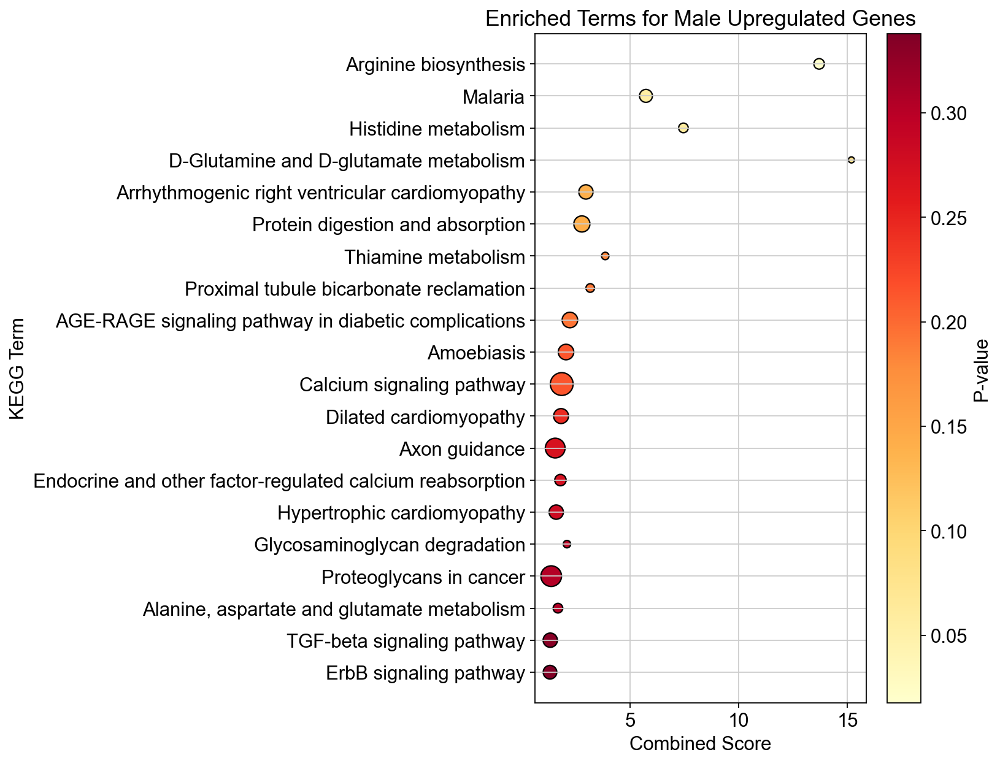

In [289]:
male_up_enrichment_20['Count'] = [int(x.split('/')[0]) for x in male_up_enrichment_20['Overlap']]
male_up_enrichment_20['dot_size'] = male_up_enrichment_20['Count'] * 10
plt.figure(figsize=(10, 8))
scatter = plt.scatter(male_up_enrichment_20['Combined Score'], male_up_enrichment_20['Term'], 
                      s=male_up_enrichment_20['dot_size'], c=male_up_enrichment_20['P-value'], cmap='YlOrRd', edgecolor='black')
plt.xlabel('Combined Score', fontsize=14)
plt.ylabel('KEGG Term', fontsize=14)
plt.title('Enriched Terms for Male Upregulated Genes', fontsize=16)
plt.colorbar(scatter, label='P-value')
handles, labels = scatter.legend_elements(prop="sizes", alpha=0.6)
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

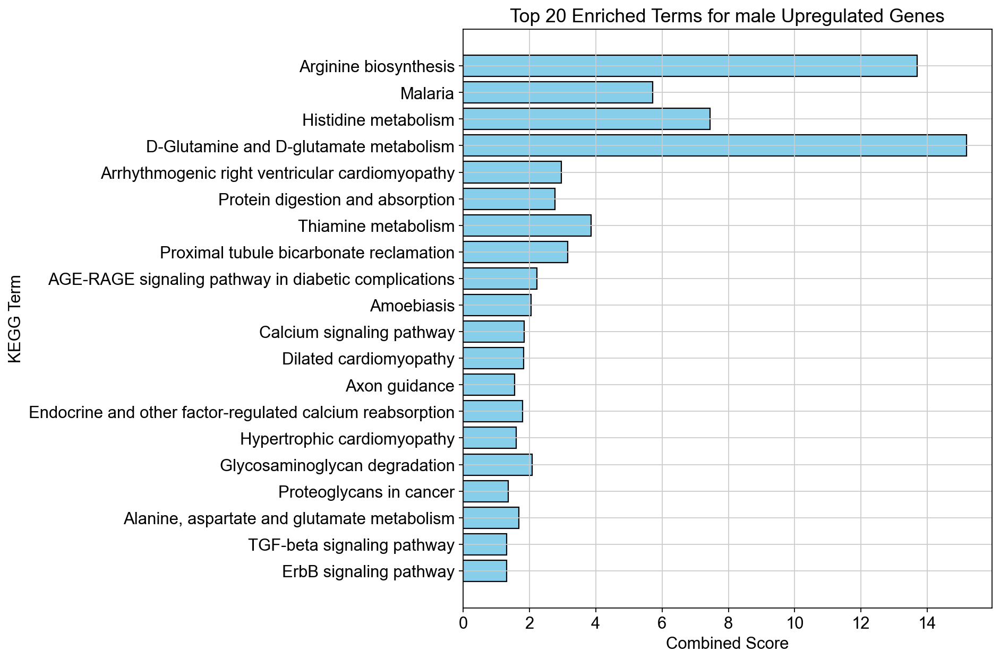

In [213]:
plt.figure(figsize=(12, 8))
bars = plt.barh(male_up_enrichment_20['Term'], male_up_enrichment_20['Combined Score'], 
                color='skyblue', edgecolor='black')

plt.xlabel('Combined Score', fontsize=14)
plt.ylabel('KEGG Term', fontsize=14)
plt.title('Top 20 Enriched Terms for male Upregulated Genes', fontsize=16)

plt.gca().invert_yaxis()

plt.tight_layout()
plt.show()

In [214]:
male_down_enrichment = gp.enrichr(gene_list = downregulated_genes, gene_sets = 'KEGG_2021_Human' , organism = 'Mouse')

In [215]:
male_down_enrichment_df = pd.DataFrame(male_down_enrichment.results)
male_down_enrichment_20 = male_down_enrichment_df.head(20)
male_down_enrichment_20

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,KEGG_2021_Human,Cholesterol metabolism,8/50,0.007222,0.999996,0,0,3.139936,15.481694,CYP27A1;MYLIP;LRPAP1;SORT1;LPL;LRP2;CYP7A1;PLTP
1,KEGG_2021_Human,Regulation of lipolysis in adipocytes,7/55,0.037134,0.999996,0,0,2.401142,7.907495,LIPE;NPR1;PRKG2;PLAAT3;ADRB2;ADCY6;GNAI1
2,KEGG_2021_Human,Renin secretion,8/69,0.043585,0.999996,0,0,2.159739,6.766530,GUCY1A1;NPR1;PRKG2;CALML4;ADRB2;ADCY6;GNAI1;AQP1
3,KEGG_2021_Human,Primary bile acid biosynthesis,3/17,0.070411,0.999996,0,0,3.522251,9.345937,CYP27A1;CYP7B1;CYP7A1
4,KEGG_2021_Human,Protein digestion and absorption,10/103,0.071830,0.999996,0,0,1.770842,4.663421,SLC6A19;CELA2A;COL13A1;COL5A1;CTRL;COL4A1;COL1...
5,KEGG_2021_Human,Synaptic vesicle cycle,8/78,0.078554,0.999996,0,0,1.881157,4.785606,UNC13B;STX1B;SYT1;SLC1A2;ATP6V0E2;SLC18A1;ATP6...
6,KEGG_2021_Human,Linoleic acid metabolism,4/29,0.082194,0.999996,0,0,2.630707,6.573271,PLA2G4F;CYP1A2;PLAAT3;CYP2E1
7,KEGG_2021_Human,Hedgehog signaling pathway,6/56,0.100949,0.999996,0,0,1.973858,4.526338,SHH;CCND2;CCND1;GPR161;IHH;LRP2
8,KEGG_2021_Human,Glutathione metabolism,6/57,0.107662,0.999996,0,0,1.935052,4.312769,GSTM3;GSTM2;GSTM1;RRM2B;GPX3;GPX6
9,KEGG_2021_Human,Pyruvate metabolism,5/47,0.131045,0.999996,0,0,1.957314,3.977675,ALDH3A2;ME1;ACYP2;DLAT;ME2


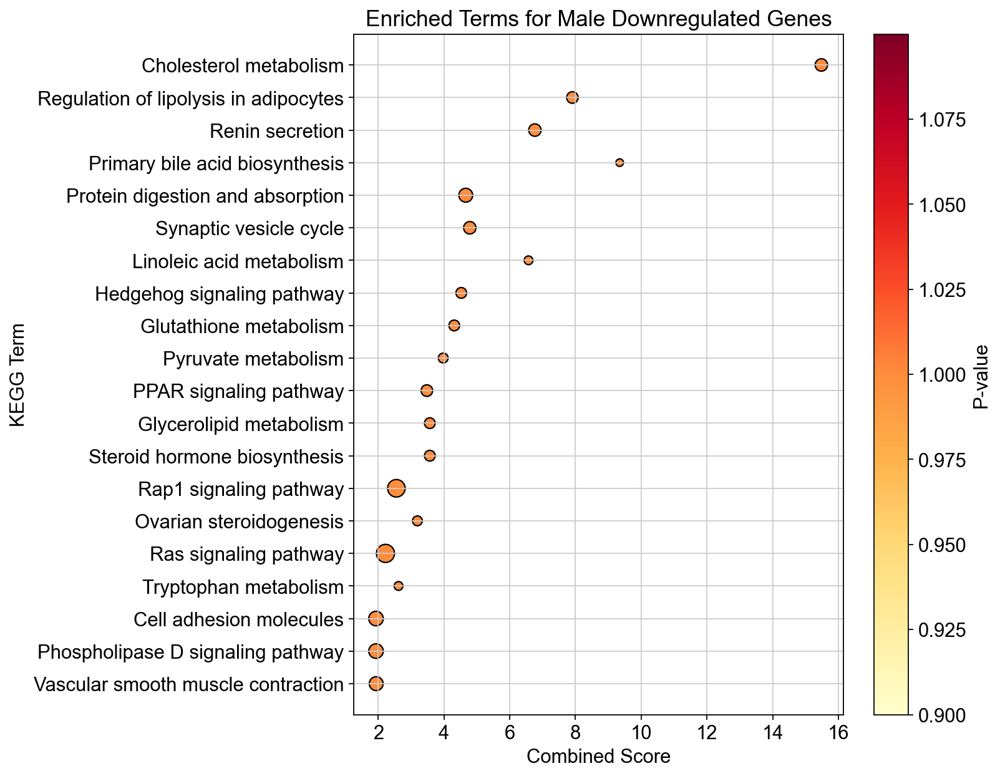

In [216]:
male_down_enrichment_20['Count'] = [int(x.split('/')[0]) for x in male_down_enrichment_20['Overlap']]
male_down_enrichment_20['dot_size'] = male_down_enrichment_20['Count'] * 10
plt.figure(figsize=(10, 8))
scatter = plt.scatter(male_down_enrichment_20['Combined Score'], male_down_enrichment_20['Term'], 
                      s=male_down_enrichment_20['dot_size'], c=male_down_enrichment_20['Adjusted P-value'], cmap='YlOrRd', edgecolor='black')
plt.xlabel('Combined Score', fontsize=14)
plt.ylabel('KEGG Term', fontsize=14)
plt.title('Enriched Terms for Male Downregulated Genes', fontsize=16)
plt.colorbar(scatter, label='P-value')
handles, labels = scatter.legend_elements(prop="sizes", alpha=0.6)
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

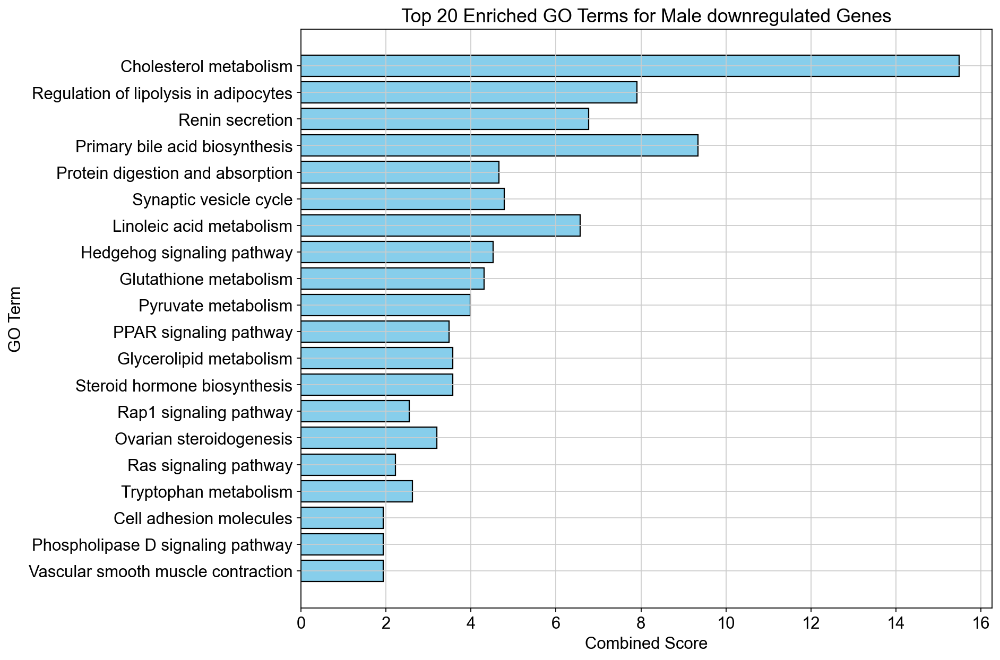

In [217]:
plt.figure(figsize=(12, 8))
bars = plt.barh(male_down_enrichment_20['Term'], male_down_enrichment_20['Combined Score'], 
                color='skyblue', edgecolor='black')

plt.xlabel('Combined Score', fontsize=14)
plt.ylabel('GO Term', fontsize=14)
plt.title('Top 20 Enriched GO Terms for Male downregulated Genes', fontsize=16)

plt.gca().invert_yaxis()

plt.tight_layout()
plt.show()

## Analyse old female pericentral hepatocytes against old female periportal hepatocytes

In [221]:
sc.tl.rank_genes_groups(liver_ss3, 'CV & PV', groups=['OF periportal hep'], reference='OF pericentral hep', method='wilcoxon', use_raw=True)
mop_res = liver_ss3.uns['rank_genes_groups']
groups = mop_res['names'].dtype.names
mop_degs = pd.DataFrame(
    {group + '_' + key: mop_res[key][group]
    for group in groups for key in ['names','scores', 'pvals','pvals_adj','logfoldchanges']})
#padj_threshold = 0.05
#logfc_threshold = 2

significant_genes = mop_degs[mop_degs['OF periportal hep_logfoldchanges'].abs() > logfc_threshold]

upregulated_genes = significant_genes[significant_genes['OF periportal hep_logfoldchanges'] > logfc_threshold]
downregulated_genes = significant_genes[significant_genes['OF periportal hep_logfoldchanges'] < -logfc_threshold]
upregulated_genes = significant_genes[significant_genes['OF periportal hep_logfoldchanges'] > logfc_threshold]['OF periportal hep_names'].tolist()
downregulated_genes = significant_genes[significant_genes['OF periportal hep_logfoldchanges'] < -logfc_threshold]['OF periportal hep_names'].tolist()


In [222]:
for gene in upregulated_genes:
    print(gene)

Rida
Aldh1b1
Cyp2f2
Tstd1
Mup3
Hal
Pck1
Hsd17b6
Sds
Hsd17b13
Serpina12
Etnppl
Mt1
Cryl1
Gm32461
Ctsc
Gls2
Bdh2
Gas2
Sfxn1
Gm44787
Nnmt
Mmd2
Fgfr2
Wfdc2
Wfdc15b
Mt2
Eci3
Fmo3
Sdsl
Noct
Slc39a4
Sulf2
Slc10a2
Defb1
Tcf24
Olfm3
Aqp4
Rbp1
Gm32202
Plxna2
Mup-ps19
Sult1e1
Sox9
Spp1
Lcn2
Saa1
Gm30842
Slc41a2
Gm3776
Ctnnbip1
Nid1
C8a
Gm39167
Reck
1810064F22Rik
Gsta1
Stambpl1
Dcaf12l1
Fam83a
Slc22a7
Slpi
Elapor1
Sult5a1
Spry4
Ctcflos
Nebl
AI463229
Dsg1c
Ptpre
Bmper
Dreh
Sox6os
Armcx3
Fam124a
Gm19619
Isg20
Scn8a
Cd63
Cxcl16
1810044K17Rik
Tbc1d4
Ncam2
Chrm3
Gm19497
Tagln2
Lncbate6
Krt23
Gm44751
Gm36185
Nox4
Gm6069
Ptgfr
Sh3bgrl3
Pard3b
Gm7551
Mfge8
Dpy19l3
Rab38
Pop1
Gm31522
Cyb561
Aarsd1
Lamb3
Mrgpre
4930459C07Rik
Pitpnm1
Slc51b
Nphp1
Gprc5b
Aimp2
Trhde
Grm8
Mapt
Saa2
Gm46546
Gm13166
6330562C20Rik
C530020B09Rik
Rasgef1b
Gm20498
Etv5
Jcad
Tmem107
Apoc2
Dhodh
Gsta5
Limch1
Setd7
Gm12602
Bnc2
Upp1
Gucy2c
A930036K24Rik
Asb2
0610043K17Rik
Odf3b
Gm22513
Atp5k-ps2
Arhgap10
Gm38537
Gm5160
Gm31583
Gm38388


In [223]:
for gene in downregulated_genes:
    print(gene)

Pcdh20
Gm5870
Colec10
Klhl31
Lum
Mtfr2
Mxra7
Whrn
Bgn
Smpd5
Gm4849
Gm13688
Trpv2
Bcam
Gm14608
Gm48551
Ctss
Gm43860
Gm49371
Lsmem2
Sertad4
Hbb-bt
Gm26571
Lpl
Cyp4f40
Spink1
Gm9385
Rpl21-ps15
Il20rb
Slc6a4
Gm49871
Csf1r
Bicc1
Pdgfrl
Calcrl
Trex1
Gm56507
Gm2676
Igfbp7
Psat1
Kcnab3
Golm1
Hba-a1
Gm7855
Ninl
Gm7353
Rnf122
Tubgcp6
Fam234b
Satb2
2310016G11Rik
Sox7
Gm9029
Arhgef6
Slc6a16
Gm5384
Cdr2
Gm14405
Hand2os1
Casp1
Col5a1
Postn
Gm22363
Syt9
Rasip1
Gngt2
Gimap6
Olfm1
Klhl6
Col16a1
Gm40685
Capn15
Tshz3
Cysltr1
Gm7085
Noxred1
Ctsk
Dab2
Kit
Gm43158
Or10j5
Rasl10b
Matcap1
Gm11798
Cdr2l
Uty
4833445I07Rik
Trps1
Lrrc75a
Rftn1
Gm43682
Gm5037
Gpr161
Gm43684
Tbx20
Wdr66
Gm56574
Ltbp1
Meig1
Sox11
Gm15327
Zfp599
Ckb
Pde11a
6820445E23Rik
Gm54981
Ramp2
Gm20656
Irak3
Lhx2
Cygb
Tssc4
Gm4972
Ccdc169
Gm38309
Gucy1a1
Col1a1
Gm11827
Cyba
Anxa3
Gm11889
Kdr
Cyb561a3
Procr
Rbm6-ps1
Hand2
Eid2
Lst1
Gm32717
Rpl21-ps3
Pmp22
Tmem147os-1
Rspo3
Ppp1r14a
Gm28055
Ccsap
Enpp6
Gm45629
Cers4
Acsm2
Bmp2
Arhgap30
Sema3f
Mrc

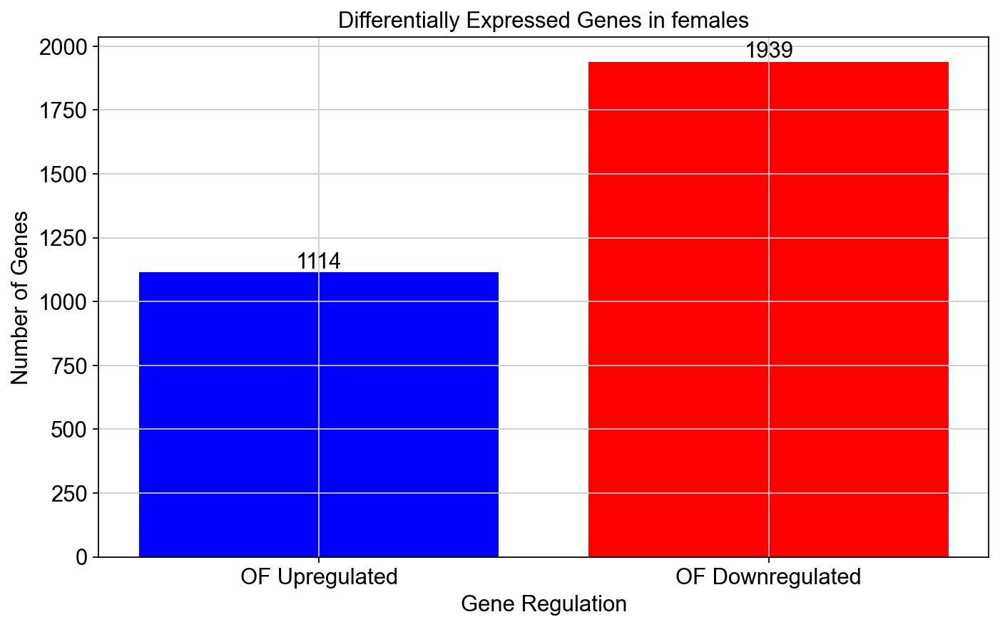

In [189]:
plt.figure(figsize=(10, 6))
bars = plt.bar(['OF Upregulated', 'OF Downregulated'], [len(upregulated_genes), len(downregulated_genes)], color=['blue', 'red'])
plt.xlabel('Gene Regulation')
plt.ylabel('Number of Genes')
plt.title('Differentially Expressed Genes in females')
plt.bar_label(bars)
plt.show()

In [190]:
female_up_enrichment = gp.enrichr(gene_list = upregulated_genes, gene_sets = 'KEGG_2021_Human' , organism = 'Mouse')

In [191]:
female_up_enrichment_df = pd.DataFrame(female_up_enrichment.results)
female_up_enrichment_20 = female_up_enrichment_df.head(20)
female_up_enrichment_20

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,KEGG_2021_Human,Histidine metabolism,3/22,0.120923,0.999996,0,0,2.681368,5.664658,HAL;ALDH1B1;HDC
1,KEGG_2021_Human,GnRH secretion,6/64,0.145063,0.999996,0,0,1.757874,3.393724,PLCB4;SPP1;PIK3CD;GNRH1;ARRB1;ITPR3
2,KEGG_2021_Human,Regulation of lipolysis in adipocytes,5/55,0.190562,0.999996,0,0,1.698467,2.815678,FABP4;PIK3CD;PRKG2;PRKG1;ADCY5
3,KEGG_2021_Human,Bladder cancer,4/41,0.192906,0.999996,0,0,1.835793,3.020889,RASSF1;CDH1;E2F2;HBEGF
4,KEGG_2021_Human,D-Glutamine and D-glutamate metabolism,1/5,0.249177,0.999996,0,0,4.241240,5.893587,GLS2
5,KEGG_2021_Human,Arrhythmogenic right ventricular cardiomyopathy,6/77,0.257762,0.999996,0,0,1.435018,1.945478,CACNB1;ITGB4;SGCB;ITGB3;ITGA2;ITGA10
6,KEGG_2021_Human,Dilated cardiomyopathy,7/96,0.286890,0.999996,0,0,1.335516,1.667598,CACNB1;ITGB4;SGCB;ITGB3;ITGA2;ITGA10;ADCY5
7,KEGG_2021_Human,One carbon pool by folate,2/20,0.307225,0.999996,0,0,1.885292,2.224972,MTHFD1L;MTHFD2
8,KEGG_2021_Human,Central carbon metabolism in cancer,5/70,0.350755,0.999996,0,0,1.305473,1.367700,PKM;GLS2;PIK3CD;FGFR2;FGFR1
9,KEGG_2021_Human,Primary immunodeficiency,3/38,0.355709,0.999996,0,0,1.454365,1.503295,JAK3;ADA;UNG


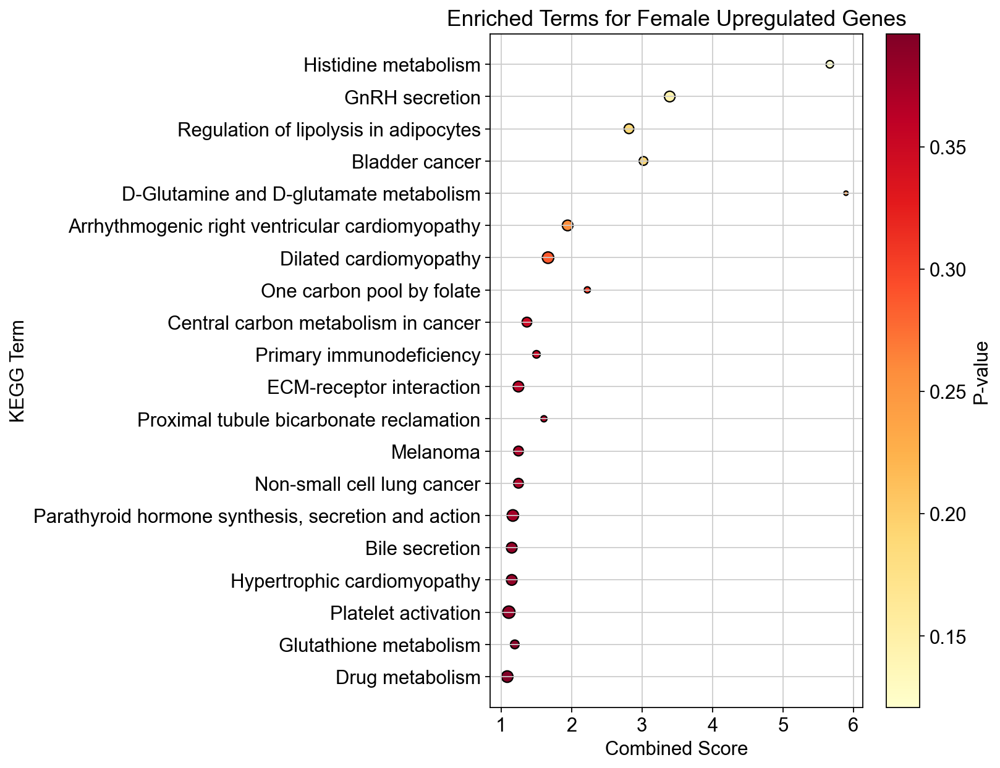

In [193]:
female_up_enrichment_20['Count'] = [int(x.split('/')[0]) for x in female_up_enrichment_20['Overlap']]
female_up_enrichment_20['dot_size'] = female_up_enrichment_20['Count'] * 10
plt.figure(figsize=(10, 8))
scatter = plt.scatter(female_up_enrichment_20['Combined Score'], female_up_enrichment_20['Term'], 
                      s=female_up_enrichment_20['dot_size'], c=female_up_enrichment_20['P-value'], cmap='YlOrRd', edgecolor='black')
plt.xlabel('Combined Score', fontsize=14)
plt.ylabel('KEGG Term', fontsize=14)
plt.title('Enriched Terms for Female Upregulated Genes', fontsize=16)
plt.colorbar(scatter, label='P-value')
handles, labels = scatter.legend_elements(prop="sizes", alpha=0.6)
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

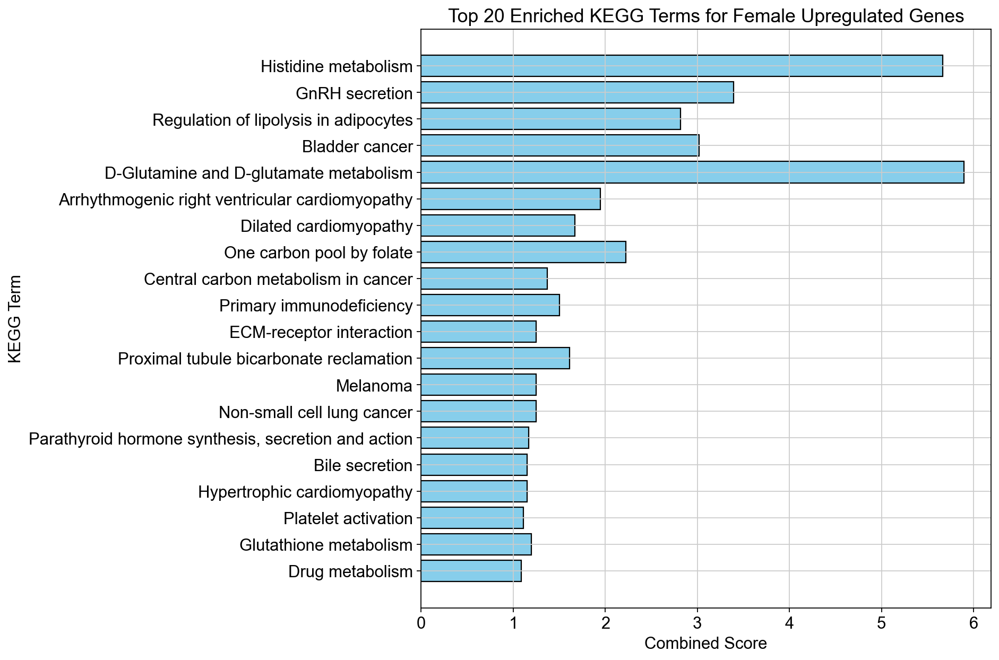

In [198]:
plt.figure(figsize=(12, 8))
bars = plt.barh(female_up_enrichment_20['Term'], female_up_enrichment_20['Combined Score'], 
                color='skyblue', edgecolor='black')

plt.xlabel('Combined Score', fontsize=14)
plt.ylabel('KEGG Term', fontsize=14)
plt.title('Top 20 Enriched KEGG Terms for Female Upregulated Genes', fontsize=16)

plt.gca().invert_yaxis()

plt.tight_layout()
plt.show()

In [194]:
female_down_enrichment = gp.enrichr(gene_list = downregulated_genes, gene_sets = 'KEGG_2021_Human' , organism = 'Mouse')

In [195]:
female_down_enrichment_df = pd.DataFrame(female_down_enrichment.results)
female_down_enrichment_20 = female_down_enrichment_df.head(20)
female_down_enrichment_20

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,KEGG_2021_Human,Vitamin B6 metabolism,3/6,0.014534,0.999996,0,0,9.327479,39.467159,PSAT1;AOX1;PDXP
1,KEGG_2021_Human,Protein digestion and absorption,16/103,0.039311,0.999996,0,0,1.718962,5.563011,SLC6A19;CELA2A;COL16A1;SLC16A10;SLC1A5;COL1A1;...
2,KEGG_2021_Human,Cholesterol metabolism,8/50,0.106755,0.999996,0,0,1.777416,3.976476,CYP27A1;LRPAP1;SORT1;LIPG;LPL;LRP2;CYP7A1;PLTP
3,KEGG_2021_Human,Focal adhesion,25/201,0.116993,0.999996,0,0,1.327316,2.847941,LAMA4;THBS2;ELK1;MYLK3;CCND3;RELN;CCND1;PDGFC;...
4,KEGG_2021_Human,Wnt signaling pathway,21/166,0.124703,0.999996,0,0,1.352832,2.816349,CAMK2B;RNF43;TLE3;TLE2;TCF7;PRICKLE2;AXIN2;WNT...
5,KEGG_2021_Human,TGF-beta signaling pathway,12/94,0.197815,0.999996,0,0,1.365373,2.212483,BMP2;TGFB1;AMHR2;ID4;SMAD6;LTBP1;ACVR2B;BMP7;H...
6,KEGG_2021_Human,Fructose and mannose metabolism,5/33,0.211507,0.999996,0,0,1.665035,2.586630,PFKFB3;AKR1B10;PMM1;HK2;FBP2
7,KEGG_2021_Human,Primary bile acid biosynthesis,3/17,0.224017,0.999996,0,0,1.997528,2.988365,CYP27A1;CYP7B1;CYP7A1
8,KEGG_2021_Human,ECM-receptor interaction,11/88,0.231146,0.999996,0,0,1.332543,1.951784,COL1A1;RELN;COL1A2;COL4A2;COL4A1;COL6A2;LAMA4;...
9,KEGG_2021_Human,Central carbon metabolism in cancer,9/70,0.235136,0.999996,0,0,1.376030,1.991931,PDGFRB;PDGFRA;SLC7A5;LDHB;KIT;ERBB2;SLC2A1;SLC...


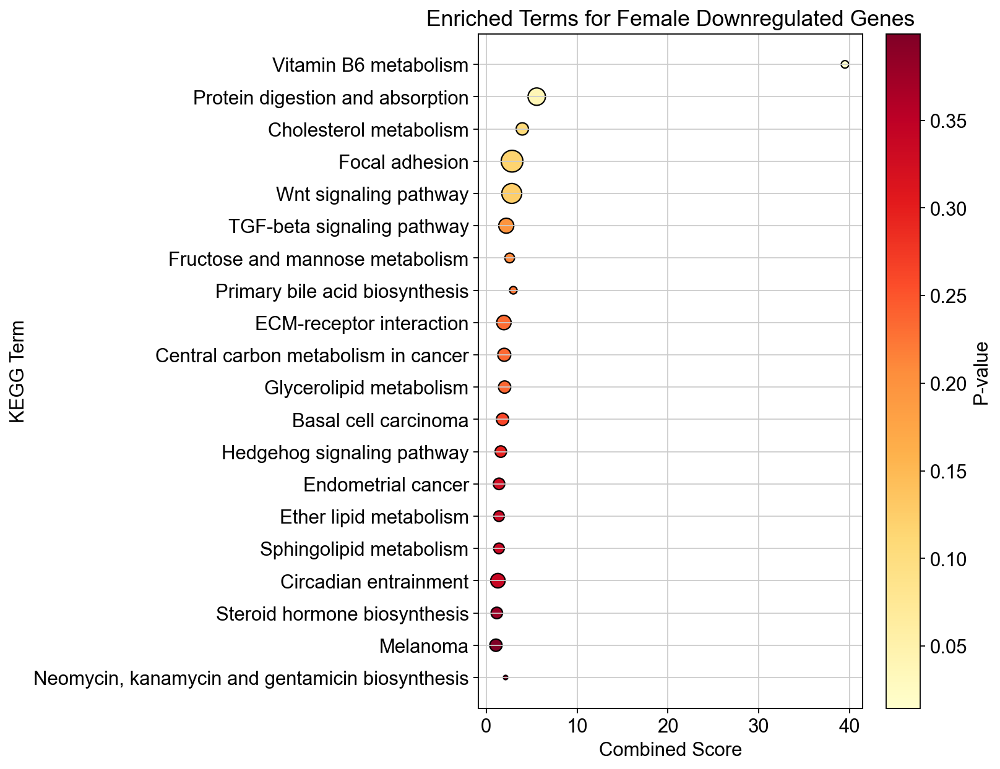

In [196]:
female_down_enrichment_20['Count'] = [int(x.split('/')[0]) for x in female_down_enrichment_20['Overlap']]
female_down_enrichment_20['dot_size'] = female_down_enrichment_20['Count'] * 10
plt.figure(figsize=(10, 8))
scatter = plt.scatter(female_down_enrichment_20['Combined Score'], female_down_enrichment_20['Term'], 
                      s=female_down_enrichment_20['dot_size'], c=female_down_enrichment_20['P-value'], cmap='YlOrRd', edgecolor='black')
plt.xlabel('Combined Score', fontsize=14)
plt.ylabel('KEGG Term', fontsize=14)
plt.title('Enriched Terms for Female Downregulated Genes', fontsize=16)
plt.colorbar(scatter, label='P-value')
handles, labels = scatter.legend_elements(prop="sizes", alpha=0.6)
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

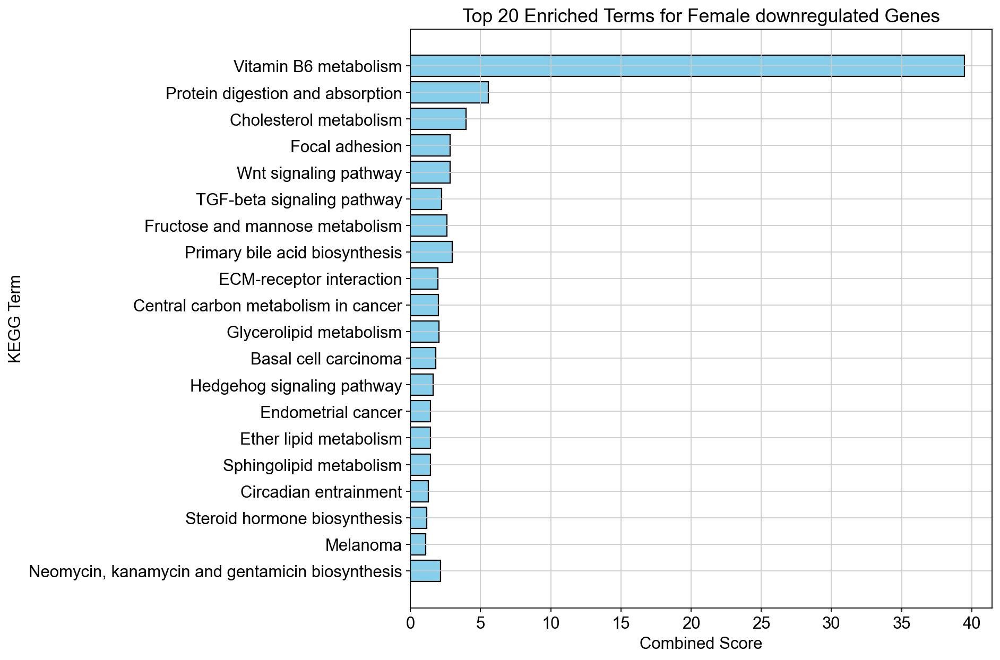

In [197]:
plt.figure(figsize=(12, 8))
bars = plt.barh(female_down_enrichment_20['Term'], female_down_enrichment_20['Combined Score'], 
                color='skyblue', edgecolor='black')

plt.xlabel('Combined Score', fontsize=14)
plt.ylabel('KEGG Term', fontsize=14)
plt.title('Top 20 Enriched Terms for Female downregulated Genes', fontsize=16)

plt.gca().invert_yaxis()

plt.tight_layout()
plt.show()